# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

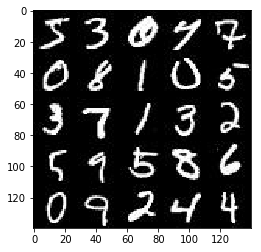

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

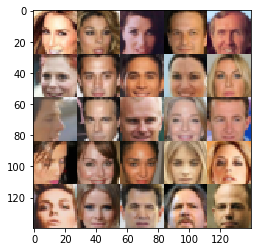

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


/Users/AratzMac/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="real_input")
    z_input = tf.placeholder(tf.float32, [None, z_dim], name="z_input")
    lr = tf.placeholder(tf.float32, name="learning_rate")
    
    return real_input, z_input, lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse = reuse):
        
        # 28 x 28 x 3
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding = 'same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14 x 14 x 64

        x2 = tf.layers.conv2d(relu1, 128, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(alpha * x2, x2)
        # 7 x 7 x 128

        x3 = tf.layers.conv2d(relu2, 256, 5, strides = 2, padding ='same')
        x3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = tf.maximum(alpha * x3, x3)
        # 4 x 4 x 256

        flat = tf.reshape(relu3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope("generator", reuse = not is_train):
        
        x1 = tf.layers.dense(z, 7 * 7 * 512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7 x 7 x 512

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14 x 14 x 256

        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides = 1, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28 x 28 x 128

        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides = 2, padding = 'same')
        # 28 x 28 x out_channel_dim

        out = tf.tanh(logits)

    return out
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.9
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real,labels = tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    input_real, input_z, learning_r = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_r, beta1)
    
    step = 0 
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1
                
                batch_images = batch_images*2

                batch_z = np.random.uniform(-1, 1, size  = (batch_size, z_dim))

                _ = sess.run(d_train_opt, feed_dict = {input_real: batch_images, input_z: batch_z, learning_r:learning_rate})
                _ = sess.run(g_train_opt, feed_dict = {input_z: batch_z, input_real: batch_images, learning_r:learning_rate})

                if step % 10 == 0:
                    train_loss_d = d_loss.eval({input_z:batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z:batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if step %100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)  

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5851... Generator Loss: 1.2198
Epoch 1/2... Discriminator Loss: 1.8456... Generator Loss: 0.4421
Epoch 1/2... Discriminator Loss: 2.8253... Generator Loss: 0.0774
Epoch 1/2... Discriminator Loss: 1.9473... Generator Loss: 0.1870
Epoch 1/2... Discriminator Loss: 1.9313... Generator Loss: 0.2077
Epoch 1/2... Discriminator Loss: 1.9466... Generator Loss: 0.1849
Epoch 1/2... Discriminator Loss: 1.7262... Generator Loss: 0.2751
Epoch 1/2... Discriminator Loss: 1.6916... Generator Loss: 0.2781
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.5033
Epoch 1/2... Discriminator Loss: 1.3609... Generator Loss: 0.4459


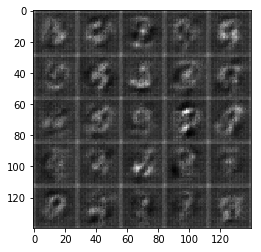

Epoch 1/2... Discriminator Loss: 1.3353... Generator Loss: 0.3924
Epoch 1/2... Discriminator Loss: 1.2397... Generator Loss: 0.4873
Epoch 1/2... Discriminator Loss: 1.1751... Generator Loss: 0.5629
Epoch 1/2... Discriminator Loss: 1.3781... Generator Loss: 0.3809
Epoch 1/2... Discriminator Loss: 1.6325... Generator Loss: 0.2868
Epoch 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.5545
Epoch 1/2... Discriminator Loss: 0.8893... Generator Loss: 1.1074
Epoch 1/2... Discriminator Loss: 1.1314... Generator Loss: 1.6684
Epoch 1/2... Discriminator Loss: 0.9451... Generator Loss: 1.0048
Epoch 1/2... Discriminator Loss: 0.9969... Generator Loss: 2.0371


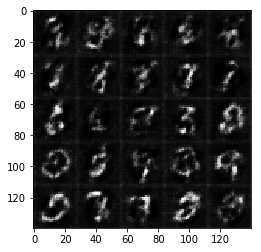

Epoch 1/2... Discriminator Loss: 0.8602... Generator Loss: 1.3682
Epoch 1/2... Discriminator Loss: 1.2416... Generator Loss: 0.4395
Epoch 1/2... Discriminator Loss: 1.3645... Generator Loss: 0.3653
Epoch 1/2... Discriminator Loss: 1.2446... Generator Loss: 0.4417
Epoch 1/2... Discriminator Loss: 0.9413... Generator Loss: 0.6492
Epoch 1/2... Discriminator Loss: 0.7315... Generator Loss: 1.1955
Epoch 1/2... Discriminator Loss: 0.7008... Generator Loss: 1.2843
Epoch 1/2... Discriminator Loss: 1.2626... Generator Loss: 0.4202
Epoch 1/2... Discriminator Loss: 1.0713... Generator Loss: 0.5450
Epoch 1/2... Discriminator Loss: 0.8387... Generator Loss: 0.8406


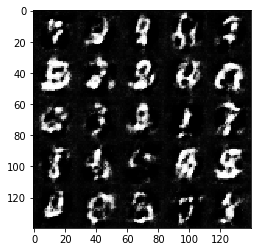

Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 0.8539
Epoch 1/2... Discriminator Loss: 1.1944... Generator Loss: 0.4751
Epoch 1/2... Discriminator Loss: 0.6910... Generator Loss: 1.0521
Epoch 1/2... Discriminator Loss: 0.8948... Generator Loss: 0.9519
Epoch 1/2... Discriminator Loss: 1.0346... Generator Loss: 0.5883
Epoch 1/2... Discriminator Loss: 1.0327... Generator Loss: 0.5786
Epoch 1/2... Discriminator Loss: 0.8351... Generator Loss: 1.3436
Epoch 1/2... Discriminator Loss: 0.7215... Generator Loss: 1.2343
Epoch 1/2... Discriminator Loss: 1.0805... Generator Loss: 0.6020
Epoch 1/2... Discriminator Loss: 1.2858... Generator Loss: 0.4360


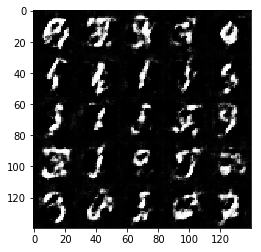

Epoch 1/2... Discriminator Loss: 0.8005... Generator Loss: 0.9551
Epoch 1/2... Discriminator Loss: 1.0312... Generator Loss: 2.5617
Epoch 1/2... Discriminator Loss: 0.8558... Generator Loss: 1.7026
Epoch 1/2... Discriminator Loss: 1.2036... Generator Loss: 0.4396
Epoch 1/2... Discriminator Loss: 0.7725... Generator Loss: 1.6447
Epoch 1/2... Discriminator Loss: 0.8949... Generator Loss: 1.4539
Epoch 1/2... Discriminator Loss: 0.8260... Generator Loss: 1.2437
Epoch 1/2... Discriminator Loss: 0.8719... Generator Loss: 1.2239
Epoch 1/2... Discriminator Loss: 0.9765... Generator Loss: 1.5886
Epoch 1/2... Discriminator Loss: 0.8938... Generator Loss: 1.0133


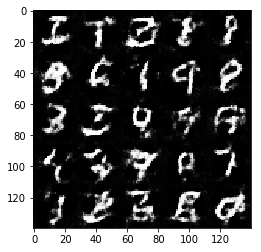

Epoch 1/2... Discriminator Loss: 1.1575... Generator Loss: 1.9597
Epoch 1/2... Discriminator Loss: 0.9038... Generator Loss: 1.3884
Epoch 1/2... Discriminator Loss: 0.9169... Generator Loss: 1.3847
Epoch 1/2... Discriminator Loss: 0.8171... Generator Loss: 1.0987
Epoch 1/2... Discriminator Loss: 0.9217... Generator Loss: 1.6337
Epoch 1/2... Discriminator Loss: 1.5736... Generator Loss: 0.3382
Epoch 1/2... Discriminator Loss: 1.6259... Generator Loss: 0.2907
Epoch 1/2... Discriminator Loss: 0.9000... Generator Loss: 0.8246
Epoch 1/2... Discriminator Loss: 1.3940... Generator Loss: 0.3453
Epoch 1/2... Discriminator Loss: 0.9628... Generator Loss: 0.6651


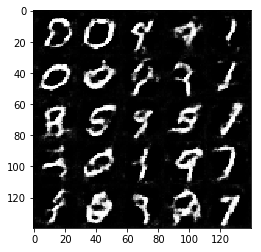

Epoch 1/2... Discriminator Loss: 1.4095... Generator Loss: 0.3948
Epoch 1/2... Discriminator Loss: 0.9641... Generator Loss: 0.6442
Epoch 1/2... Discriminator Loss: 1.4525... Generator Loss: 0.3805
Epoch 1/2... Discriminator Loss: 1.0596... Generator Loss: 0.5922
Epoch 1/2... Discriminator Loss: 1.0206... Generator Loss: 0.8086
Epoch 1/2... Discriminator Loss: 1.0006... Generator Loss: 1.4678
Epoch 1/2... Discriminator Loss: 0.8160... Generator Loss: 1.1769
Epoch 1/2... Discriminator Loss: 0.9877... Generator Loss: 0.7847
Epoch 1/2... Discriminator Loss: 0.9646... Generator Loss: 0.6519
Epoch 1/2... Discriminator Loss: 1.2386... Generator Loss: 0.4539


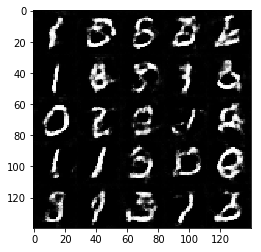

Epoch 1/2... Discriminator Loss: 1.6199... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 0.9944... Generator Loss: 0.6872
Epoch 1/2... Discriminator Loss: 1.1691... Generator Loss: 0.4862
Epoch 1/2... Discriminator Loss: 1.2163... Generator Loss: 0.4931
Epoch 1/2... Discriminator Loss: 1.1839... Generator Loss: 0.4816
Epoch 1/2... Discriminator Loss: 0.8440... Generator Loss: 0.9157
Epoch 1/2... Discriminator Loss: 1.3277... Generator Loss: 0.4175
Epoch 1/2... Discriminator Loss: 1.5713... Generator Loss: 0.3247
Epoch 1/2... Discriminator Loss: 1.0522... Generator Loss: 1.1023
Epoch 1/2... Discriminator Loss: 1.2392... Generator Loss: 0.4587


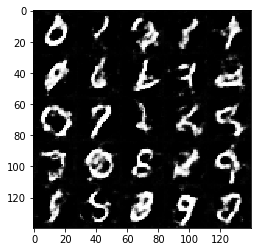

Epoch 1/2... Discriminator Loss: 0.8648... Generator Loss: 0.7907
Epoch 1/2... Discriminator Loss: 1.2689... Generator Loss: 0.4378
Epoch 1/2... Discriminator Loss: 1.0331... Generator Loss: 0.6070
Epoch 1/2... Discriminator Loss: 0.5778... Generator Loss: 1.3688
Epoch 1/2... Discriminator Loss: 0.7668... Generator Loss: 1.1603
Epoch 1/2... Discriminator Loss: 1.7935... Generator Loss: 0.2343
Epoch 1/2... Discriminator Loss: 0.9714... Generator Loss: 0.9260
Epoch 1/2... Discriminator Loss: 0.8689... Generator Loss: 1.0326
Epoch 1/2... Discriminator Loss: 0.8591... Generator Loss: 1.0919
Epoch 1/2... Discriminator Loss: 1.0506... Generator Loss: 0.5531


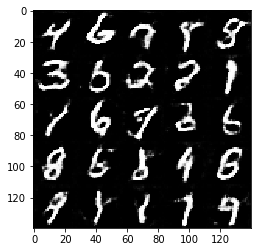

Epoch 1/2... Discriminator Loss: 1.5069... Generator Loss: 0.3398
Epoch 1/2... Discriminator Loss: 1.0695... Generator Loss: 0.5448
Epoch 1/2... Discriminator Loss: 0.9761... Generator Loss: 0.7394
Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 0.6142
Epoch 2/2... Discriminator Loss: 0.8648... Generator Loss: 1.2275
Epoch 2/2... Discriminator Loss: 0.8522... Generator Loss: 0.9923
Epoch 2/2... Discriminator Loss: 1.3601... Generator Loss: 0.4114
Epoch 2/2... Discriminator Loss: 0.9859... Generator Loss: 0.6414
Epoch 2/2... Discriminator Loss: 1.3438... Generator Loss: 0.3923
Epoch 2/2... Discriminator Loss: 1.2183... Generator Loss: 0.4881


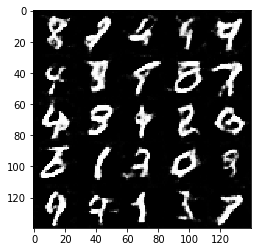

Epoch 2/2... Discriminator Loss: 0.7099... Generator Loss: 1.1319
Epoch 2/2... Discriminator Loss: 0.9029... Generator Loss: 1.9786
Epoch 2/2... Discriminator Loss: 0.7898... Generator Loss: 0.9928
Epoch 2/2... Discriminator Loss: 1.2910... Generator Loss: 2.1388
Epoch 2/2... Discriminator Loss: 0.7504... Generator Loss: 1.0180
Epoch 2/2... Discriminator Loss: 1.0489... Generator Loss: 0.5988
Epoch 2/2... Discriminator Loss: 1.0555... Generator Loss: 0.5852
Epoch 2/2... Discriminator Loss: 1.3170... Generator Loss: 0.4015
Epoch 2/2... Discriminator Loss: 1.0931... Generator Loss: 0.5810
Epoch 2/2... Discriminator Loss: 0.9831... Generator Loss: 0.6253


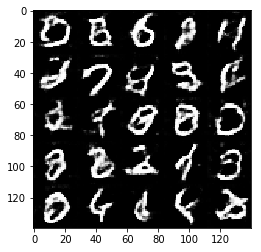

Epoch 2/2... Discriminator Loss: 0.9270... Generator Loss: 0.7857
Epoch 2/2... Discriminator Loss: 0.7738... Generator Loss: 0.8999
Epoch 2/2... Discriminator Loss: 0.6956... Generator Loss: 0.9770
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 1.0913
Epoch 2/2... Discriminator Loss: 2.8313... Generator Loss: 0.0922
Epoch 2/2... Discriminator Loss: 0.9475... Generator Loss: 0.7557
Epoch 2/2... Discriminator Loss: 0.9903... Generator Loss: 0.6697
Epoch 2/2... Discriminator Loss: 1.1763... Generator Loss: 0.4766
Epoch 2/2... Discriminator Loss: 2.3035... Generator Loss: 0.1356
Epoch 2/2... Discriminator Loss: 1.0357... Generator Loss: 0.5711


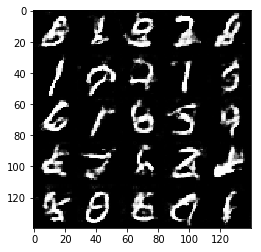

Epoch 2/2... Discriminator Loss: 0.8722... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 0.6921... Generator Loss: 1.4918
Epoch 2/2... Discriminator Loss: 0.9223... Generator Loss: 0.7197
Epoch 2/2... Discriminator Loss: 1.7044... Generator Loss: 0.3354
Epoch 2/2... Discriminator Loss: 0.7217... Generator Loss: 1.2974
Epoch 2/2... Discriminator Loss: 0.6565... Generator Loss: 1.5413
Epoch 2/2... Discriminator Loss: 1.2386... Generator Loss: 0.4613
Epoch 2/2... Discriminator Loss: 0.9878... Generator Loss: 0.7112
Epoch 2/2... Discriminator Loss: 0.8713... Generator Loss: 0.7985
Epoch 2/2... Discriminator Loss: 0.7366... Generator Loss: 1.0768


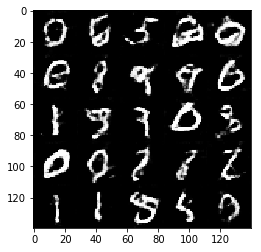

Epoch 2/2... Discriminator Loss: 0.9223... Generator Loss: 0.6882
Epoch 2/2... Discriminator Loss: 1.4167... Generator Loss: 0.4109
Epoch 2/2... Discriminator Loss: 0.6241... Generator Loss: 1.1656
Epoch 2/2... Discriminator Loss: 0.6377... Generator Loss: 1.1529
Epoch 2/2... Discriminator Loss: 1.3462... Generator Loss: 0.4000
Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 0.6634
Epoch 2/2... Discriminator Loss: 0.5516... Generator Loss: 2.0161
Epoch 2/2... Discriminator Loss: 0.5909... Generator Loss: 1.1147
Epoch 2/2... Discriminator Loss: 0.7035... Generator Loss: 0.9043
Epoch 2/2... Discriminator Loss: 1.6141... Generator Loss: 0.3243


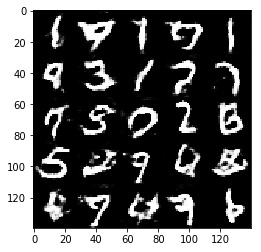

Epoch 2/2... Discriminator Loss: 1.4039... Generator Loss: 0.4304
Epoch 2/2... Discriminator Loss: 0.8904... Generator Loss: 1.1500
Epoch 2/2... Discriminator Loss: 1.2373... Generator Loss: 0.4643
Epoch 2/2... Discriminator Loss: 0.8317... Generator Loss: 0.7623
Epoch 2/2... Discriminator Loss: 1.4186... Generator Loss: 2.2156
Epoch 2/2... Discriminator Loss: 1.3222... Generator Loss: 0.4591
Epoch 2/2... Discriminator Loss: 1.1242... Generator Loss: 0.5193
Epoch 2/2... Discriminator Loss: 0.8747... Generator Loss: 0.7478
Epoch 2/2... Discriminator Loss: 0.7530... Generator Loss: 0.8568
Epoch 2/2... Discriminator Loss: 0.6681... Generator Loss: 1.0288


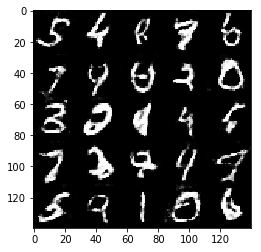

Epoch 2/2... Discriminator Loss: 0.5863... Generator Loss: 1.5062
Epoch 2/2... Discriminator Loss: 0.7932... Generator Loss: 1.0013
Epoch 2/2... Discriminator Loss: 0.5993... Generator Loss: 1.0730
Epoch 2/2... Discriminator Loss: 0.7507... Generator Loss: 0.8992
Epoch 2/2... Discriminator Loss: 0.8039... Generator Loss: 0.8237
Epoch 2/2... Discriminator Loss: 0.9800... Generator Loss: 0.6470
Epoch 2/2... Discriminator Loss: 0.9365... Generator Loss: 0.6950
Epoch 2/2... Discriminator Loss: 0.9669... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 0.8571... Generator Loss: 0.8835
Epoch 2/2... Discriminator Loss: 1.1461... Generator Loss: 2.7091


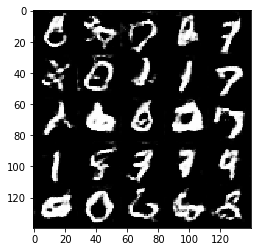

Epoch 2/2... Discriminator Loss: 0.7791... Generator Loss: 0.9254
Epoch 2/2... Discriminator Loss: 0.6764... Generator Loss: 1.2373
Epoch 2/2... Discriminator Loss: 0.9103... Generator Loss: 0.7062
Epoch 2/2... Discriminator Loss: 0.7279... Generator Loss: 1.0933
Epoch 2/2... Discriminator Loss: 0.6751... Generator Loss: 0.9925
Epoch 2/2... Discriminator Loss: 0.9832... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 1.0314... Generator Loss: 0.6494
Epoch 2/2... Discriminator Loss: 0.6056... Generator Loss: 1.0752
Epoch 2/2... Discriminator Loss: 0.7049... Generator Loss: 0.8842
Epoch 2/2... Discriminator Loss: 1.0131... Generator Loss: 0.5811


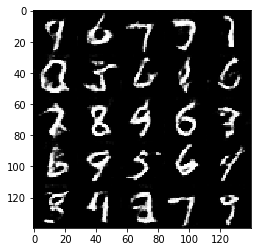

Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 0.7529
Epoch 2/2... Discriminator Loss: 1.0583... Generator Loss: 0.5543
Epoch 2/2... Discriminator Loss: 2.1026... Generator Loss: 0.2354
Epoch 2/2... Discriminator Loss: 0.8303... Generator Loss: 0.8306
Epoch 2/2... Discriminator Loss: 0.6539... Generator Loss: 1.0169
Epoch 2/2... Discriminator Loss: 0.9396... Generator Loss: 0.6698
Epoch 2/2... Discriminator Loss: 0.8288... Generator Loss: 0.7752
Epoch 2/2... Discriminator Loss: 2.4978... Generator Loss: 0.1355
Epoch 2/2... Discriminator Loss: 0.5883... Generator Loss: 1.1552
Epoch 2/2... Discriminator Loss: 0.8696... Generator Loss: 1.2913


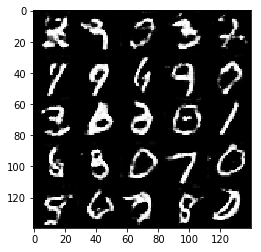

Epoch 2/2... Discriminator Loss: 1.9520... Generator Loss: 0.2301
Epoch 2/2... Discriminator Loss: 1.1515... Generator Loss: 0.5278
Epoch 2/2... Discriminator Loss: 0.7315... Generator Loss: 0.8564
Epoch 2/2... Discriminator Loss: 0.9641... Generator Loss: 0.6845
Epoch 2/2... Discriminator Loss: 0.6151... Generator Loss: 1.9040
Epoch 2/2... Discriminator Loss: 0.5511... Generator Loss: 1.2916
Epoch 2/2... Discriminator Loss: 0.6395... Generator Loss: 1.0227


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/2... Discriminator Loss: 0.2268... Generator Loss: 5.8748
Epoch 1/2... Discriminator Loss: 3.5558... Generator Loss: 0.0897
Epoch 1/2... Discriminator Loss: 2.3114... Generator Loss: 0.1414
Epoch 1/2... Discriminator Loss: 2.0697... Generator Loss: 0.1855
Epoch 1/2... Discriminator Loss: 1.7321... Generator Loss: 0.3283
Epoch 1/2... Discriminator Loss: 1.9605... Generator Loss: 0.2167
Epoch 1/2... Discriminator Loss: 1.7009... Generator Loss: 0.2759
Epoch 1/2... Discriminator Loss: 1.5487... Generator Loss: 1.0236
Epoch 1/2... Discriminator Loss: 1.5045... Generator Loss: 0.8606
Epoch 1/2... Discriminator Loss: 1.5123... Generator Loss: 1.2379


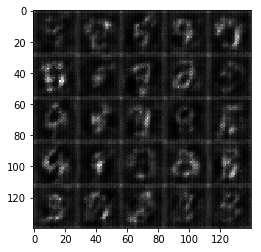

Epoch 1/2... Discriminator Loss: 1.3305... Generator Loss: 1.1300
Epoch 1/2... Discriminator Loss: 1.2683... Generator Loss: 1.0199
Epoch 1/2... Discriminator Loss: 1.4811... Generator Loss: 0.9503
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 1.0002
Epoch 1/2... Discriminator Loss: 1.3741... Generator Loss: 0.9015
Epoch 1/2... Discriminator Loss: 1.4547... Generator Loss: 0.3922
Epoch 1/2... Discriminator Loss: 1.4619... Generator Loss: 0.3802
Epoch 1/2... Discriminator Loss: 1.3833... Generator Loss: 1.1107
Epoch 1/2... Discriminator Loss: 1.4396... Generator Loss: 1.2501
Epoch 1/2... Discriminator Loss: 1.2700... Generator Loss: 1.2496


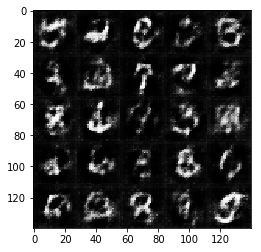

Epoch 1/2... Discriminator Loss: 1.4979... Generator Loss: 1.6744
Epoch 1/2... Discriminator Loss: 1.3132... Generator Loss: 0.6384
Epoch 1/2... Discriminator Loss: 1.3317... Generator Loss: 0.6428
Epoch 1/2... Discriminator Loss: 1.9187... Generator Loss: 0.2044
Epoch 1/2... Discriminator Loss: 1.4408... Generator Loss: 0.4014
Epoch 1/2... Discriminator Loss: 1.5380... Generator Loss: 0.3434
Epoch 1/2... Discriminator Loss: 1.2772... Generator Loss: 0.6164
Epoch 1/2... Discriminator Loss: 1.6516... Generator Loss: 0.2944
Epoch 1/2... Discriminator Loss: 1.7123... Generator Loss: 0.2696
Epoch 1/2... Discriminator Loss: 1.4979... Generator Loss: 0.3693


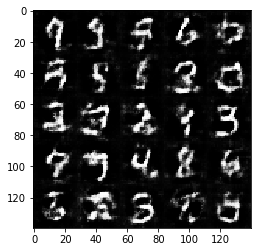

Epoch 1/2... Discriminator Loss: 1.2872... Generator Loss: 0.5125
Epoch 1/2... Discriminator Loss: 1.5435... Generator Loss: 0.3303
Epoch 1/2... Discriminator Loss: 1.4107... Generator Loss: 0.4158
Epoch 1/2... Discriminator Loss: 1.3225... Generator Loss: 0.4477
Epoch 1/2... Discriminator Loss: 1.1289... Generator Loss: 1.3354
Epoch 1/2... Discriminator Loss: 1.5236... Generator Loss: 0.3416
Epoch 1/2... Discriminator Loss: 1.5082... Generator Loss: 0.3610
Epoch 1/2... Discriminator Loss: 1.0668... Generator Loss: 0.8998
Epoch 1/2... Discriminator Loss: 1.4027... Generator Loss: 0.8569
Epoch 1/2... Discriminator Loss: 1.4811... Generator Loss: 1.2633


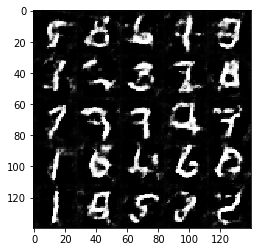

Epoch 1/2... Discriminator Loss: 1.1668... Generator Loss: 0.7941
Epoch 1/2... Discriminator Loss: 1.6000... Generator Loss: 0.3035
Epoch 1/2... Discriminator Loss: 1.4237... Generator Loss: 0.4310
Epoch 1/2... Discriminator Loss: 1.7129... Generator Loss: 0.2472
Epoch 1/2... Discriminator Loss: 1.1462... Generator Loss: 0.6666
Epoch 1/2... Discriminator Loss: 1.0354... Generator Loss: 1.0231
Epoch 1/2... Discriminator Loss: 1.2801... Generator Loss: 1.2161
Epoch 1/2... Discriminator Loss: 1.2861... Generator Loss: 0.9943
Epoch 1/2... Discriminator Loss: 1.4373... Generator Loss: 1.4720
Epoch 1/2... Discriminator Loss: 1.0916... Generator Loss: 1.0592


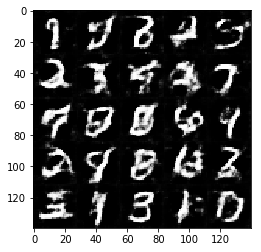

Epoch 1/2... Discriminator Loss: 1.2936... Generator Loss: 1.4293
Epoch 1/2... Discriminator Loss: 1.6013... Generator Loss: 0.3153
Epoch 1/2... Discriminator Loss: 1.3238... Generator Loss: 1.3068
Epoch 1/2... Discriminator Loss: 1.0316... Generator Loss: 0.9344
Epoch 1/2... Discriminator Loss: 1.2777... Generator Loss: 1.3939
Epoch 1/2... Discriminator Loss: 1.1595... Generator Loss: 0.8976
Epoch 1/2... Discriminator Loss: 1.5671... Generator Loss: 0.3249
Epoch 1/2... Discriminator Loss: 1.2214... Generator Loss: 0.5090
Epoch 1/2... Discriminator Loss: 1.2598... Generator Loss: 0.4772
Epoch 1/2... Discriminator Loss: 1.5186... Generator Loss: 0.3256


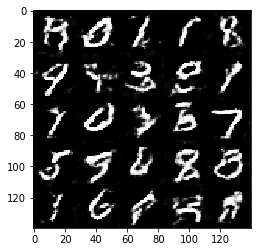

Epoch 1/2... Discriminator Loss: 1.8666... Generator Loss: 0.2185
Epoch 1/2... Discriminator Loss: 1.1807... Generator Loss: 0.6525
Epoch 1/2... Discriminator Loss: 1.1877... Generator Loss: 0.5691
Epoch 1/2... Discriminator Loss: 1.4592... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.2378... Generator Loss: 0.5157
Epoch 1/2... Discriminator Loss: 1.1690... Generator Loss: 0.6832
Epoch 1/2... Discriminator Loss: 1.0608... Generator Loss: 0.8606
Epoch 1/2... Discriminator Loss: 1.5244... Generator Loss: 1.6172
Epoch 1/2... Discriminator Loss: 1.3985... Generator Loss: 0.3891
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 0.5737


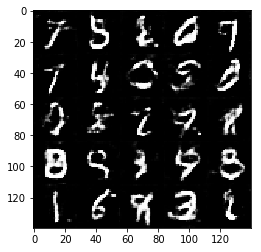

Epoch 1/2... Discriminator Loss: 2.6865... Generator Loss: 0.1073
Epoch 1/2... Discriminator Loss: 1.0278... Generator Loss: 1.0056
Epoch 1/2... Discriminator Loss: 0.9026... Generator Loss: 1.5156
Epoch 1/2... Discriminator Loss: 1.1043... Generator Loss: 0.8284
Epoch 1/2... Discriminator Loss: 1.5636... Generator Loss: 0.3215
Epoch 1/2... Discriminator Loss: 1.2366... Generator Loss: 0.4826
Epoch 1/2... Discriminator Loss: 1.6988... Generator Loss: 0.2727
Epoch 1/2... Discriminator Loss: 1.8077... Generator Loss: 0.2468
Epoch 1/2... Discriminator Loss: 1.9153... Generator Loss: 0.1915
Epoch 1/2... Discriminator Loss: 1.5932... Generator Loss: 0.2988


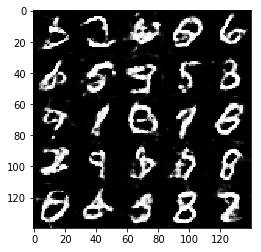

Epoch 1/2... Discriminator Loss: 0.9984... Generator Loss: 0.9045
Epoch 1/2... Discriminator Loss: 1.2679... Generator Loss: 0.4549
Epoch 1/2... Discriminator Loss: 1.2358... Generator Loss: 0.5224
Epoch 1/2... Discriminator Loss: 0.5563... Generator Loss: 1.4906
Epoch 1/2... Discriminator Loss: 1.0577... Generator Loss: 0.7358
Epoch 1/2... Discriminator Loss: 1.9992... Generator Loss: 0.1760
Epoch 1/2... Discriminator Loss: 1.1228... Generator Loss: 1.0014
Epoch 1/2... Discriminator Loss: 0.9230... Generator Loss: 1.3583
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 0.6197
Epoch 1/2... Discriminator Loss: 1.5548... Generator Loss: 2.3461


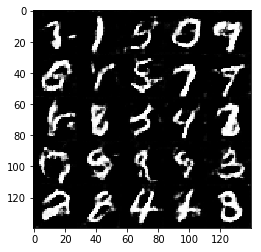

Epoch 1/2... Discriminator Loss: 0.9021... Generator Loss: 1.3434
Epoch 1/2... Discriminator Loss: 0.8961... Generator Loss: 1.1664
Epoch 1/2... Discriminator Loss: 1.1268... Generator Loss: 0.6244
Epoch 2/2... Discriminator Loss: 1.7282... Generator Loss: 0.2795
Epoch 2/2... Discriminator Loss: 1.1547... Generator Loss: 0.6615
Epoch 2/2... Discriminator Loss: 0.9653... Generator Loss: 0.7029
Epoch 2/2... Discriminator Loss: 0.9935... Generator Loss: 1.5866
Epoch 2/2... Discriminator Loss: 1.1742... Generator Loss: 1.8643
Epoch 2/2... Discriminator Loss: 1.4944... Generator Loss: 0.3327
Epoch 2/2... Discriminator Loss: 0.8365... Generator Loss: 1.3675


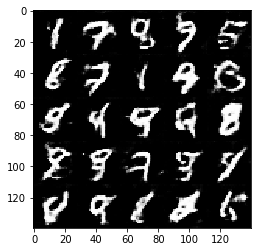

Epoch 2/2... Discriminator Loss: 1.2812... Generator Loss: 0.4770
Epoch 2/2... Discriminator Loss: 0.9034... Generator Loss: 0.7180
Epoch 2/2... Discriminator Loss: 0.5710... Generator Loss: 1.2043
Epoch 2/2... Discriminator Loss: 1.3101... Generator Loss: 1.6145
Epoch 2/2... Discriminator Loss: 1.1459... Generator Loss: 0.5478
Epoch 2/2... Discriminator Loss: 0.8457... Generator Loss: 1.3355
Epoch 2/2... Discriminator Loss: 1.0644... Generator Loss: 2.0432
Epoch 2/2... Discriminator Loss: 1.0256... Generator Loss: 1.1606
Epoch 2/2... Discriminator Loss: 0.7385... Generator Loss: 1.1541
Epoch 2/2... Discriminator Loss: 2.2316... Generator Loss: 0.1533


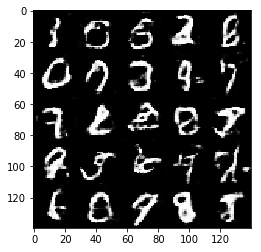

Epoch 2/2... Discriminator Loss: 0.9422... Generator Loss: 0.7353
Epoch 2/2... Discriminator Loss: 1.3077... Generator Loss: 0.4178
Epoch 2/2... Discriminator Loss: 1.2267... Generator Loss: 0.4715
Epoch 2/2... Discriminator Loss: 0.6793... Generator Loss: 0.9536
Epoch 2/2... Discriminator Loss: 0.5128... Generator Loss: 1.2721
Epoch 2/2... Discriminator Loss: 0.9725... Generator Loss: 2.6928
Epoch 2/2... Discriminator Loss: 1.4115... Generator Loss: 0.5106
Epoch 2/2... Discriminator Loss: 1.3096... Generator Loss: 0.4637
Epoch 2/2... Discriminator Loss: 0.7439... Generator Loss: 1.2885
Epoch 2/2... Discriminator Loss: 0.5808... Generator Loss: 1.3899


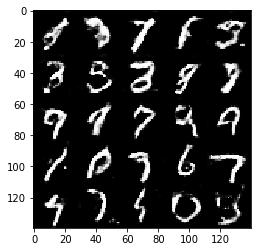

Epoch 2/2... Discriminator Loss: 1.0339... Generator Loss: 1.5785
Epoch 2/2... Discriminator Loss: 0.8839... Generator Loss: 1.4252
Epoch 2/2... Discriminator Loss: 1.6014... Generator Loss: 0.4516
Epoch 2/2... Discriminator Loss: 1.3298... Generator Loss: 0.4631
Epoch 2/2... Discriminator Loss: 0.8485... Generator Loss: 0.8151
Epoch 2/2... Discriminator Loss: 0.8977... Generator Loss: 1.2039
Epoch 2/2... Discriminator Loss: 1.7009... Generator Loss: 0.3319
Epoch 2/2... Discriminator Loss: 1.0920... Generator Loss: 0.5683
Epoch 2/2... Discriminator Loss: 0.3396... Generator Loss: 1.9417
Epoch 2/2... Discriminator Loss: 1.1645... Generator Loss: 2.8682


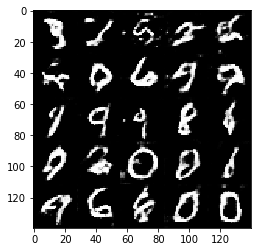

Epoch 2/2... Discriminator Loss: 0.9746... Generator Loss: 0.8527
Epoch 2/2... Discriminator Loss: 1.4130... Generator Loss: 1.9075
Epoch 2/2... Discriminator Loss: 1.0322... Generator Loss: 0.9228
Epoch 2/2... Discriminator Loss: 0.9415... Generator Loss: 0.7641
Epoch 2/2... Discriminator Loss: 2.4937... Generator Loss: 0.1311
Epoch 2/2... Discriminator Loss: 1.3624... Generator Loss: 0.4735
Epoch 2/2... Discriminator Loss: 1.3942... Generator Loss: 0.3884
Epoch 2/2... Discriminator Loss: 0.4812... Generator Loss: 1.3639
Epoch 2/2... Discriminator Loss: 1.4237... Generator Loss: 0.4167
Epoch 2/2... Discriminator Loss: 1.1726... Generator Loss: 1.7845


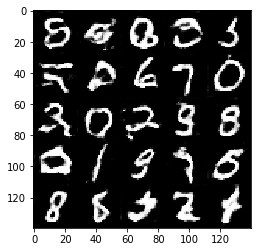

Epoch 2/2... Discriminator Loss: 1.9032... Generator Loss: 0.2492
Epoch 2/2... Discriminator Loss: 0.7085... Generator Loss: 1.0933
Epoch 2/2... Discriminator Loss: 0.7810... Generator Loss: 0.9066
Epoch 2/2... Discriminator Loss: 0.3921... Generator Loss: 1.5123
Epoch 2/2... Discriminator Loss: 0.5742... Generator Loss: 1.2745
Epoch 2/2... Discriminator Loss: 1.6585... Generator Loss: 2.5807
Epoch 2/2... Discriminator Loss: 0.9197... Generator Loss: 2.1416
Epoch 2/2... Discriminator Loss: 0.8324... Generator Loss: 0.8509
Epoch 2/2... Discriminator Loss: 0.6023... Generator Loss: 1.0368
Epoch 2/2... Discriminator Loss: 0.4458... Generator Loss: 1.4285


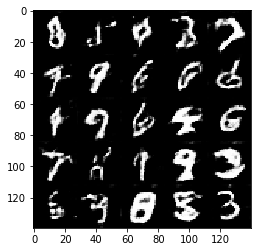

Epoch 2/2... Discriminator Loss: 1.0296... Generator Loss: 2.3944
Epoch 2/2... Discriminator Loss: 0.7569... Generator Loss: 0.9164
Epoch 2/2... Discriminator Loss: 0.4113... Generator Loss: 1.6471
Epoch 2/2... Discriminator Loss: 0.3778... Generator Loss: 1.5585
Epoch 2/2... Discriminator Loss: 0.4473... Generator Loss: 1.3046
Epoch 2/2... Discriminator Loss: 0.2652... Generator Loss: 2.7701
Epoch 2/2... Discriminator Loss: 1.0563... Generator Loss: 0.7699
Epoch 2/2... Discriminator Loss: 0.7741... Generator Loss: 2.7981
Epoch 2/2... Discriminator Loss: 0.7436... Generator Loss: 1.1165
Epoch 2/2... Discriminator Loss: 0.8767... Generator Loss: 1.6728


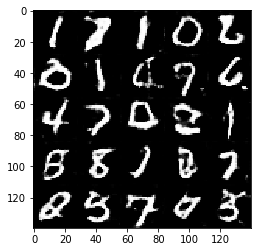

Epoch 2/2... Discriminator Loss: 0.7282... Generator Loss: 1.1147
Epoch 2/2... Discriminator Loss: 0.9225... Generator Loss: 2.4789
Epoch 2/2... Discriminator Loss: 1.0078... Generator Loss: 0.7058
Epoch 2/2... Discriminator Loss: 0.7473... Generator Loss: 0.9541
Epoch 2/2... Discriminator Loss: 0.4115... Generator Loss: 1.4111
Epoch 2/2... Discriminator Loss: 1.3678... Generator Loss: 0.5265
Epoch 2/2... Discriminator Loss: 0.5228... Generator Loss: 1.1977
Epoch 2/2... Discriminator Loss: 0.4567... Generator Loss: 1.3120
Epoch 2/2... Discriminator Loss: 0.5116... Generator Loss: 1.2281
Epoch 2/2... Discriminator Loss: 0.9623... Generator Loss: 0.6867


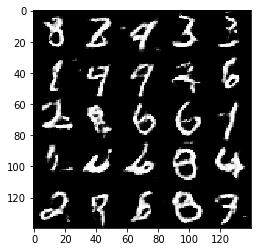

Epoch 2/2... Discriminator Loss: 1.1724... Generator Loss: 0.6404
Epoch 2/2... Discriminator Loss: 1.5521... Generator Loss: 0.3581
Epoch 2/2... Discriminator Loss: 1.3570... Generator Loss: 0.4999
Epoch 2/2... Discriminator Loss: 0.7940... Generator Loss: 0.9481
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 2.9003
Epoch 2/2... Discriminator Loss: 0.6422... Generator Loss: 1.1652
Epoch 2/2... Discriminator Loss: 0.8479... Generator Loss: 1.0160
Epoch 2/2... Discriminator Loss: 1.8582... Generator Loss: 0.4078
Epoch 2/2... Discriminator Loss: 0.9500... Generator Loss: 0.7408
Epoch 2/2... Discriminator Loss: 1.2002... Generator Loss: 1.7960


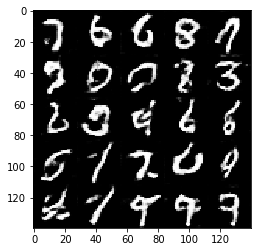

Epoch 2/2... Discriminator Loss: 1.1363... Generator Loss: 0.6093
Epoch 2/2... Discriminator Loss: 1.0181... Generator Loss: 0.8381
Epoch 2/2... Discriminator Loss: 0.9419... Generator Loss: 0.7259
Epoch 2/2... Discriminator Loss: 0.8628... Generator Loss: 0.7897
Epoch 2/2... Discriminator Loss: 1.5531... Generator Loss: 0.3384
Epoch 2/2... Discriminator Loss: 0.7033... Generator Loss: 2.0082
Epoch 2/2... Discriminator Loss: 0.4786... Generator Loss: 1.5821


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.0008
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/2... Discriminator Loss: 0.0419... Generator Loss: 4.2444
Epoch 1/2... Discriminator Loss: 0.0579... Generator Loss: 3.4087
Epoch 1/2... Discriminator Loss: 0.0618... Generator Loss: 4.6090
Epoch 1/2... Discriminator Loss: 2.6454... Generator Loss: 0.2535
Epoch 1/2... Discriminator Loss: 1.2495... Generator Loss: 0.6770
Epoch 1/2... Discriminator Loss: 1.7784... Generator Loss: 0.6163
Epoch 1/2... Discriminator Loss: 1.0415... Generator Loss: 0.7726
Epoch 1/2... Discriminator Loss: 1.4061... Generator Loss: 1.2550
Epoch 1/2... Discriminator Loss: 0.8395... Generator Loss: 1.5002
Epoch 1/2... Discriminator Loss: 0.9412... Generator Loss: 0.8705


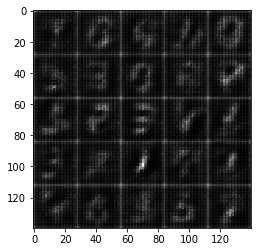

Epoch 1/2... Discriminator Loss: 0.7615... Generator Loss: 1.0758
Epoch 1/2... Discriminator Loss: 1.2856... Generator Loss: 0.5241
Epoch 1/2... Discriminator Loss: 1.0666... Generator Loss: 0.7809
Epoch 1/2... Discriminator Loss: 0.9223... Generator Loss: 0.9552
Epoch 1/2... Discriminator Loss: 0.9681... Generator Loss: 1.2563
Epoch 1/2... Discriminator Loss: 0.9947... Generator Loss: 1.3495
Epoch 1/2... Discriminator Loss: 0.9903... Generator Loss: 1.0858
Epoch 1/2... Discriminator Loss: 0.9834... Generator Loss: 1.1876
Epoch 1/2... Discriminator Loss: 0.9190... Generator Loss: 0.8968
Epoch 1/2... Discriminator Loss: 0.7669... Generator Loss: 1.1318


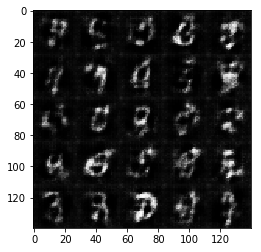

Epoch 1/2... Discriminator Loss: 0.9869... Generator Loss: 1.8019
Epoch 1/2... Discriminator Loss: 0.9082... Generator Loss: 1.0460
Epoch 1/2... Discriminator Loss: 1.0077... Generator Loss: 0.8087
Epoch 1/2... Discriminator Loss: 1.0384... Generator Loss: 0.6807
Epoch 1/2... Discriminator Loss: 0.8061... Generator Loss: 1.1696
Epoch 1/2... Discriminator Loss: 0.8951... Generator Loss: 0.7399
Epoch 1/2... Discriminator Loss: 0.6936... Generator Loss: 1.5324
Epoch 1/2... Discriminator Loss: 1.0316... Generator Loss: 0.6787
Epoch 1/2... Discriminator Loss: 0.8687... Generator Loss: 1.0294
Epoch 1/2... Discriminator Loss: 0.6263... Generator Loss: 1.2300


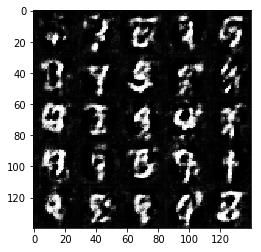

Epoch 1/2... Discriminator Loss: 0.6628... Generator Loss: 1.7656
Epoch 1/2... Discriminator Loss: 0.8404... Generator Loss: 0.9221
Epoch 1/2... Discriminator Loss: 0.6085... Generator Loss: 1.3816
Epoch 1/2... Discriminator Loss: 0.8428... Generator Loss: 0.7778
Epoch 1/2... Discriminator Loss: 0.6866... Generator Loss: 1.0416
Epoch 1/2... Discriminator Loss: 0.7223... Generator Loss: 1.8769
Epoch 1/2... Discriminator Loss: 0.8328... Generator Loss: 0.7716
Epoch 1/2... Discriminator Loss: 0.5447... Generator Loss: 1.2870
Epoch 1/2... Discriminator Loss: 0.8674... Generator Loss: 0.8404
Epoch 1/2... Discriminator Loss: 0.8621... Generator Loss: 0.8579


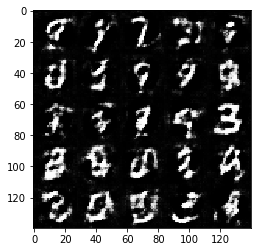

Epoch 1/2... Discriminator Loss: 0.6527... Generator Loss: 1.5754
Epoch 1/2... Discriminator Loss: 0.6187... Generator Loss: 1.1450
Epoch 1/2... Discriminator Loss: 0.6464... Generator Loss: 1.5017
Epoch 1/2... Discriminator Loss: 0.6007... Generator Loss: 1.2654
Epoch 1/2... Discriminator Loss: 0.6616... Generator Loss: 1.1389
Epoch 1/2... Discriminator Loss: 0.9253... Generator Loss: 0.7587
Epoch 1/2... Discriminator Loss: 0.8411... Generator Loss: 0.7824
Epoch 1/2... Discriminator Loss: 0.7686... Generator Loss: 1.3169
Epoch 1/2... Discriminator Loss: 0.8034... Generator Loss: 0.9401
Epoch 1/2... Discriminator Loss: 0.8853... Generator Loss: 0.8047


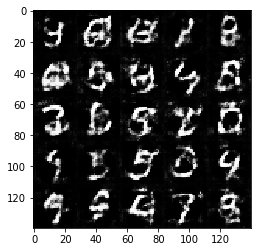

Epoch 1/2... Discriminator Loss: 0.8224... Generator Loss: 0.9368
Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 0.8055
Epoch 1/2... Discriminator Loss: 0.7017... Generator Loss: 1.6209
Epoch 1/2... Discriminator Loss: 0.6208... Generator Loss: 1.2102
Epoch 1/2... Discriminator Loss: 0.8535... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.2934... Generator Loss: 0.4673
Epoch 1/2... Discriminator Loss: 1.2524... Generator Loss: 0.4892
Epoch 1/2... Discriminator Loss: 0.8343... Generator Loss: 0.8557
Epoch 1/2... Discriminator Loss: 0.7939... Generator Loss: 0.9003
Epoch 1/2... Discriminator Loss: 0.6743... Generator Loss: 1.2144


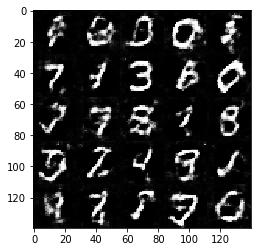

Epoch 1/2... Discriminator Loss: 0.7662... Generator Loss: 1.0101
Epoch 1/2... Discriminator Loss: 0.7300... Generator Loss: 1.2642
Epoch 1/2... Discriminator Loss: 1.1345... Generator Loss: 0.5311
Epoch 1/2... Discriminator Loss: 0.6114... Generator Loss: 1.3306
Epoch 1/2... Discriminator Loss: 0.9984... Generator Loss: 0.7865
Epoch 1/2... Discriminator Loss: 0.9656... Generator Loss: 1.1836
Epoch 1/2... Discriminator Loss: 0.7150... Generator Loss: 1.6270
Epoch 1/2... Discriminator Loss: 0.9213... Generator Loss: 0.8679
Epoch 1/2... Discriminator Loss: 0.6283... Generator Loss: 1.2891
Epoch 1/2... Discriminator Loss: 0.6857... Generator Loss: 1.4858


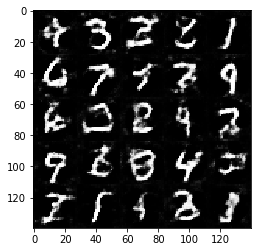

Epoch 1/2... Discriminator Loss: 1.3054... Generator Loss: 0.4711
Epoch 1/2... Discriminator Loss: 0.6661... Generator Loss: 1.2770
Epoch 1/2... Discriminator Loss: 1.2215... Generator Loss: 2.4542
Epoch 1/2... Discriminator Loss: 0.5206... Generator Loss: 1.4681
Epoch 1/2... Discriminator Loss: 0.7062... Generator Loss: 1.1392
Epoch 1/2... Discriminator Loss: 0.6535... Generator Loss: 1.1298
Epoch 1/2... Discriminator Loss: 0.6405... Generator Loss: 1.1477
Epoch 1/2... Discriminator Loss: 0.9206... Generator Loss: 0.7865
Epoch 1/2... Discriminator Loss: 0.9652... Generator Loss: 0.6638
Epoch 1/2... Discriminator Loss: 0.6057... Generator Loss: 1.5043


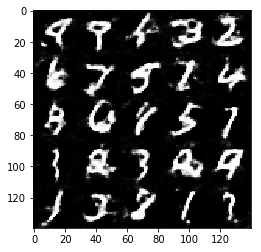

Epoch 1/2... Discriminator Loss: 0.7604... Generator Loss: 1.1025
Epoch 1/2... Discriminator Loss: 0.6861... Generator Loss: 1.1803
Epoch 1/2... Discriminator Loss: 0.9872... Generator Loss: 0.6110
Epoch 1/2... Discriminator Loss: 0.5622... Generator Loss: 1.8140
Epoch 1/2... Discriminator Loss: 0.7020... Generator Loss: 0.9194
Epoch 1/2... Discriminator Loss: 2.0358... Generator Loss: 0.2728
Epoch 1/2... Discriminator Loss: 0.9137... Generator Loss: 0.9658
Epoch 1/2... Discriminator Loss: 0.6699... Generator Loss: 1.2096
Epoch 1/2... Discriminator Loss: 0.7599... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 0.6600... Generator Loss: 1.0217


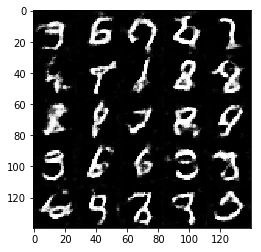

Epoch 1/2... Discriminator Loss: 0.6624... Generator Loss: 1.1451
Epoch 1/2... Discriminator Loss: 0.5650... Generator Loss: 1.4131
Epoch 1/2... Discriminator Loss: 1.1887... Generator Loss: 0.5100
Epoch 2/2... Discriminator Loss: 0.8912... Generator Loss: 0.7799
Epoch 2/2... Discriminator Loss: 0.5324... Generator Loss: 1.5901
Epoch 2/2... Discriminator Loss: 0.6869... Generator Loss: 1.2731
Epoch 2/2... Discriminator Loss: 0.9413... Generator Loss: 0.7083
Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 1.1660
Epoch 2/2... Discriminator Loss: 1.0033... Generator Loss: 0.7396
Epoch 2/2... Discriminator Loss: 0.6359... Generator Loss: 1.8733


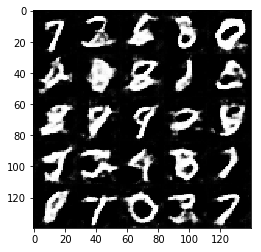

Epoch 2/2... Discriminator Loss: 0.5088... Generator Loss: 1.7240
Epoch 2/2... Discriminator Loss: 0.6130... Generator Loss: 1.3707
Epoch 2/2... Discriminator Loss: 0.6963... Generator Loss: 0.9905
Epoch 2/2... Discriminator Loss: 1.0241... Generator Loss: 0.6484
Epoch 2/2... Discriminator Loss: 0.5834... Generator Loss: 1.3464
Epoch 2/2... Discriminator Loss: 1.0105... Generator Loss: 0.7101
Epoch 2/2... Discriminator Loss: 0.6725... Generator Loss: 1.4416
Epoch 2/2... Discriminator Loss: 1.0550... Generator Loss: 0.5795
Epoch 2/2... Discriminator Loss: 0.6378... Generator Loss: 1.1021
Epoch 2/2... Discriminator Loss: 1.0573... Generator Loss: 0.5846


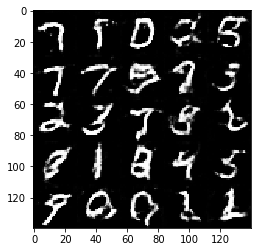

Epoch 2/2... Discriminator Loss: 0.7098... Generator Loss: 1.5884
Epoch 2/2... Discriminator Loss: 0.7080... Generator Loss: 1.2110
Epoch 2/2... Discriminator Loss: 0.5600... Generator Loss: 1.2887
Epoch 2/2... Discriminator Loss: 0.6454... Generator Loss: 0.9925
Epoch 2/2... Discriminator Loss: 0.5916... Generator Loss: 1.2065
Epoch 2/2... Discriminator Loss: 0.6671... Generator Loss: 1.0974
Epoch 2/2... Discriminator Loss: 0.6853... Generator Loss: 1.0415
Epoch 2/2... Discriminator Loss: 0.9292... Generator Loss: 0.7325
Epoch 2/2... Discriminator Loss: 0.9372... Generator Loss: 0.6572
Epoch 2/2... Discriminator Loss: 0.4677... Generator Loss: 1.5583


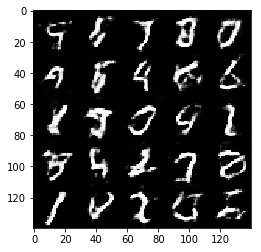

Epoch 2/2... Discriminator Loss: 0.5172... Generator Loss: 1.7881
Epoch 2/2... Discriminator Loss: 1.6997... Generator Loss: 4.0867
Epoch 2/2... Discriminator Loss: 0.7376... Generator Loss: 0.9361
Epoch 2/2... Discriminator Loss: 0.6625... Generator Loss: 1.0760
Epoch 2/2... Discriminator Loss: 0.5525... Generator Loss: 1.3865
Epoch 2/2... Discriminator Loss: 0.7167... Generator Loss: 1.6571
Epoch 2/2... Discriminator Loss: 0.5770... Generator Loss: 1.3714
Epoch 2/2... Discriminator Loss: 0.7449... Generator Loss: 0.8713
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 2.0571
Epoch 2/2... Discriminator Loss: 0.6017... Generator Loss: 1.2955


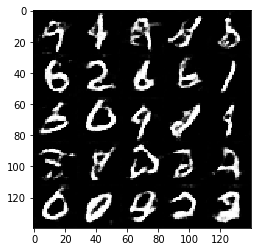

Epoch 2/2... Discriminator Loss: 0.6171... Generator Loss: 1.0593
Epoch 2/2... Discriminator Loss: 0.9700... Generator Loss: 0.7086
Epoch 2/2... Discriminator Loss: 0.4689... Generator Loss: 1.3535
Epoch 2/2... Discriminator Loss: 0.9938... Generator Loss: 0.6151
Epoch 2/2... Discriminator Loss: 0.6814... Generator Loss: 1.5180
Epoch 2/2... Discriminator Loss: 0.7402... Generator Loss: 0.9561
Epoch 2/2... Discriminator Loss: 0.6771... Generator Loss: 0.9851
Epoch 2/2... Discriminator Loss: 0.4448... Generator Loss: 1.6234
Epoch 2/2... Discriminator Loss: 0.4503... Generator Loss: 1.6519
Epoch 2/2... Discriminator Loss: 2.4953... Generator Loss: 4.9444


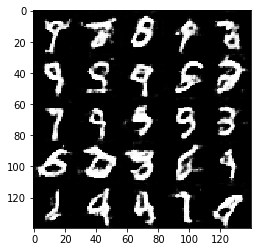

Epoch 2/2... Discriminator Loss: 0.9442... Generator Loss: 0.7379
Epoch 2/2... Discriminator Loss: 0.6191... Generator Loss: 1.1175
Epoch 2/2... Discriminator Loss: 0.6566... Generator Loss: 1.1247
Epoch 2/2... Discriminator Loss: 0.4665... Generator Loss: 1.4775
Epoch 2/2... Discriminator Loss: 0.9461... Generator Loss: 0.7516
Epoch 2/2... Discriminator Loss: 0.7218... Generator Loss: 1.1402
Epoch 2/2... Discriminator Loss: 0.6018... Generator Loss: 1.0629
Epoch 2/2... Discriminator Loss: 0.8744... Generator Loss: 0.7249
Epoch 2/2... Discriminator Loss: 0.5433... Generator Loss: 1.3236
Epoch 2/2... Discriminator Loss: 0.6259... Generator Loss: 1.7145


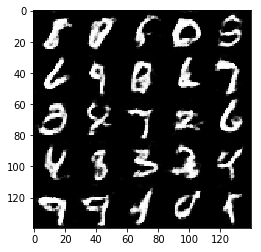

Epoch 2/2... Discriminator Loss: 0.8903... Generator Loss: 0.7392
Epoch 2/2... Discriminator Loss: 0.7091... Generator Loss: 0.9756
Epoch 2/2... Discriminator Loss: 0.4082... Generator Loss: 1.5529
Epoch 2/2... Discriminator Loss: 0.4799... Generator Loss: 1.3074
Epoch 2/2... Discriminator Loss: 0.7088... Generator Loss: 0.9287
Epoch 2/2... Discriminator Loss: 0.5049... Generator Loss: 1.5952
Epoch 2/2... Discriminator Loss: 0.9949... Generator Loss: 0.7069
Epoch 2/2... Discriminator Loss: 0.8184... Generator Loss: 0.8606
Epoch 2/2... Discriminator Loss: 0.9755... Generator Loss: 0.6579
Epoch 2/2... Discriminator Loss: 0.7256... Generator Loss: 1.0105


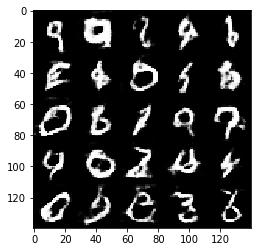

Epoch 2/2... Discriminator Loss: 1.2647... Generator Loss: 0.4690
Epoch 2/2... Discriminator Loss: 0.3996... Generator Loss: 1.9128
Epoch 2/2... Discriminator Loss: 0.6530... Generator Loss: 1.2222
Epoch 2/2... Discriminator Loss: 0.5521... Generator Loss: 1.2687
Epoch 2/2... Discriminator Loss: 0.9188... Generator Loss: 0.7039
Epoch 2/2... Discriminator Loss: 0.7856... Generator Loss: 0.9807
Epoch 2/2... Discriminator Loss: 0.5688... Generator Loss: 1.1588
Epoch 2/2... Discriminator Loss: 0.3697... Generator Loss: 1.5117
Epoch 2/2... Discriminator Loss: 0.5010... Generator Loss: 1.1845
Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 0.5497


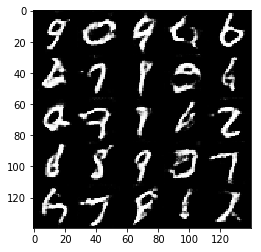

Epoch 2/2... Discriminator Loss: 1.0429... Generator Loss: 0.6066
Epoch 2/2... Discriminator Loss: 1.0125... Generator Loss: 0.6199
Epoch 2/2... Discriminator Loss: 2.7059... Generator Loss: 0.2690
Epoch 2/2... Discriminator Loss: 0.7400... Generator Loss: 1.1443
Epoch 2/2... Discriminator Loss: 0.6675... Generator Loss: 2.8580
Epoch 2/2... Discriminator Loss: 0.5861... Generator Loss: 1.3649
Epoch 2/2... Discriminator Loss: 0.6435... Generator Loss: 1.0403
Epoch 2/2... Discriminator Loss: 0.5716... Generator Loss: 1.3212
Epoch 2/2... Discriminator Loss: 0.3266... Generator Loss: 1.9135
Epoch 2/2... Discriminator Loss: 1.1771... Generator Loss: 0.7070


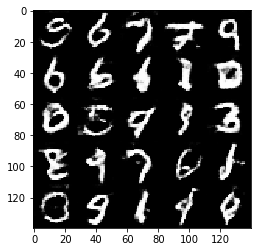

Epoch 2/2... Discriminator Loss: 1.0038... Generator Loss: 0.9620
Epoch 2/2... Discriminator Loss: 1.1399... Generator Loss: 0.5979
Epoch 2/2... Discriminator Loss: 0.9611... Generator Loss: 0.7775
Epoch 2/2... Discriminator Loss: 0.5251... Generator Loss: 1.7314
Epoch 2/2... Discriminator Loss: 0.5563... Generator Loss: 1.2372
Epoch 2/2... Discriminator Loss: 0.6448... Generator Loss: 1.0104
Epoch 2/2... Discriminator Loss: 0.6373... Generator Loss: 0.9899


In [15]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/2... Discriminator Loss: 7.1280... Generator Loss: 27.0212
Epoch 1/2... Discriminator Loss: 0.0567... Generator Loss: 10.2270
Epoch 1/2... Discriminator Loss: 2.2445... Generator Loss: 1.2524
Epoch 1/2... Discriminator Loss: 0.4020... Generator Loss: 2.0855
Epoch 1/2... Discriminator Loss: 1.6726... Generator Loss: 0.5419
Epoch 1/2... Discriminator Loss: 1.9249... Generator Loss: 0.2605
Epoch 1/2... Discriminator Loss: 1.0527... Generator Loss: 0.7640
Epoch 1/2... Discriminator Loss: 1.2279... Generator Loss: 1.7064
Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 0.6323
Epoch 1/2... Discriminator Loss: 1.0321... Generator Loss: 1.4710


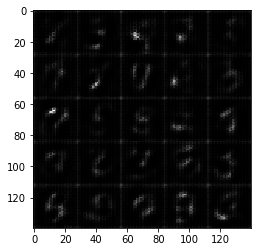

Epoch 1/2... Discriminator Loss: 1.1256... Generator Loss: 0.8715
Epoch 1/2... Discriminator Loss: 1.0372... Generator Loss: 1.0993
Epoch 1/2... Discriminator Loss: 0.9395... Generator Loss: 1.1309
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 1.1520
Epoch 1/2... Discriminator Loss: 1.2314... Generator Loss: 0.7387
Epoch 1/2... Discriminator Loss: 1.1376... Generator Loss: 0.7988
Epoch 1/2... Discriminator Loss: 1.4264... Generator Loss: 2.4070
Epoch 1/2... Discriminator Loss: 0.8786... Generator Loss: 1.1291
Epoch 1/2... Discriminator Loss: 1.2076... Generator Loss: 0.7369
Epoch 1/2... Discriminator Loss: 0.9648... Generator Loss: 1.3406


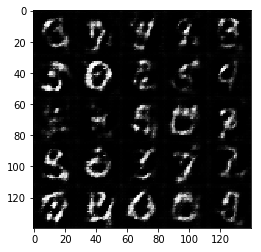

Epoch 1/2... Discriminator Loss: 0.9843... Generator Loss: 1.0821
Epoch 1/2... Discriminator Loss: 1.1861... Generator Loss: 0.6334
Epoch 1/2... Discriminator Loss: 0.9596... Generator Loss: 1.0060
Epoch 1/2... Discriminator Loss: 1.1351... Generator Loss: 0.7116
Epoch 1/2... Discriminator Loss: 1.0017... Generator Loss: 0.8257
Epoch 1/2... Discriminator Loss: 0.8808... Generator Loss: 1.0587
Epoch 1/2... Discriminator Loss: 1.2162... Generator Loss: 1.4251
Epoch 1/2... Discriminator Loss: 1.2360... Generator Loss: 0.7468
Epoch 1/2... Discriminator Loss: 1.1301... Generator Loss: 0.6830
Epoch 1/2... Discriminator Loss: 1.2460... Generator Loss: 0.5597


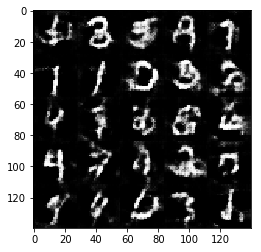

Epoch 1/2... Discriminator Loss: 0.8715... Generator Loss: 1.2972
Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 0.7970
Epoch 1/2... Discriminator Loss: 1.2596... Generator Loss: 1.5692
Epoch 1/2... Discriminator Loss: 1.1795... Generator Loss: 0.5526
Epoch 1/2... Discriminator Loss: 1.2792... Generator Loss: 1.7827
Epoch 1/2... Discriminator Loss: 0.8855... Generator Loss: 1.0455
Epoch 1/2... Discriminator Loss: 1.5960... Generator Loss: 0.2947
Epoch 1/2... Discriminator Loss: 1.1682... Generator Loss: 0.5084
Epoch 1/2... Discriminator Loss: 1.0378... Generator Loss: 0.9557
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 0.7399


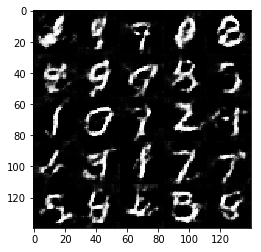

Epoch 1/2... Discriminator Loss: 1.0183... Generator Loss: 0.7859
Epoch 1/2... Discriminator Loss: 0.9358... Generator Loss: 0.9148
Epoch 1/2... Discriminator Loss: 1.0192... Generator Loss: 1.5191
Epoch 1/2... Discriminator Loss: 1.2148... Generator Loss: 0.5460
Epoch 1/2... Discriminator Loss: 0.7386... Generator Loss: 1.1388
Epoch 1/2... Discriminator Loss: 1.2251... Generator Loss: 0.5975
Epoch 1/2... Discriminator Loss: 1.0101... Generator Loss: 0.8560
Epoch 1/2... Discriminator Loss: 0.9926... Generator Loss: 1.6398
Epoch 1/2... Discriminator Loss: 1.0771... Generator Loss: 0.9450
Epoch 1/2... Discriminator Loss: 0.9719... Generator Loss: 1.1380


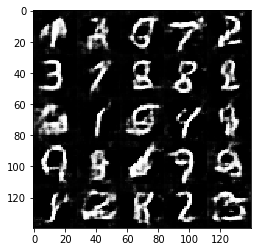

Epoch 1/2... Discriminator Loss: 1.1886... Generator Loss: 1.9767
Epoch 1/2... Discriminator Loss: 1.1496... Generator Loss: 0.6586
Epoch 1/2... Discriminator Loss: 0.9882... Generator Loss: 1.1092
Epoch 1/2... Discriminator Loss: 0.9110... Generator Loss: 1.0257
Epoch 1/2... Discriminator Loss: 0.9616... Generator Loss: 1.2773
Epoch 1/2... Discriminator Loss: 1.0632... Generator Loss: 0.9239
Epoch 1/2... Discriminator Loss: 1.6413... Generator Loss: 0.3162
Epoch 1/2... Discriminator Loss: 1.1292... Generator Loss: 0.5658
Epoch 1/2... Discriminator Loss: 1.4465... Generator Loss: 0.3548
Epoch 1/2... Discriminator Loss: 0.9473... Generator Loss: 1.1828


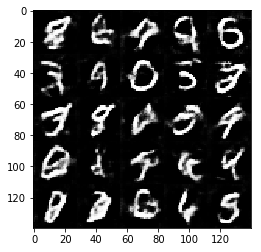

Epoch 1/2... Discriminator Loss: 1.1699... Generator Loss: 0.6018
Epoch 1/2... Discriminator Loss: 0.9869... Generator Loss: 0.9198
Epoch 1/2... Discriminator Loss: 1.3078... Generator Loss: 0.4377
Epoch 1/2... Discriminator Loss: 0.8435... Generator Loss: 0.9729
Epoch 1/2... Discriminator Loss: 1.2748... Generator Loss: 1.9117
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 0.6174
Epoch 1/2... Discriminator Loss: 0.9545... Generator Loss: 0.8548
Epoch 1/2... Discriminator Loss: 1.1288... Generator Loss: 1.0926
Epoch 1/2... Discriminator Loss: 1.1234... Generator Loss: 0.5715
Epoch 1/2... Discriminator Loss: 1.2322... Generator Loss: 0.5108


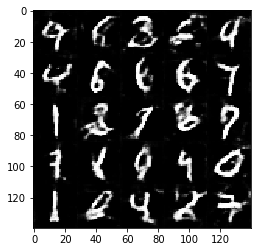

Epoch 1/2... Discriminator Loss: 1.5543... Generator Loss: 0.4079
Epoch 1/2... Discriminator Loss: 1.0004... Generator Loss: 1.0974
Epoch 1/2... Discriminator Loss: 1.0617... Generator Loss: 1.5312
Epoch 1/2... Discriminator Loss: 0.8283... Generator Loss: 1.4961
Epoch 1/2... Discriminator Loss: 1.6385... Generator Loss: 0.2745
Epoch 1/2... Discriminator Loss: 0.8022... Generator Loss: 0.9227
Epoch 1/2... Discriminator Loss: 1.1186... Generator Loss: 0.5661
Epoch 1/2... Discriminator Loss: 1.4587... Generator Loss: 1.2693
Epoch 1/2... Discriminator Loss: 1.2925... Generator Loss: 0.4987
Epoch 1/2... Discriminator Loss: 1.3154... Generator Loss: 0.4509


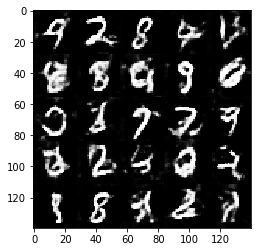

Epoch 1/2... Discriminator Loss: 0.8754... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 1.1011... Generator Loss: 0.7076
Epoch 1/2... Discriminator Loss: 1.1840... Generator Loss: 1.6706
Epoch 1/2... Discriminator Loss: 0.5550... Generator Loss: 1.4560
Epoch 1/2... Discriminator Loss: 0.7462... Generator Loss: 1.1779
Epoch 1/2... Discriminator Loss: 1.7106... Generator Loss: 0.3579
Epoch 1/2... Discriminator Loss: 1.1459... Generator Loss: 0.8978
Epoch 1/2... Discriminator Loss: 0.8971... Generator Loss: 0.9729
Epoch 1/2... Discriminator Loss: 0.8168... Generator Loss: 1.0368
Epoch 1/2... Discriminator Loss: 0.8174... Generator Loss: 1.2301


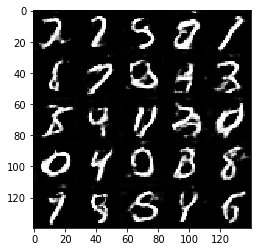

Epoch 1/2... Discriminator Loss: 1.6297... Generator Loss: 0.2944
Epoch 1/2... Discriminator Loss: 1.2722... Generator Loss: 0.5357
Epoch 1/2... Discriminator Loss: 0.9061... Generator Loss: 0.9780
Epoch 2/2... Discriminator Loss: 0.8486... Generator Loss: 0.8804
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 0.5510
Epoch 2/2... Discriminator Loss: 1.0046... Generator Loss: 0.6157
Epoch 2/2... Discriminator Loss: 1.7830... Generator Loss: 0.2823
Epoch 2/2... Discriminator Loss: 1.1083... Generator Loss: 0.6029
Epoch 2/2... Discriminator Loss: 1.3494... Generator Loss: 2.4231
Epoch 2/2... Discriminator Loss: 1.0763... Generator Loss: 0.7259


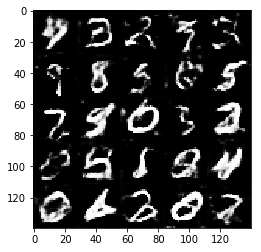

Epoch 2/2... Discriminator Loss: 0.7657... Generator Loss: 1.5840
Epoch 2/2... Discriminator Loss: 0.8726... Generator Loss: 1.0122
Epoch 2/2... Discriminator Loss: 0.8251... Generator Loss: 0.8462
Epoch 2/2... Discriminator Loss: 0.9591... Generator Loss: 0.6568
Epoch 2/2... Discriminator Loss: 0.8203... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 1.2162... Generator Loss: 0.5920
Epoch 2/2... Discriminator Loss: 0.9672... Generator Loss: 0.7993
Epoch 2/2... Discriminator Loss: 1.4527... Generator Loss: 0.3804
Epoch 2/2... Discriminator Loss: 1.3878... Generator Loss: 0.4326
Epoch 2/2... Discriminator Loss: 1.5740... Generator Loss: 0.3191


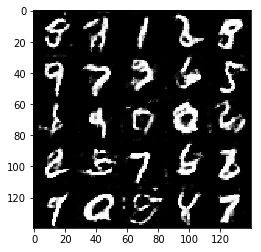

Epoch 2/2... Discriminator Loss: 0.8590... Generator Loss: 1.3454
Epoch 2/2... Discriminator Loss: 0.9767... Generator Loss: 0.9768
Epoch 2/2... Discriminator Loss: 0.8738... Generator Loss: 1.2263
Epoch 2/2... Discriminator Loss: 1.1792... Generator Loss: 0.5548
Epoch 2/2... Discriminator Loss: 0.9601... Generator Loss: 0.8384
Epoch 2/2... Discriminator Loss: 0.8034... Generator Loss: 1.2719
Epoch 2/2... Discriminator Loss: 1.2241... Generator Loss: 0.6113
Epoch 2/2... Discriminator Loss: 0.9394... Generator Loss: 0.6869
Epoch 2/2... Discriminator Loss: 2.1805... Generator Loss: 0.1785
Epoch 2/2... Discriminator Loss: 0.8690... Generator Loss: 0.9402


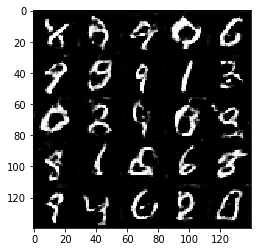

Epoch 2/2... Discriminator Loss: 0.9145... Generator Loss: 0.7994
Epoch 2/2... Discriminator Loss: 0.5971... Generator Loss: 1.1933
Epoch 2/2... Discriminator Loss: 1.0588... Generator Loss: 2.0050
Epoch 2/2... Discriminator Loss: 0.7887... Generator Loss: 1.0690
Epoch 2/2... Discriminator Loss: 1.0859... Generator Loss: 2.7670
Epoch 2/2... Discriminator Loss: 0.7476... Generator Loss: 0.9407
Epoch 2/2... Discriminator Loss: 1.0413... Generator Loss: 0.6243
Epoch 2/2... Discriminator Loss: 2.6081... Generator Loss: 0.1391
Epoch 2/2... Discriminator Loss: 0.8306... Generator Loss: 0.9696
Epoch 2/2... Discriminator Loss: 0.5287... Generator Loss: 1.9125


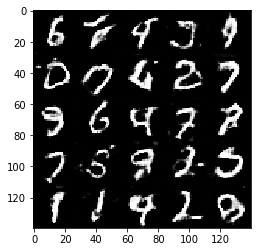

Epoch 2/2... Discriminator Loss: 1.0376... Generator Loss: 0.6173
Epoch 2/2... Discriminator Loss: 0.9318... Generator Loss: 1.0153
Epoch 2/2... Discriminator Loss: 0.4606... Generator Loss: 1.6815
Epoch 2/2... Discriminator Loss: 0.3830... Generator Loss: 1.5316
Epoch 2/2... Discriminator Loss: 1.5503... Generator Loss: 0.4873
Epoch 2/2... Discriminator Loss: 0.8304... Generator Loss: 1.2983
Epoch 2/2... Discriminator Loss: 0.8544... Generator Loss: 2.1212
Epoch 2/2... Discriminator Loss: 0.7149... Generator Loss: 1.8596
Epoch 2/2... Discriminator Loss: 0.6974... Generator Loss: 1.2344
Epoch 2/2... Discriminator Loss: 0.7556... Generator Loss: 0.9735


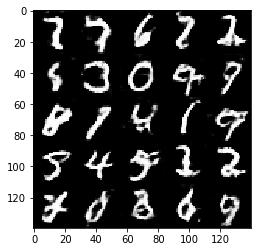

Epoch 2/2... Discriminator Loss: 0.6492... Generator Loss: 1.4113
Epoch 2/2... Discriminator Loss: 0.4169... Generator Loss: 1.8307
Epoch 2/2... Discriminator Loss: 0.9737... Generator Loss: 0.7504
Epoch 2/2... Discriminator Loss: 0.7774... Generator Loss: 0.8918
Epoch 2/2... Discriminator Loss: 1.5569... Generator Loss: 0.3760
Epoch 2/2... Discriminator Loss: 2.0938... Generator Loss: 0.2156
Epoch 2/2... Discriminator Loss: 1.5703... Generator Loss: 0.3371
Epoch 2/2... Discriminator Loss: 0.9484... Generator Loss: 1.5875
Epoch 2/2... Discriminator Loss: 0.8235... Generator Loss: 0.9896
Epoch 2/2... Discriminator Loss: 0.7448... Generator Loss: 1.2287


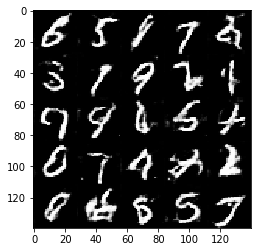

Epoch 2/2... Discriminator Loss: 0.8320... Generator Loss: 0.9242
Epoch 2/2... Discriminator Loss: 0.9696... Generator Loss: 0.7462
Epoch 2/2... Discriminator Loss: 0.4936... Generator Loss: 1.3405
Epoch 2/2... Discriminator Loss: 0.6532... Generator Loss: 1.1053
Epoch 2/2... Discriminator Loss: 0.6560... Generator Loss: 1.0991
Epoch 2/2... Discriminator Loss: 0.4388... Generator Loss: 2.1279
Epoch 2/2... Discriminator Loss: 0.8169... Generator Loss: 1.0605
Epoch 2/2... Discriminator Loss: 0.6556... Generator Loss: 1.6654
Epoch 2/2... Discriminator Loss: 0.8418... Generator Loss: 0.9552
Epoch 2/2... Discriminator Loss: 0.9539... Generator Loss: 0.8985


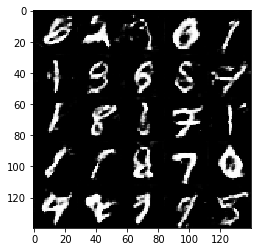

Epoch 2/2... Discriminator Loss: 1.2201... Generator Loss: 0.5343
Epoch 2/2... Discriminator Loss: 0.5015... Generator Loss: 1.4894
Epoch 2/2... Discriminator Loss: 0.7944... Generator Loss: 0.8550
Epoch 2/2... Discriminator Loss: 0.5397... Generator Loss: 1.3255
Epoch 2/2... Discriminator Loss: 0.5732... Generator Loss: 1.2173
Epoch 2/2... Discriminator Loss: 0.6626... Generator Loss: 1.9949
Epoch 2/2... Discriminator Loss: 1.1468... Generator Loss: 0.5482
Epoch 2/2... Discriminator Loss: 0.8965... Generator Loss: 0.7839
Epoch 2/2... Discriminator Loss: 0.4620... Generator Loss: 1.6739
Epoch 2/2... Discriminator Loss: 0.9801... Generator Loss: 0.6675


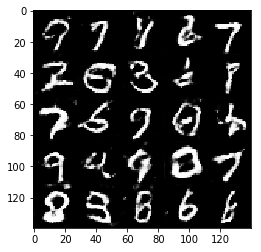

Epoch 2/2... Discriminator Loss: 1.5330... Generator Loss: 0.3928
Epoch 2/2... Discriminator Loss: 0.6958... Generator Loss: 0.9403
Epoch 2/2... Discriminator Loss: 0.6741... Generator Loss: 1.2564
Epoch 2/2... Discriminator Loss: 1.0455... Generator Loss: 3.5856
Epoch 2/2... Discriminator Loss: 0.5822... Generator Loss: 3.1025
Epoch 2/2... Discriminator Loss: 0.3878... Generator Loss: 1.9092
Epoch 2/2... Discriminator Loss: 0.9710... Generator Loss: 0.7895
Epoch 2/2... Discriminator Loss: 0.9642... Generator Loss: 0.7669
Epoch 2/2... Discriminator Loss: 0.5239... Generator Loss: 1.2575
Epoch 2/2... Discriminator Loss: 1.5019... Generator Loss: 0.6094


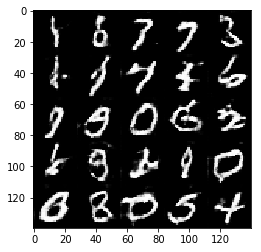

Epoch 2/2... Discriminator Loss: 1.0954... Generator Loss: 0.8768
Epoch 2/2... Discriminator Loss: 1.4638... Generator Loss: 0.3946
Epoch 2/2... Discriminator Loss: 0.8568... Generator Loss: 1.0229
Epoch 2/2... Discriminator Loss: 1.6361... Generator Loss: 0.4286
Epoch 2/2... Discriminator Loss: 0.6540... Generator Loss: 1.2624
Epoch 2/2... Discriminator Loss: 1.0469... Generator Loss: 0.7007
Epoch 2/2... Discriminator Loss: 0.6837... Generator Loss: 1.0252


In [16]:
batch_size = 64
z_dim = 100
learning_rate = 0.0008
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/2... Discriminator Loss: 0.2128... Generator Loss: 2.0438
Epoch 1/2... Discriminator Loss: 0.4701... Generator Loss: 23.9825
Epoch 1/2... Discriminator Loss: 0.0537... Generator Loss: 8.4217
Epoch 1/2... Discriminator Loss: 3.2630... Generator Loss: 7.7714
Epoch 1/2... Discriminator Loss: 1.8921... Generator Loss: 0.4343
Epoch 1/2... Discriminator Loss: 0.9319... Generator Loss: 1.6969
Epoch 1/2... Discriminator Loss: 1.4412... Generator Loss: 1.0381
Epoch 1/2... Discriminator Loss: 1.5157... Generator Loss: 0.4268
Epoch 1/2... Discriminator Loss: 2.0404... Generator Loss: 2.5451
Epoch 1/2... Discriminator Loss: 1.2700... Generator Loss: 1.0077


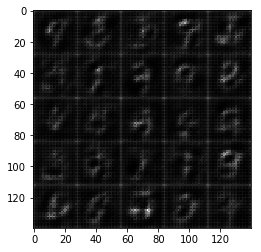

Epoch 1/2... Discriminator Loss: 1.3531... Generator Loss: 1.1706
Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.8794
Epoch 1/2... Discriminator Loss: 1.2186... Generator Loss: 1.0545
Epoch 1/2... Discriminator Loss: 1.2397... Generator Loss: 0.6495
Epoch 1/2... Discriminator Loss: 1.4327... Generator Loss: 0.4290
Epoch 1/2... Discriminator Loss: 1.1988... Generator Loss: 0.6635
Epoch 1/2... Discriminator Loss: 1.1505... Generator Loss: 0.5705
Epoch 1/2... Discriminator Loss: 1.4074... Generator Loss: 1.7111
Epoch 1/2... Discriminator Loss: 1.1392... Generator Loss: 0.6592
Epoch 1/2... Discriminator Loss: 0.9775... Generator Loss: 1.1341


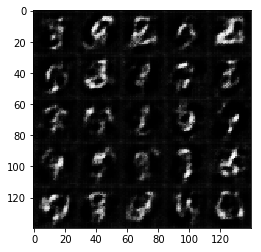

Epoch 1/2... Discriminator Loss: 0.9256... Generator Loss: 1.5187
Epoch 1/2... Discriminator Loss: 1.2799... Generator Loss: 0.5086
Epoch 1/2... Discriminator Loss: 1.4080... Generator Loss: 0.3729
Epoch 1/2... Discriminator Loss: 1.2357... Generator Loss: 0.4490
Epoch 1/2... Discriminator Loss: 1.1491... Generator Loss: 0.5464
Epoch 1/2... Discriminator Loss: 0.8693... Generator Loss: 1.3522
Epoch 1/2... Discriminator Loss: 0.9248... Generator Loss: 0.8086
Epoch 1/2... Discriminator Loss: 1.4266... Generator Loss: 0.4144
Epoch 1/2... Discriminator Loss: 1.4635... Generator Loss: 0.3423
Epoch 1/2... Discriminator Loss: 0.9044... Generator Loss: 1.0327


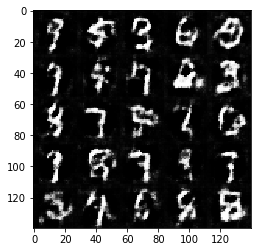

Epoch 1/2... Discriminator Loss: 1.5187... Generator Loss: 0.3223
Epoch 1/2... Discriminator Loss: 1.3161... Generator Loss: 1.3064
Epoch 1/2... Discriminator Loss: 1.0413... Generator Loss: 1.3418
Epoch 1/2... Discriminator Loss: 0.9928... Generator Loss: 0.9952
Epoch 1/2... Discriminator Loss: 1.0858... Generator Loss: 1.5523
Epoch 1/2... Discriminator Loss: 1.1932... Generator Loss: 0.5112
Epoch 1/2... Discriminator Loss: 1.1640... Generator Loss: 0.7625
Epoch 1/2... Discriminator Loss: 1.0169... Generator Loss: 0.9083
Epoch 1/2... Discriminator Loss: 1.0811... Generator Loss: 0.7030
Epoch 1/2... Discriminator Loss: 1.7694... Generator Loss: 0.2465


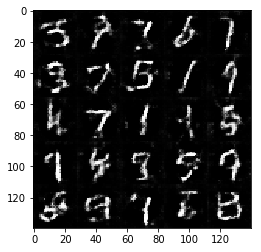

Epoch 1/2... Discriminator Loss: 1.0835... Generator Loss: 0.7988
Epoch 1/2... Discriminator Loss: 0.9907... Generator Loss: 0.8095
Epoch 1/2... Discriminator Loss: 1.2493... Generator Loss: 1.8126
Epoch 1/2... Discriminator Loss: 1.0640... Generator Loss: 1.0840
Epoch 1/2... Discriminator Loss: 0.9482... Generator Loss: 1.0155
Epoch 1/2... Discriminator Loss: 1.7984... Generator Loss: 0.2575
Epoch 1/2... Discriminator Loss: 1.1974... Generator Loss: 0.4989
Epoch 1/2... Discriminator Loss: 0.9311... Generator Loss: 1.0500
Epoch 1/2... Discriminator Loss: 1.0614... Generator Loss: 1.3574
Epoch 1/2... Discriminator Loss: 1.3763... Generator Loss: 2.4783


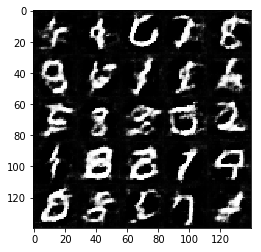

Epoch 1/2... Discriminator Loss: 1.0572... Generator Loss: 0.8001
Epoch 1/2... Discriminator Loss: 1.3461... Generator Loss: 0.4694
Epoch 1/2... Discriminator Loss: 1.0639... Generator Loss: 1.2750
Epoch 1/2... Discriminator Loss: 0.9437... Generator Loss: 0.9213
Epoch 1/2... Discriminator Loss: 1.1804... Generator Loss: 2.1727
Epoch 1/2... Discriminator Loss: 1.0008... Generator Loss: 0.9431
Epoch 1/2... Discriminator Loss: 1.5424... Generator Loss: 0.3317
Epoch 1/2... Discriminator Loss: 0.9623... Generator Loss: 1.0738
Epoch 1/2... Discriminator Loss: 0.9209... Generator Loss: 1.0998
Epoch 1/2... Discriminator Loss: 0.9639... Generator Loss: 1.1026


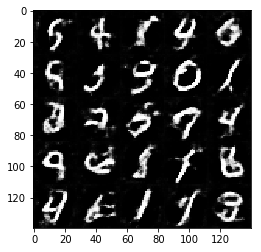

Epoch 1/2... Discriminator Loss: 1.0524... Generator Loss: 0.7551
Epoch 1/2... Discriminator Loss: 0.7946... Generator Loss: 1.2342
Epoch 1/2... Discriminator Loss: 1.0091... Generator Loss: 1.4167
Epoch 1/2... Discriminator Loss: 1.1058... Generator Loss: 0.6928
Epoch 1/2... Discriminator Loss: 1.1223... Generator Loss: 0.8392
Epoch 1/2... Discriminator Loss: 1.4883... Generator Loss: 0.3315
Epoch 1/2... Discriminator Loss: 1.0579... Generator Loss: 0.6677
Epoch 1/2... Discriminator Loss: 2.0286... Generator Loss: 0.1943
Epoch 1/2... Discriminator Loss: 0.8520... Generator Loss: 1.0517
Epoch 1/2... Discriminator Loss: 2.4415... Generator Loss: 2.7241


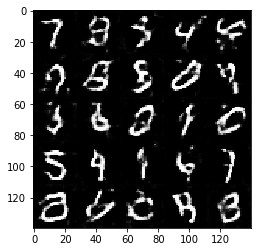

Epoch 1/2... Discriminator Loss: 0.8616... Generator Loss: 1.3291
Epoch 1/2... Discriminator Loss: 0.9674... Generator Loss: 1.0630
Epoch 1/2... Discriminator Loss: 0.9122... Generator Loss: 0.8049
Epoch 1/2... Discriminator Loss: 0.8569... Generator Loss: 1.8000
Epoch 1/2... Discriminator Loss: 0.9562... Generator Loss: 1.1857
Epoch 1/2... Discriminator Loss: 1.0036... Generator Loss: 0.7459
Epoch 1/2... Discriminator Loss: 1.4012... Generator Loss: 0.3781
Epoch 1/2... Discriminator Loss: 1.0316... Generator Loss: 0.8770
Epoch 1/2... Discriminator Loss: 0.8677... Generator Loss: 1.1744
Epoch 1/2... Discriminator Loss: 1.3651... Generator Loss: 0.4096


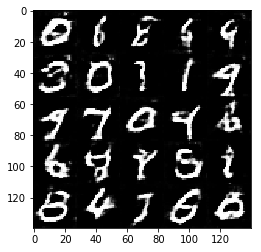

Epoch 1/2... Discriminator Loss: 1.0180... Generator Loss: 0.6095
Epoch 1/2... Discriminator Loss: 1.1154... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 0.9637... Generator Loss: 0.7635
Epoch 1/2... Discriminator Loss: 1.5192... Generator Loss: 0.3803
Epoch 1/2... Discriminator Loss: 1.0954... Generator Loss: 0.5122
Epoch 1/2... Discriminator Loss: 1.6008... Generator Loss: 0.3244
Epoch 1/2... Discriminator Loss: 0.9322... Generator Loss: 1.1813
Epoch 1/2... Discriminator Loss: 0.8124... Generator Loss: 0.9319
Epoch 1/2... Discriminator Loss: 1.5160... Generator Loss: 2.2486
Epoch 1/2... Discriminator Loss: 0.8332... Generator Loss: 1.0693


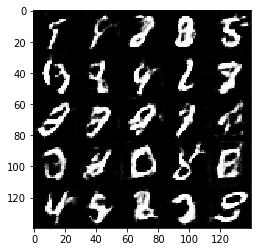

Epoch 1/2... Discriminator Loss: 1.0372... Generator Loss: 0.6061
Epoch 1/2... Discriminator Loss: 1.7425... Generator Loss: 0.2750
Epoch 1/2... Discriminator Loss: 0.9142... Generator Loss: 0.8440
Epoch 2/2... Discriminator Loss: 1.2700... Generator Loss: 0.4828
Epoch 2/2... Discriminator Loss: 1.1060... Generator Loss: 0.6601
Epoch 2/2... Discriminator Loss: 1.3190... Generator Loss: 0.4247
Epoch 2/2... Discriminator Loss: 0.7724... Generator Loss: 1.6071
Epoch 2/2... Discriminator Loss: 1.2623... Generator Loss: 0.5269
Epoch 2/2... Discriminator Loss: 0.8909... Generator Loss: 1.2337
Epoch 2/2... Discriminator Loss: 0.9819... Generator Loss: 1.3711


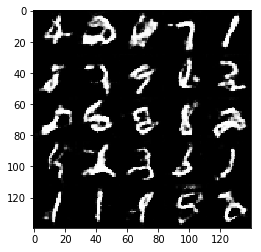

Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 0.7977
Epoch 2/2... Discriminator Loss: 0.6411... Generator Loss: 1.2006
Epoch 2/2... Discriminator Loss: 0.9450... Generator Loss: 0.6586
Epoch 2/2... Discriminator Loss: 0.6790... Generator Loss: 0.9048
Epoch 2/2... Discriminator Loss: 2.1890... Generator Loss: 0.2720
Epoch 2/2... Discriminator Loss: 0.8590... Generator Loss: 0.8013
Epoch 2/2... Discriminator Loss: 0.8157... Generator Loss: 0.7736
Epoch 2/2... Discriminator Loss: 0.7835... Generator Loss: 0.8436
Epoch 2/2... Discriminator Loss: 1.1837... Generator Loss: 0.5076
Epoch 2/2... Discriminator Loss: 0.9322... Generator Loss: 0.6931


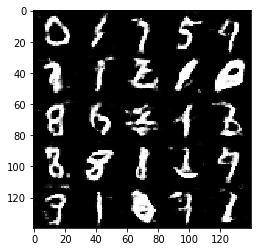

Epoch 2/2... Discriminator Loss: 2.4123... Generator Loss: 0.2986
Epoch 2/2... Discriminator Loss: 0.7007... Generator Loss: 1.2186
Epoch 2/2... Discriminator Loss: 0.5797... Generator Loss: 1.2533
Epoch 2/2... Discriminator Loss: 0.6064... Generator Loss: 1.0438
Epoch 2/2... Discriminator Loss: 0.9287... Generator Loss: 0.7071
Epoch 2/2... Discriminator Loss: 0.7791... Generator Loss: 0.8934
Epoch 2/2... Discriminator Loss: 2.1511... Generator Loss: 0.2842
Epoch 2/2... Discriminator Loss: 1.4392... Generator Loss: 0.3655
Epoch 2/2... Discriminator Loss: 1.7377... Generator Loss: 0.2709
Epoch 2/2... Discriminator Loss: 0.6917... Generator Loss: 1.0654


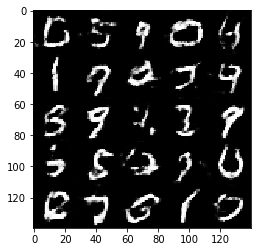

Epoch 2/2... Discriminator Loss: 0.6717... Generator Loss: 1.0746
Epoch 2/2... Discriminator Loss: 0.5728... Generator Loss: 1.1499
Epoch 2/2... Discriminator Loss: 1.7401... Generator Loss: 0.3050
Epoch 2/2... Discriminator Loss: 0.7301... Generator Loss: 0.9364
Epoch 2/2... Discriminator Loss: 0.6799... Generator Loss: 1.4953
Epoch 2/2... Discriminator Loss: 0.7861... Generator Loss: 0.9385
Epoch 2/2... Discriminator Loss: 0.8713... Generator Loss: 0.7129
Epoch 2/2... Discriminator Loss: 1.8554... Generator Loss: 0.2766
Epoch 2/2... Discriminator Loss: 0.7092... Generator Loss: 1.2076
Epoch 2/2... Discriminator Loss: 0.5021... Generator Loss: 1.3960


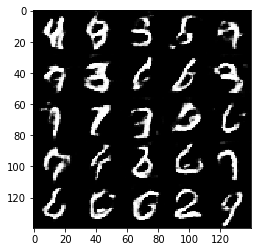

Epoch 2/2... Discriminator Loss: 0.4466... Generator Loss: 1.2965
Epoch 2/2... Discriminator Loss: 2.5378... Generator Loss: 3.2804
Epoch 2/2... Discriminator Loss: 0.9620... Generator Loss: 0.7285
Epoch 2/2... Discriminator Loss: 0.6054... Generator Loss: 1.1157
Epoch 2/2... Discriminator Loss: 2.8035... Generator Loss: 0.1074
Epoch 2/2... Discriminator Loss: 0.8907... Generator Loss: 0.7686
Epoch 2/2... Discriminator Loss: 0.7272... Generator Loss: 0.9244
Epoch 2/2... Discriminator Loss: 0.6623... Generator Loss: 1.0365
Epoch 2/2... Discriminator Loss: 0.7505... Generator Loss: 0.8921
Epoch 2/2... Discriminator Loss: 1.3194... Generator Loss: 2.4777


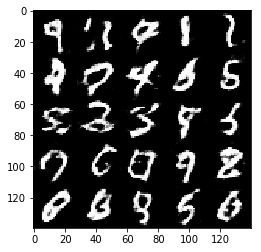

Epoch 2/2... Discriminator Loss: 1.8173... Generator Loss: 0.2924
Epoch 2/2... Discriminator Loss: 0.8667... Generator Loss: 0.9022
Epoch 2/2... Discriminator Loss: 0.6996... Generator Loss: 0.9614
Epoch 2/2... Discriminator Loss: 0.4688... Generator Loss: 1.3129
Epoch 2/2... Discriminator Loss: 2.3065... Generator Loss: 0.1875
Epoch 2/2... Discriminator Loss: 1.3999... Generator Loss: 0.4036
Epoch 2/2... Discriminator Loss: 0.7431... Generator Loss: 0.9077
Epoch 2/2... Discriminator Loss: 0.5980... Generator Loss: 1.0818
Epoch 2/2... Discriminator Loss: 0.5632... Generator Loss: 1.0842
Epoch 2/2... Discriminator Loss: 0.6604... Generator Loss: 1.0271


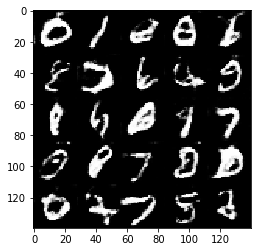

Epoch 2/2... Discriminator Loss: 0.7299... Generator Loss: 1.0803
Epoch 2/2... Discriminator Loss: 0.5468... Generator Loss: 1.2661
Epoch 2/2... Discriminator Loss: 0.4557... Generator Loss: 1.4193
Epoch 2/2... Discriminator Loss: 0.3369... Generator Loss: 1.7720
Epoch 2/2... Discriminator Loss: 1.0220... Generator Loss: 0.7190
Epoch 2/2... Discriminator Loss: 0.9873... Generator Loss: 0.6862
Epoch 2/2... Discriminator Loss: 1.7954... Generator Loss: 0.2722
Epoch 2/2... Discriminator Loss: 0.5991... Generator Loss: 1.3238
Epoch 2/2... Discriminator Loss: 1.0819... Generator Loss: 0.5769
Epoch 2/2... Discriminator Loss: 0.8402... Generator Loss: 2.9375


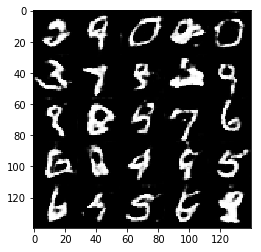

Epoch 2/2... Discriminator Loss: 0.9774... Generator Loss: 0.7690
Epoch 2/2... Discriminator Loss: 0.5208... Generator Loss: 1.4539
Epoch 2/2... Discriminator Loss: 0.8021... Generator Loss: 0.8678
Epoch 2/2... Discriminator Loss: 0.5450... Generator Loss: 1.2631
Epoch 2/2... Discriminator Loss: 0.3322... Generator Loss: 1.7477
Epoch 2/2... Discriminator Loss: 2.0398... Generator Loss: 0.3005
Epoch 2/2... Discriminator Loss: 0.4133... Generator Loss: 1.4943
Epoch 2/2... Discriminator Loss: 1.2605... Generator Loss: 4.2267
Epoch 2/2... Discriminator Loss: 0.7826... Generator Loss: 0.8691
Epoch 2/2... Discriminator Loss: 0.8536... Generator Loss: 0.9637


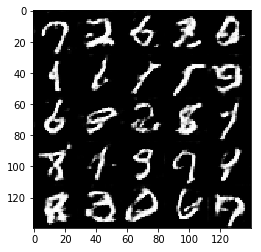

Epoch 2/2... Discriminator Loss: 2.0875... Generator Loss: 0.2463
Epoch 2/2... Discriminator Loss: 1.0221... Generator Loss: 0.6506
Epoch 2/2... Discriminator Loss: 2.1209... Generator Loss: 0.2282
Epoch 2/2... Discriminator Loss: 0.6402... Generator Loss: 1.0637
Epoch 2/2... Discriminator Loss: 0.4216... Generator Loss: 1.4952
Epoch 2/2... Discriminator Loss: 0.3773... Generator Loss: 1.5887
Epoch 2/2... Discriminator Loss: 0.2891... Generator Loss: 1.9173
Epoch 2/2... Discriminator Loss: 1.1589... Generator Loss: 0.6231
Epoch 2/2... Discriminator Loss: 0.2470... Generator Loss: 2.0269
Epoch 2/2... Discriminator Loss: 0.7993... Generator Loss: 1.0967


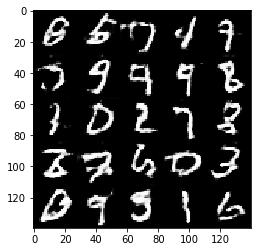

Epoch 2/2... Discriminator Loss: 1.2493... Generator Loss: 0.4939
Epoch 2/2... Discriminator Loss: 1.3023... Generator Loss: 0.4542
Epoch 2/2... Discriminator Loss: 1.2428... Generator Loss: 0.4499
Epoch 2/2... Discriminator Loss: 1.3002... Generator Loss: 0.4569
Epoch 2/2... Discriminator Loss: 0.5509... Generator Loss: 1.2627
Epoch 2/2... Discriminator Loss: 0.6765... Generator Loss: 1.4408
Epoch 2/2... Discriminator Loss: 0.7129... Generator Loss: 1.0359


In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.1378... Generator Loss: 0.7490
Epoch 1/5... Discriminator Loss: 0.5129... Generator Loss: 1.7055
Epoch 1/5... Discriminator Loss: 0.6843... Generator Loss: 1.2235
Epoch 1/5... Discriminator Loss: 0.4496... Generator Loss: 1.7703
Epoch 1/5... Discriminator Loss: 2.8927... Generator Loss: 0.0759
Epoch 1/5... Discriminator Loss: 1.1080... Generator Loss: 1.8415
Epoch 1/5... Discriminator Loss: 1.2770... Generator Loss: 0.5697
Epoch 1/5... Discriminator Loss: 1.2214... Generator Loss: 0.8090
Epoch 1/5... Discriminator Loss: 0.9636... Generator Loss: 0.9864
Epoch 1/5... Discriminator Loss: 1.2297... Generator Loss: 0.6180


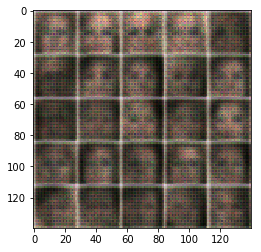

Epoch 1/5... Discriminator Loss: 1.3383... Generator Loss: 0.8586
Epoch 1/5... Discriminator Loss: 0.7346... Generator Loss: 1.5222
Epoch 1/5... Discriminator Loss: 1.0037... Generator Loss: 1.0877
Epoch 1/5... Discriminator Loss: 0.7811... Generator Loss: 1.2175
Epoch 1/5... Discriminator Loss: 0.9517... Generator Loss: 0.8495
Epoch 1/5... Discriminator Loss: 0.9871... Generator Loss: 1.0363
Epoch 1/5... Discriminator Loss: 1.5721... Generator Loss: 1.8047
Epoch 1/5... Discriminator Loss: 2.0621... Generator Loss: 0.2110
Epoch 1/5... Discriminator Loss: 1.0999... Generator Loss: 0.6372
Epoch 1/5... Discriminator Loss: 0.8734... Generator Loss: 1.2523


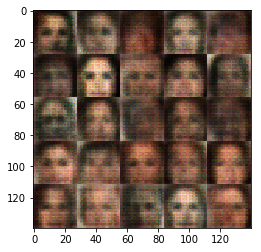

Epoch 1/5... Discriminator Loss: 0.7597... Generator Loss: 2.4295
Epoch 1/5... Discriminator Loss: 0.6344... Generator Loss: 2.3203
Epoch 1/5... Discriminator Loss: 1.0802... Generator Loss: 2.1652
Epoch 1/5... Discriminator Loss: 1.8329... Generator Loss: 0.2544
Epoch 1/5... Discriminator Loss: 0.7486... Generator Loss: 2.2393
Epoch 1/5... Discriminator Loss: 1.2318... Generator Loss: 0.6233
Epoch 1/5... Discriminator Loss: 0.9964... Generator Loss: 0.7036
Epoch 1/5... Discriminator Loss: 0.3365... Generator Loss: 2.5588
Epoch 1/5... Discriminator Loss: 1.1552... Generator Loss: 0.5943
Epoch 1/5... Discriminator Loss: 1.6551... Generator Loss: 0.3445


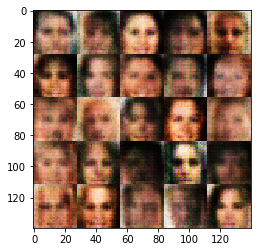

Epoch 1/5... Discriminator Loss: 0.8440... Generator Loss: 1.2957
Epoch 1/5... Discriminator Loss: 0.7390... Generator Loss: 1.4604
Epoch 1/5... Discriminator Loss: 0.9601... Generator Loss: 1.0795
Epoch 1/5... Discriminator Loss: 1.4938... Generator Loss: 0.4946
Epoch 1/5... Discriminator Loss: 0.9012... Generator Loss: 2.1491
Epoch 1/5... Discriminator Loss: 1.8957... Generator Loss: 0.2340
Epoch 1/5... Discriminator Loss: 1.4237... Generator Loss: 0.6018
Epoch 1/5... Discriminator Loss: 1.1499... Generator Loss: 0.7638
Epoch 1/5... Discriminator Loss: 1.8258... Generator Loss: 1.6075
Epoch 1/5... Discriminator Loss: 1.3426... Generator Loss: 0.5548


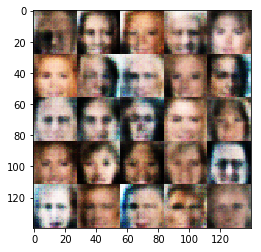

Epoch 1/5... Discriminator Loss: 1.1273... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 0.6622... Generator Loss: 1.4751
Epoch 1/5... Discriminator Loss: 0.5014... Generator Loss: 1.4377
Epoch 1/5... Discriminator Loss: 2.1369... Generator Loss: 0.1788
Epoch 1/5... Discriminator Loss: 0.4048... Generator Loss: 2.3503
Epoch 1/5... Discriminator Loss: 0.7205... Generator Loss: 3.9413
Epoch 1/5... Discriminator Loss: 0.7502... Generator Loss: 1.1619
Epoch 1/5... Discriminator Loss: 1.2885... Generator Loss: 2.0955
Epoch 1/5... Discriminator Loss: 0.6324... Generator Loss: 2.4939
Epoch 1/5... Discriminator Loss: 1.2920... Generator Loss: 2.4726


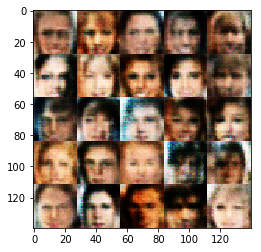

Epoch 1/5... Discriminator Loss: 0.9169... Generator Loss: 0.7181
Epoch 1/5... Discriminator Loss: 0.8789... Generator Loss: 4.9069
Epoch 1/5... Discriminator Loss: 0.3357... Generator Loss: 1.9636
Epoch 1/5... Discriminator Loss: 1.0435... Generator Loss: 2.9192
Epoch 1/5... Discriminator Loss: 0.7486... Generator Loss: 1.4282
Epoch 1/5... Discriminator Loss: 1.1755... Generator Loss: 0.5437
Epoch 1/5... Discriminator Loss: 0.3429... Generator Loss: 5.8256
Epoch 1/5... Discriminator Loss: 0.9152... Generator Loss: 0.6876
Epoch 1/5... Discriminator Loss: 0.2964... Generator Loss: 3.2709
Epoch 1/5... Discriminator Loss: 0.0732... Generator Loss: 6.5078


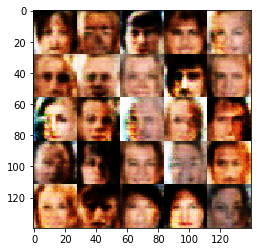

Epoch 1/5... Discriminator Loss: 0.2168... Generator Loss: 2.5010
Epoch 1/5... Discriminator Loss: 0.7031... Generator Loss: 0.8294
Epoch 1/5... Discriminator Loss: 0.2326... Generator Loss: 5.6561
Epoch 1/5... Discriminator Loss: 0.9163... Generator Loss: 0.6969
Epoch 1/5... Discriminator Loss: 0.2981... Generator Loss: 5.6137
Epoch 1/5... Discriminator Loss: 0.0228... Generator Loss: 5.6854
Epoch 1/5... Discriminator Loss: 0.1904... Generator Loss: 7.6458
Epoch 1/5... Discriminator Loss: 0.0520... Generator Loss: 5.6074
Epoch 1/5... Discriminator Loss: 0.0835... Generator Loss: 3.1265
Epoch 1/5... Discriminator Loss: 0.1763... Generator Loss: 2.0567


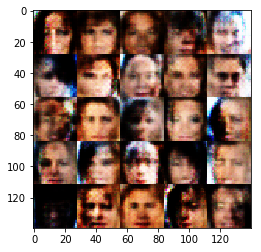

Epoch 1/5... Discriminator Loss: 0.0666... Generator Loss: 6.7441
Epoch 1/5... Discriminator Loss: 0.3167... Generator Loss: 1.6449
Epoch 1/5... Discriminator Loss: 0.4903... Generator Loss: 1.1984
Epoch 1/5... Discriminator Loss: 0.0159... Generator Loss: 5.9475
Epoch 1/5... Discriminator Loss: 0.0616... Generator Loss: 4.5324
Epoch 1/5... Discriminator Loss: 0.1651... Generator Loss: 8.4007
Epoch 1/5... Discriminator Loss: 0.1163... Generator Loss: 7.7413
Epoch 1/5... Discriminator Loss: 0.0343... Generator Loss: 4.8065
Epoch 1/5... Discriminator Loss: 0.1255... Generator Loss: 4.5309
Epoch 1/5... Discriminator Loss: 0.1912... Generator Loss: 2.2546


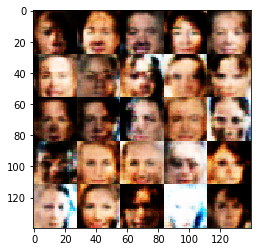

Epoch 1/5... Discriminator Loss: 0.0503... Generator Loss: 4.2139
Epoch 1/5... Discriminator Loss: 0.0759... Generator Loss: 3.7340
Epoch 1/5... Discriminator Loss: 0.1447... Generator Loss: 2.9269
Epoch 1/5... Discriminator Loss: 0.0897... Generator Loss: 6.7231
Epoch 1/5... Discriminator Loss: 0.0473... Generator Loss: 5.1556
Epoch 1/5... Discriminator Loss: 0.1041... Generator Loss: 3.2258
Epoch 1/5... Discriminator Loss: 0.0759... Generator Loss: 4.2604
Epoch 1/5... Discriminator Loss: 0.1056... Generator Loss: 3.2887
Epoch 1/5... Discriminator Loss: 0.9305... Generator Loss: 0.6775
Epoch 1/5... Discriminator Loss: 1.0217... Generator Loss: 0.5747


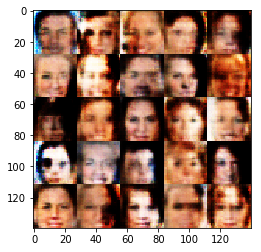

Epoch 1/5... Discriminator Loss: 0.0280... Generator Loss: 8.9872
Epoch 1/5... Discriminator Loss: 0.1520... Generator Loss: 3.0066
Epoch 1/5... Discriminator Loss: 0.0701... Generator Loss: 4.0057
Epoch 1/5... Discriminator Loss: 0.0488... Generator Loss: 7.3234
Epoch 1/5... Discriminator Loss: 0.0604... Generator Loss: 3.6182
Epoch 1/5... Discriminator Loss: 0.0825... Generator Loss: 7.6789
Epoch 1/5... Discriminator Loss: 0.0669... Generator Loss: 3.6216
Epoch 1/5... Discriminator Loss: 0.0195... Generator Loss: 8.1773
Epoch 1/5... Discriminator Loss: 0.0586... Generator Loss: 3.9022
Epoch 1/5... Discriminator Loss: 0.1252... Generator Loss: 9.4511


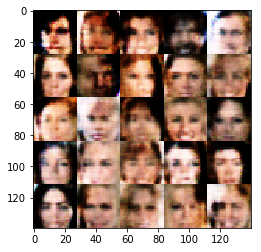

Epoch 1/5... Discriminator Loss: 1.3563... Generator Loss: 0.3850
Epoch 1/5... Discriminator Loss: 0.0590... Generator Loss: 7.7405
Epoch 1/5... Discriminator Loss: 0.0274... Generator Loss: 6.4687
Epoch 1/5... Discriminator Loss: 0.3369... Generator Loss: 1.4551
Epoch 1/5... Discriminator Loss: 0.0330... Generator Loss: 6.2316
Epoch 1/5... Discriminator Loss: 0.0914... Generator Loss: 7.1554
Epoch 1/5... Discriminator Loss: 0.0390... Generator Loss: 5.1501
Epoch 1/5... Discriminator Loss: 0.1021... Generator Loss: 2.8340
Epoch 1/5... Discriminator Loss: 0.1081... Generator Loss: 3.3904
Epoch 1/5... Discriminator Loss: 0.0791... Generator Loss: 3.0746


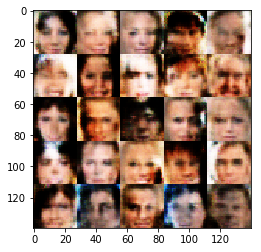

Epoch 1/5... Discriminator Loss: 0.0215... Generator Loss: 6.5270
Epoch 1/5... Discriminator Loss: 0.1042... Generator Loss: 4.8124
Epoch 1/5... Discriminator Loss: 0.1918... Generator Loss: 4.9035
Epoch 1/5... Discriminator Loss: 0.0354... Generator Loss: 6.6590
Epoch 1/5... Discriminator Loss: 0.8675... Generator Loss: 0.6413
Epoch 1/5... Discriminator Loss: 0.2609... Generator Loss: 1.7980
Epoch 1/5... Discriminator Loss: 0.1088... Generator Loss: 8.2488
Epoch 1/5... Discriminator Loss: 0.7734... Generator Loss: 0.7244
Epoch 1/5... Discriminator Loss: 0.6439... Generator Loss: 0.8692
Epoch 1/5... Discriminator Loss: 0.0383... Generator Loss: 5.1046


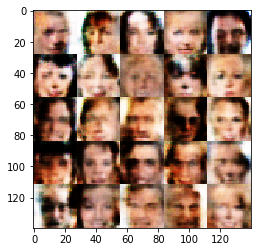

Epoch 1/5... Discriminator Loss: 0.0495... Generator Loss: 4.9285
Epoch 1/5... Discriminator Loss: 0.7162... Generator Loss: 0.8145
Epoch 1/5... Discriminator Loss: 0.0442... Generator Loss: 4.3891
Epoch 1/5... Discriminator Loss: 0.0508... Generator Loss: 7.4895
Epoch 1/5... Discriminator Loss: 0.2998... Generator Loss: 8.9862
Epoch 1/5... Discriminator Loss: 0.0666... Generator Loss: 3.7318
Epoch 1/5... Discriminator Loss: 1.4207... Generator Loss: 0.3696
Epoch 1/5... Discriminator Loss: 0.0248... Generator Loss: 6.0043
Epoch 1/5... Discriminator Loss: 0.1168... Generator Loss: 6.8116
Epoch 1/5... Discriminator Loss: 0.0584... Generator Loss: 7.1349


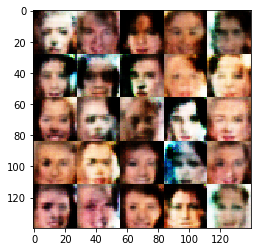

Epoch 1/5... Discriminator Loss: 0.4689... Generator Loss: 1.2894
Epoch 1/5... Discriminator Loss: 0.1571... Generator Loss: 2.8393
Epoch 1/5... Discriminator Loss: 0.0386... Generator Loss: 9.0460
Epoch 1/5... Discriminator Loss: 0.2851... Generator Loss: 1.7091
Epoch 1/5... Discriminator Loss: 0.0777... Generator Loss: 8.2360
Epoch 1/5... Discriminator Loss: 0.1575... Generator Loss: 2.5152
Epoch 1/5... Discriminator Loss: 0.0544... Generator Loss: 8.1776
Epoch 1/5... Discriminator Loss: 0.0451... Generator Loss: 3.7528
Epoch 1/5... Discriminator Loss: 0.0844... Generator Loss: 3.4509
Epoch 1/5... Discriminator Loss: 0.1879... Generator Loss: 4.2189


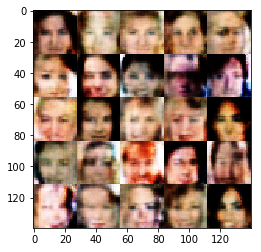

Epoch 1/5... Discriminator Loss: 0.0164... Generator Loss: 6.0692
Epoch 1/5... Discriminator Loss: 0.2887... Generator Loss: 1.7009
Epoch 1/5... Discriminator Loss: 0.7027... Generator Loss: 0.8670
Epoch 1/5... Discriminator Loss: 0.3374... Generator Loss: 1.5589
Epoch 1/5... Discriminator Loss: 0.0361... Generator Loss: 6.8945
Epoch 1/5... Discriminator Loss: 0.1108... Generator Loss: 2.6362
Epoch 1/5... Discriminator Loss: 0.0221... Generator Loss: 5.5907
Epoch 1/5... Discriminator Loss: 0.0412... Generator Loss: 3.8701
Epoch 1/5... Discriminator Loss: 0.6384... Generator Loss: 8.5888
Epoch 1/5... Discriminator Loss: 0.4263... Generator Loss: 1.5020


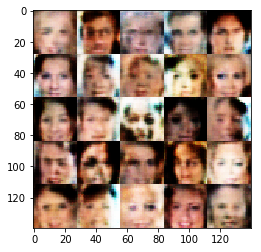

Epoch 1/5... Discriminator Loss: 0.0469... Generator Loss: 7.1461
Epoch 1/5... Discriminator Loss: 0.2871... Generator Loss: 2.4971
Epoch 1/5... Discriminator Loss: 0.9908... Generator Loss: 4.7510
Epoch 1/5... Discriminator Loss: 0.1053... Generator Loss: 3.3809
Epoch 1/5... Discriminator Loss: 0.0412... Generator Loss: 7.1332
Epoch 1/5... Discriminator Loss: 0.1022... Generator Loss: 3.0587
Epoch 1/5... Discriminator Loss: 0.0243... Generator Loss: 8.5455
Epoch 1/5... Discriminator Loss: 0.0353... Generator Loss: 4.7441
Epoch 1/5... Discriminator Loss: 0.2132... Generator Loss: 2.1697
Epoch 1/5... Discriminator Loss: 0.4506... Generator Loss: 1.3137


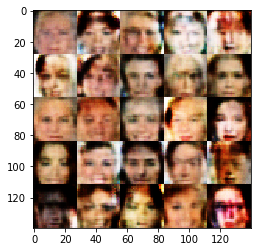

Epoch 1/5... Discriminator Loss: 0.0291... Generator Loss: 9.3701
Epoch 1/5... Discriminator Loss: 0.0523... Generator Loss: 9.9720
Epoch 1/5... Discriminator Loss: 0.0411... Generator Loss: 3.7838
Epoch 1/5... Discriminator Loss: 0.0618... Generator Loss: 3.3853
Epoch 1/5... Discriminator Loss: 0.0901... Generator Loss: 2.9732
Epoch 1/5... Discriminator Loss: 1.0690... Generator Loss: 0.5522
Epoch 1/5... Discriminator Loss: 0.0213... Generator Loss: 4.8437
Epoch 1/5... Discriminator Loss: 0.6924... Generator Loss: 6.4090
Epoch 1/5... Discriminator Loss: 0.1170... Generator Loss: 6.5921
Epoch 1/5... Discriminator Loss: 0.4307... Generator Loss: 5.0420


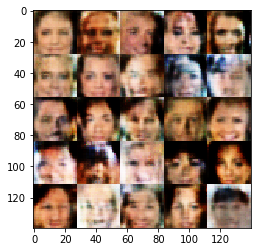

Epoch 1/5... Discriminator Loss: 0.1334... Generator Loss: 3.5424
Epoch 1/5... Discriminator Loss: 0.4414... Generator Loss: 6.4514
Epoch 1/5... Discriminator Loss: 0.1530... Generator Loss: 7.8732
Epoch 1/5... Discriminator Loss: 0.0536... Generator Loss: 4.4679
Epoch 1/5... Discriminator Loss: 1.0305... Generator Loss: 0.5733
Epoch 1/5... Discriminator Loss: 1.0383... Generator Loss: 0.8412
Epoch 1/5... Discriminator Loss: 0.3023... Generator Loss: 1.9529
Epoch 1/5... Discriminator Loss: 0.2326... Generator Loss: 1.9414
Epoch 1/5... Discriminator Loss: 0.3068... Generator Loss: 1.7177
Epoch 1/5... Discriminator Loss: 0.0889... Generator Loss: 3.7608


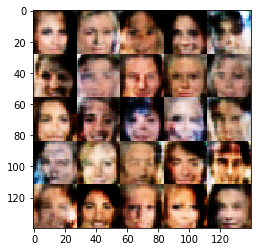

Epoch 1/5... Discriminator Loss: 0.0895... Generator Loss: 7.0584
Epoch 1/5... Discriminator Loss: 0.1227... Generator Loss: 6.0408
Epoch 1/5... Discriminator Loss: 0.0994... Generator Loss: 5.7234
Epoch 1/5... Discriminator Loss: 0.0192... Generator Loss: 5.3089
Epoch 1/5... Discriminator Loss: 0.1156... Generator Loss: 2.5564
Epoch 1/5... Discriminator Loss: 0.0227... Generator Loss: 8.6375
Epoch 1/5... Discriminator Loss: 0.0630... Generator Loss: 3.7931
Epoch 1/5... Discriminator Loss: 0.1123... Generator Loss: 2.6056
Epoch 1/5... Discriminator Loss: 0.1284... Generator Loss: 2.5789
Epoch 1/5... Discriminator Loss: 0.0762... Generator Loss: 6.7862


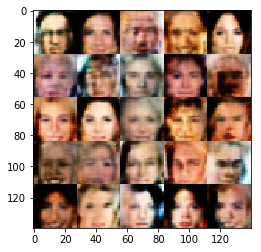

Epoch 1/5... Discriminator Loss: 0.1760... Generator Loss: 3.5028
Epoch 1/5... Discriminator Loss: 0.0427... Generator Loss: 3.8525
Epoch 1/5... Discriminator Loss: 0.2024... Generator Loss: 2.4349
Epoch 1/5... Discriminator Loss: 0.0556... Generator Loss: 5.9124
Epoch 1/5... Discriminator Loss: 0.0205... Generator Loss: 5.6160
Epoch 1/5... Discriminator Loss: 0.2638... Generator Loss: 10.0482
Epoch 1/5... Discriminator Loss: 0.0281... Generator Loss: 6.9830
Epoch 1/5... Discriminator Loss: 0.0390... Generator Loss: 4.0427
Epoch 1/5... Discriminator Loss: 0.0588... Generator Loss: 3.1885
Epoch 1/5... Discriminator Loss: 0.3919... Generator Loss: 1.5263


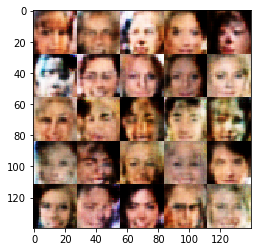

Epoch 1/5... Discriminator Loss: 5.6489... Generator Loss: 7.4352
Epoch 1/5... Discriminator Loss: 0.2390... Generator Loss: 1.9289
Epoch 1/5... Discriminator Loss: 0.0230... Generator Loss: 8.3360
Epoch 1/5... Discriminator Loss: 0.0526... Generator Loss: 4.3622
Epoch 1/5... Discriminator Loss: 0.0353... Generator Loss: 4.6052
Epoch 1/5... Discriminator Loss: 0.0783... Generator Loss: 8.0662
Epoch 1/5... Discriminator Loss: 0.5848... Generator Loss: 1.1317
Epoch 1/5... Discriminator Loss: 0.7116... Generator Loss: 0.8434
Epoch 1/5... Discriminator Loss: 0.0352... Generator Loss: 4.3283
Epoch 1/5... Discriminator Loss: 0.0479... Generator Loss: 6.3096


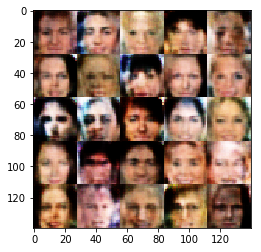

Epoch 1/5... Discriminator Loss: 2.3820... Generator Loss: 0.1222
Epoch 1/5... Discriminator Loss: 0.6320... Generator Loss: 0.9857
Epoch 1/5... Discriminator Loss: 0.3085... Generator Loss: 1.9213
Epoch 1/5... Discriminator Loss: 0.0553... Generator Loss: 5.6941
Epoch 1/5... Discriminator Loss: 0.2644... Generator Loss: 1.9531
Epoch 1/5... Discriminator Loss: 0.0394... Generator Loss: 3.8293
Epoch 1/5... Discriminator Loss: 0.5779... Generator Loss: 1.1845
Epoch 1/5... Discriminator Loss: 1.1713... Generator Loss: 0.5092
Epoch 1/5... Discriminator Loss: 0.0355... Generator Loss: 7.3317
Epoch 1/5... Discriminator Loss: 0.0329... Generator Loss: 4.3981


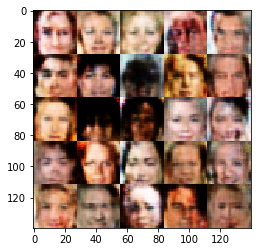

Epoch 1/5... Discriminator Loss: 1.8434... Generator Loss: 0.2842
Epoch 1/5... Discriminator Loss: 0.1870... Generator Loss: 2.1663
Epoch 1/5... Discriminator Loss: 0.0173... Generator Loss: 9.7385
Epoch 1/5... Discriminator Loss: 0.0793... Generator Loss: 4.2351
Epoch 1/5... Discriminator Loss: 0.0634... Generator Loss: 3.4701
Epoch 1/5... Discriminator Loss: 0.0243... Generator Loss: 8.7997
Epoch 1/5... Discriminator Loss: 0.0630... Generator Loss: 7.8039
Epoch 1/5... Discriminator Loss: 0.0195... Generator Loss: 8.7846
Epoch 1/5... Discriminator Loss: 0.3081... Generator Loss: 1.7259
Epoch 1/5... Discriminator Loss: 0.0418... Generator Loss: 5.2338


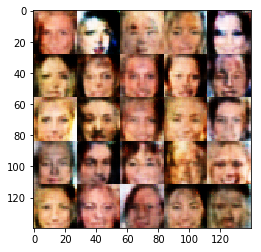

Epoch 1/5... Discriminator Loss: 0.0895... Generator Loss: 8.3711
Epoch 1/5... Discriminator Loss: 0.0232... Generator Loss: 5.7906
Epoch 1/5... Discriminator Loss: 0.0155... Generator Loss: 6.0094
Epoch 1/5... Discriminator Loss: 0.0777... Generator Loss: 10.8946
Epoch 1/5... Discriminator Loss: 2.4449... Generator Loss: 3.8723
Epoch 1/5... Discriminator Loss: 0.1060... Generator Loss: 5.2061
Epoch 1/5... Discriminator Loss: 0.9253... Generator Loss: 10.5518
Epoch 1/5... Discriminator Loss: 1.9968... Generator Loss: 4.0275
Epoch 1/5... Discriminator Loss: 0.1805... Generator Loss: 3.9482
Epoch 1/5... Discriminator Loss: 0.1178... Generator Loss: 2.9052


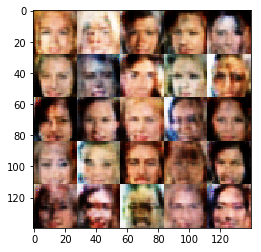

Epoch 1/5... Discriminator Loss: 0.1142... Generator Loss: 5.8292
Epoch 1/5... Discriminator Loss: 0.1145... Generator Loss: 2.8140
Epoch 1/5... Discriminator Loss: 0.1263... Generator Loss: 6.4993
Epoch 1/5... Discriminator Loss: 0.1975... Generator Loss: 2.4930
Epoch 1/5... Discriminator Loss: 0.0377... Generator Loss: 6.5743
Epoch 1/5... Discriminator Loss: 0.2434... Generator Loss: 1.8103
Epoch 1/5... Discriminator Loss: 0.0395... Generator Loss: 4.9937
Epoch 1/5... Discriminator Loss: 0.0431... Generator Loss: 4.1873
Epoch 1/5... Discriminator Loss: 0.2051... Generator Loss: 3.3694
Epoch 1/5... Discriminator Loss: 0.0508... Generator Loss: 3.7082


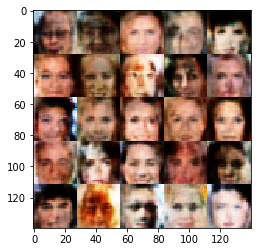

Epoch 1/5... Discriminator Loss: 0.0865... Generator Loss: 2.9818
Epoch 1/5... Discriminator Loss: 0.6281... Generator Loss: 1.0229
Epoch 1/5... Discriminator Loss: 0.0718... Generator Loss: 8.9074
Epoch 1/5... Discriminator Loss: 0.0146... Generator Loss: 7.2740
Epoch 1/5... Discriminator Loss: 0.0112... Generator Loss: 6.2020
Epoch 1/5... Discriminator Loss: 0.0784... Generator Loss: 7.9698
Epoch 1/5... Discriminator Loss: 0.0157... Generator Loss: 9.5122
Epoch 1/5... Discriminator Loss: 0.1536... Generator Loss: 3.1175
Epoch 1/5... Discriminator Loss: 0.1088... Generator Loss: 8.5680
Epoch 1/5... Discriminator Loss: 0.0378... Generator Loss: 5.8854


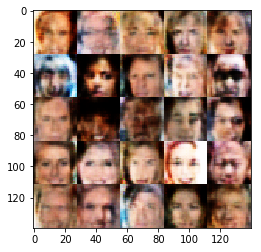

Epoch 1/5... Discriminator Loss: 0.0327... Generator Loss: 4.7004
Epoch 1/5... Discriminator Loss: 0.0460... Generator Loss: 3.9237
Epoch 1/5... Discriminator Loss: 0.6152... Generator Loss: 1.0382
Epoch 1/5... Discriminator Loss: 0.0162... Generator Loss: 6.2377
Epoch 1/5... Discriminator Loss: 0.4862... Generator Loss: 6.9503
Epoch 1/5... Discriminator Loss: 0.0635... Generator Loss: 4.1931
Epoch 1/5... Discriminator Loss: 0.0866... Generator Loss: 3.1628
Epoch 1/5... Discriminator Loss: 0.0813... Generator Loss: 3.0726
Epoch 1/5... Discriminator Loss: 0.0174... Generator Loss: 9.9498
Epoch 1/5... Discriminator Loss: 0.0111... Generator Loss: 5.8560


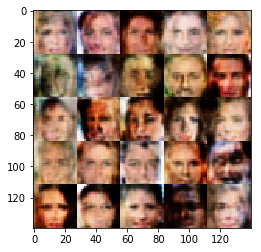

Epoch 1/5... Discriminator Loss: 0.0500... Generator Loss: 6.8883
Epoch 1/5... Discriminator Loss: 0.0230... Generator Loss: 6.3593
Epoch 1/5... Discriminator Loss: 0.0097... Generator Loss: 6.6904
Epoch 1/5... Discriminator Loss: 0.0179... Generator Loss: 4.7115
Epoch 1/5... Discriminator Loss: 0.0735... Generator Loss: 3.3392
Epoch 1/5... Discriminator Loss: 0.0080... Generator Loss: 7.9397
Epoch 1/5... Discriminator Loss: 0.0418... Generator Loss: 5.5216
Epoch 1/5... Discriminator Loss: 0.0189... Generator Loss: 8.9836
Epoch 1/5... Discriminator Loss: 3.7872... Generator Loss: 0.0359
Epoch 1/5... Discriminator Loss: 1.9735... Generator Loss: 0.2756


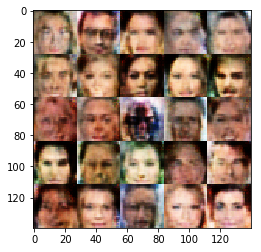

Epoch 1/5... Discriminator Loss: 0.9579... Generator Loss: 0.8342
Epoch 1/5... Discriminator Loss: 2.7722... Generator Loss: 4.5904
Epoch 1/5... Discriminator Loss: 0.7587... Generator Loss: 0.9153
Epoch 1/5... Discriminator Loss: 0.6560... Generator Loss: 1.2068
Epoch 1/5... Discriminator Loss: 0.4804... Generator Loss: 2.3453
Epoch 1/5... Discriminator Loss: 0.2395... Generator Loss: 2.9175
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 4.5918
Epoch 1/5... Discriminator Loss: 0.4174... Generator Loss: 1.6140
Epoch 1/5... Discriminator Loss: 0.9930... Generator Loss: 0.6693
Epoch 1/5... Discriminator Loss: 0.1834... Generator Loss: 3.3354


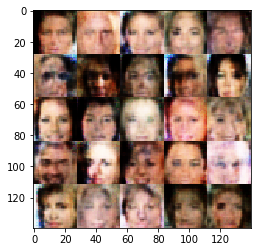

Epoch 1/5... Discriminator Loss: 0.2675... Generator Loss: 4.7952
Epoch 1/5... Discriminator Loss: 0.3662... Generator Loss: 4.8576
Epoch 1/5... Discriminator Loss: 0.1658... Generator Loss: 5.4803
Epoch 1/5... Discriminator Loss: 1.2659... Generator Loss: 1.5313
Epoch 1/5... Discriminator Loss: 0.9901... Generator Loss: 0.7077
Epoch 1/5... Discriminator Loss: 0.3334... Generator Loss: 3.8047
Epoch 1/5... Discriminator Loss: 0.2937... Generator Loss: 1.7494
Epoch 1/5... Discriminator Loss: 0.5735... Generator Loss: 1.0423
Epoch 1/5... Discriminator Loss: 0.0842... Generator Loss: 4.3916
Epoch 1/5... Discriminator Loss: 0.1281... Generator Loss: 2.6908


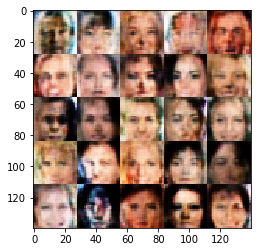

Epoch 1/5... Discriminator Loss: 0.1205... Generator Loss: 4.9233
Epoch 1/5... Discriminator Loss: 0.2367... Generator Loss: 7.0639
Epoch 1/5... Discriminator Loss: 0.0206... Generator Loss: 6.3368
Epoch 1/5... Discriminator Loss: 0.0174... Generator Loss: 5.6059
Epoch 1/5... Discriminator Loss: 0.0152... Generator Loss: 8.5412
Epoch 1/5... Discriminator Loss: 0.6276... Generator Loss: 0.9968
Epoch 1/5... Discriminator Loss: 0.0338... Generator Loss: 6.3120
Epoch 1/5... Discriminator Loss: 0.0841... Generator Loss: 4.5211
Epoch 1/5... Discriminator Loss: 0.0935... Generator Loss: 3.1352
Epoch 1/5... Discriminator Loss: 0.0424... Generator Loss: 4.0879


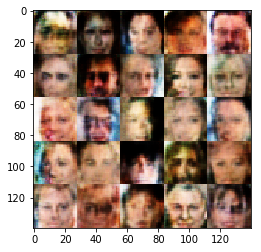

Epoch 1/5... Discriminator Loss: 0.0335... Generator Loss: 7.2419
Epoch 1/5... Discriminator Loss: 0.0694... Generator Loss: 3.3291
Epoch 1/5... Discriminator Loss: 0.0359... Generator Loss: 3.8845
Epoch 1/5... Discriminator Loss: 1.3642... Generator Loss: 0.4269
Epoch 1/5... Discriminator Loss: 0.6069... Generator Loss: 1.0456
Epoch 1/5... Discriminator Loss: 0.7737... Generator Loss: 0.8349
Epoch 2/5... Discriminator Loss: 0.3523... Generator Loss: 3.0627
Epoch 2/5... Discriminator Loss: 0.0736... Generator Loss: 3.3906
Epoch 2/5... Discriminator Loss: 0.1834... Generator Loss: 2.3434
Epoch 2/5... Discriminator Loss: 0.1090... Generator Loss: 5.9342


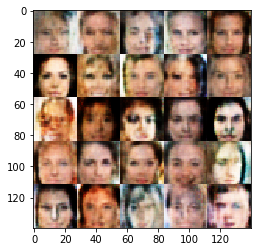

Epoch 2/5... Discriminator Loss: 0.0771... Generator Loss: 3.4837
Epoch 2/5... Discriminator Loss: 0.0435... Generator Loss: 8.1007
Epoch 2/5... Discriminator Loss: 0.0298... Generator Loss: 4.7207
Epoch 2/5... Discriminator Loss: 0.0960... Generator Loss: 4.5874
Epoch 2/5... Discriminator Loss: 0.0647... Generator Loss: 7.3675
Epoch 2/5... Discriminator Loss: 0.3025... Generator Loss: 1.8736
Epoch 2/5... Discriminator Loss: 0.0217... Generator Loss: 8.7864
Epoch 2/5... Discriminator Loss: 1.2602... Generator Loss: 1.3742
Epoch 2/5... Discriminator Loss: 1.2113... Generator Loss: 0.4625
Epoch 2/5... Discriminator Loss: 0.0613... Generator Loss: 4.8915


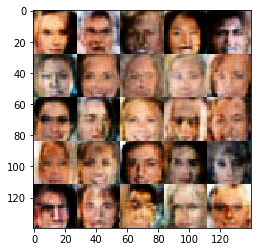

Epoch 2/5... Discriminator Loss: 0.0398... Generator Loss: 4.8987
Epoch 2/5... Discriminator Loss: 0.0421... Generator Loss: 4.4856
Epoch 2/5... Discriminator Loss: 1.1157... Generator Loss: 0.4861
Epoch 2/5... Discriminator Loss: 0.1021... Generator Loss: 5.0635
Epoch 2/5... Discriminator Loss: 0.2928... Generator Loss: 1.9513
Epoch 2/5... Discriminator Loss: 0.0546... Generator Loss: 4.6844
Epoch 2/5... Discriminator Loss: 0.0026... Generator Loss: 7.7822
Epoch 2/5... Discriminator Loss: 0.0600... Generator Loss: 4.2099
Epoch 2/5... Discriminator Loss: 0.0855... Generator Loss: 3.8003
Epoch 2/5... Discriminator Loss: 0.0438... Generator Loss: 6.8030


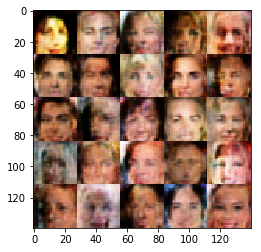

Epoch 2/5... Discriminator Loss: 0.2815... Generator Loss: 1.7576
Epoch 2/5... Discriminator Loss: 0.3949... Generator Loss: 1.3971
Epoch 2/5... Discriminator Loss: 0.1271... Generator Loss: 2.6856
Epoch 2/5... Discriminator Loss: 0.7425... Generator Loss: 0.8756
Epoch 2/5... Discriminator Loss: 0.0179... Generator Loss: 4.8025
Epoch 2/5... Discriminator Loss: 0.0117... Generator Loss: 5.9350
Epoch 2/5... Discriminator Loss: 0.0039... Generator Loss: 8.7036
Epoch 2/5... Discriminator Loss: 0.0352... Generator Loss: 8.9206
Epoch 2/5... Discriminator Loss: 0.0657... Generator Loss: 3.5613
Epoch 2/5... Discriminator Loss: 0.0082... Generator Loss: 9.3264


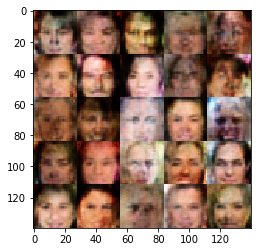

Epoch 2/5... Discriminator Loss: 0.0835... Generator Loss: 3.3317
Epoch 2/5... Discriminator Loss: 0.0682... Generator Loss: 3.6868
Epoch 2/5... Discriminator Loss: 0.1568... Generator Loss: 2.4229
Epoch 2/5... Discriminator Loss: 0.0126... Generator Loss: 7.0850
Epoch 2/5... Discriminator Loss: 1.3641... Generator Loss: 0.4537
Epoch 2/5... Discriminator Loss: 0.3452... Generator Loss: 4.5276
Epoch 2/5... Discriminator Loss: 0.6095... Generator Loss: 1.0793
Epoch 2/5... Discriminator Loss: 0.3063... Generator Loss: 6.4602
Epoch 2/5... Discriminator Loss: 0.2244... Generator Loss: 3.2818
Epoch 2/5... Discriminator Loss: 0.1572... Generator Loss: 2.8477


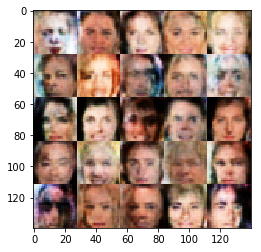

Epoch 2/5... Discriminator Loss: 0.0242... Generator Loss: 5.9935
Epoch 2/5... Discriminator Loss: 0.0254... Generator Loss: 7.7218
Epoch 2/5... Discriminator Loss: 0.1145... Generator Loss: 3.3792
Epoch 2/5... Discriminator Loss: 0.6113... Generator Loss: 1.0423
Epoch 2/5... Discriminator Loss: 0.0694... Generator Loss: 3.5881
Epoch 2/5... Discriminator Loss: 0.0477... Generator Loss: 5.2706
Epoch 2/5... Discriminator Loss: 0.1469... Generator Loss: 2.9825
Epoch 2/5... Discriminator Loss: 0.3939... Generator Loss: 1.4568
Epoch 2/5... Discriminator Loss: 0.1033... Generator Loss: 2.8781
Epoch 2/5... Discriminator Loss: 0.2517... Generator Loss: 4.3043


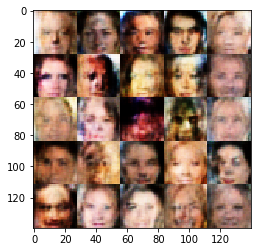

Epoch 2/5... Discriminator Loss: 1.2654... Generator Loss: 0.4962
Epoch 2/5... Discriminator Loss: 0.6565... Generator Loss: 1.0532
Epoch 2/5... Discriminator Loss: 0.0187... Generator Loss: 9.2757
Epoch 2/5... Discriminator Loss: 0.1621... Generator Loss: 2.7217
Epoch 2/5... Discriminator Loss: 0.8599... Generator Loss: 0.7168
Epoch 2/5... Discriminator Loss: 0.1198... Generator Loss: 2.8017
Epoch 2/5... Discriminator Loss: 0.1151... Generator Loss: 2.8558
Epoch 2/5... Discriminator Loss: 0.0765... Generator Loss: 3.6785
Epoch 2/5... Discriminator Loss: 2.4645... Generator Loss: 3.6544
Epoch 2/5... Discriminator Loss: 1.3201... Generator Loss: 0.4414


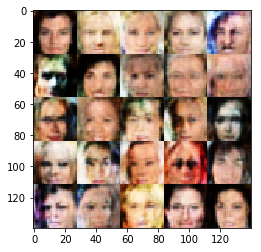

Epoch 2/5... Discriminator Loss: 0.2145... Generator Loss: 2.5252
Epoch 2/5... Discriminator Loss: 0.5086... Generator Loss: 1.2915
Epoch 2/5... Discriminator Loss: 0.0323... Generator Loss: 7.1719
Epoch 2/5... Discriminator Loss: 0.9810... Generator Loss: 0.6220
Epoch 2/5... Discriminator Loss: 0.1333... Generator Loss: 2.6443
Epoch 2/5... Discriminator Loss: 0.0384... Generator Loss: 4.5961
Epoch 2/5... Discriminator Loss: 0.0422... Generator Loss: 6.3276
Epoch 2/5... Discriminator Loss: 0.0572... Generator Loss: 5.9845
Epoch 2/5... Discriminator Loss: 0.1396... Generator Loss: 2.5369
Epoch 2/5... Discriminator Loss: 0.0169... Generator Loss: 4.8288


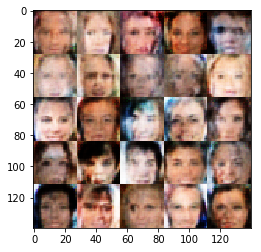

Epoch 2/5... Discriminator Loss: 0.0104... Generator Loss: 7.8487
Epoch 2/5... Discriminator Loss: 0.3846... Generator Loss: 1.4742
Epoch 2/5... Discriminator Loss: 0.0285... Generator Loss: 4.3629
Epoch 2/5... Discriminator Loss: 0.1061... Generator Loss: 3.2090
Epoch 2/5... Discriminator Loss: 0.0458... Generator Loss: 4.1021
Epoch 2/5... Discriminator Loss: 0.0751... Generator Loss: 3.0644
Epoch 2/5... Discriminator Loss: 0.0150... Generator Loss: 13.9406
Epoch 2/5... Discriminator Loss: 0.0222... Generator Loss: 6.4813
Epoch 2/5... Discriminator Loss: 0.0823... Generator Loss: 3.4671
Epoch 2/5... Discriminator Loss: 0.0229... Generator Loss: 10.4896


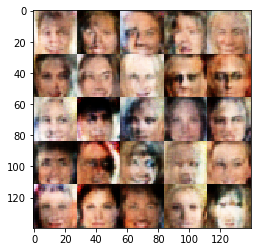

Epoch 2/5... Discriminator Loss: 2.5376... Generator Loss: 0.1121
Epoch 2/5... Discriminator Loss: 0.4827... Generator Loss: 1.4688
Epoch 2/5... Discriminator Loss: 0.0537... Generator Loss: 5.1760
Epoch 2/5... Discriminator Loss: 0.4320... Generator Loss: 1.5822
Epoch 2/5... Discriminator Loss: 0.0851... Generator Loss: 3.2299
Epoch 2/5... Discriminator Loss: 0.0782... Generator Loss: 4.0248
Epoch 2/5... Discriminator Loss: 0.0814... Generator Loss: 4.6504
Epoch 2/5... Discriminator Loss: 0.0647... Generator Loss: 5.3780
Epoch 2/5... Discriminator Loss: 0.0341... Generator Loss: 5.9669
Epoch 2/5... Discriminator Loss: 0.0346... Generator Loss: 6.1476


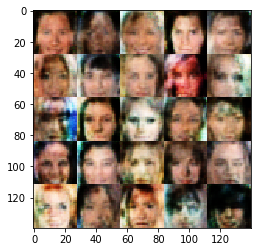

Epoch 2/5... Discriminator Loss: 0.1578... Generator Loss: 2.6467
Epoch 2/5... Discriminator Loss: 0.0338... Generator Loss: 7.2781
Epoch 2/5... Discriminator Loss: 0.7462... Generator Loss: 2.2719
Epoch 2/5... Discriminator Loss: 0.2494... Generator Loss: 2.3634
Epoch 2/5... Discriminator Loss: 0.2510... Generator Loss: 1.9972
Epoch 2/5... Discriminator Loss: 0.0793... Generator Loss: 8.2433
Epoch 2/5... Discriminator Loss: 0.0388... Generator Loss: 5.8150
Epoch 2/5... Discriminator Loss: 0.7865... Generator Loss: 4.6054
Epoch 2/5... Discriminator Loss: 0.2970... Generator Loss: 2.5941
Epoch 2/5... Discriminator Loss: 0.0687... Generator Loss: 4.9154


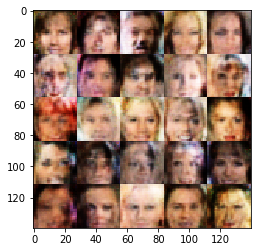

Epoch 2/5... Discriminator Loss: 0.0781... Generator Loss: 4.0145
Epoch 2/5... Discriminator Loss: 0.0420... Generator Loss: 5.7508
Epoch 2/5... Discriminator Loss: 0.1230... Generator Loss: 3.1870
Epoch 2/5... Discriminator Loss: 0.1946... Generator Loss: 2.1662
Epoch 2/5... Discriminator Loss: 0.0438... Generator Loss: 9.0499
Epoch 2/5... Discriminator Loss: 0.1398... Generator Loss: 2.7978
Epoch 2/5... Discriminator Loss: 0.0616... Generator Loss: 4.0778
Epoch 2/5... Discriminator Loss: 0.0927... Generator Loss: 3.8443
Epoch 2/5... Discriminator Loss: 0.1198... Generator Loss: 6.9676
Epoch 2/5... Discriminator Loss: 0.0613... Generator Loss: 3.5937


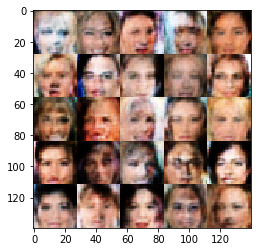

Epoch 2/5... Discriminator Loss: 0.5080... Generator Loss: 1.1637
Epoch 2/5... Discriminator Loss: 0.0294... Generator Loss: 4.7555
Epoch 2/5... Discriminator Loss: 0.3334... Generator Loss: 9.3749
Epoch 2/5... Discriminator Loss: 0.1659... Generator Loss: 2.5886
Epoch 2/5... Discriminator Loss: 3.0464... Generator Loss: 0.0744
Epoch 2/5... Discriminator Loss: 0.0911... Generator Loss: 4.7990
Epoch 2/5... Discriminator Loss: 0.0372... Generator Loss: 5.5992
Epoch 2/5... Discriminator Loss: 0.0156... Generator Loss: 8.1276
Epoch 2/5... Discriminator Loss: 0.0739... Generator Loss: 3.3079
Epoch 2/5... Discriminator Loss: 0.0254... Generator Loss: 6.4589


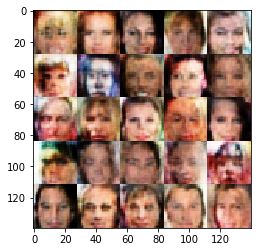

Epoch 2/5... Discriminator Loss: 0.0774... Generator Loss: 3.4188
Epoch 2/5... Discriminator Loss: 0.1961... Generator Loss: 2.0131
Epoch 2/5... Discriminator Loss: 0.0407... Generator Loss: 3.8645
Epoch 2/5... Discriminator Loss: 0.0448... Generator Loss: 4.6980
Epoch 2/5... Discriminator Loss: 0.0126... Generator Loss: 6.9318
Epoch 2/5... Discriminator Loss: 0.0857... Generator Loss: 3.9400
Epoch 2/5... Discriminator Loss: 1.0743... Generator Loss: 1.1462
Epoch 2/5... Discriminator Loss: 0.0558... Generator Loss: 4.6148
Epoch 2/5... Discriminator Loss: 0.1123... Generator Loss: 2.9315
Epoch 2/5... Discriminator Loss: 0.0428... Generator Loss: 5.2023


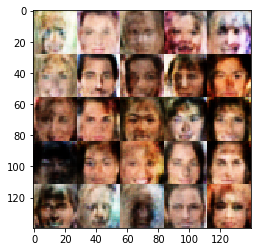

Epoch 2/5... Discriminator Loss: 0.2723... Generator Loss: 2.3247
Epoch 2/5... Discriminator Loss: 0.9041... Generator Loss: 1.4944
Epoch 2/5... Discriminator Loss: 0.3970... Generator Loss: 1.9641
Epoch 2/5... Discriminator Loss: 0.5693... Generator Loss: 1.4954
Epoch 2/5... Discriminator Loss: 0.8265... Generator Loss: 1.1746
Epoch 2/5... Discriminator Loss: 0.3013... Generator Loss: 1.8515
Epoch 2/5... Discriminator Loss: 0.8355... Generator Loss: 2.1830
Epoch 2/5... Discriminator Loss: 0.5859... Generator Loss: 1.8123
Epoch 2/5... Discriminator Loss: 0.2667... Generator Loss: 2.2665
Epoch 2/5... Discriminator Loss: 0.1010... Generator Loss: 3.5365


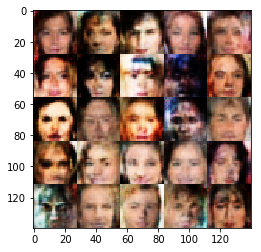

Epoch 2/5... Discriminator Loss: 0.0553... Generator Loss: 4.5675
Epoch 2/5... Discriminator Loss: 0.0456... Generator Loss: 4.4146
Epoch 2/5... Discriminator Loss: 0.3916... Generator Loss: 1.3840
Epoch 2/5... Discriminator Loss: 0.0691... Generator Loss: 3.5055
Epoch 2/5... Discriminator Loss: 0.0809... Generator Loss: 3.3653
Epoch 2/5... Discriminator Loss: 0.0429... Generator Loss: 4.2612
Epoch 2/5... Discriminator Loss: 0.0227... Generator Loss: 5.8012
Epoch 2/5... Discriminator Loss: 0.0782... Generator Loss: 3.5424
Epoch 2/5... Discriminator Loss: 0.4056... Generator Loss: 1.4456
Epoch 2/5... Discriminator Loss: 0.0330... Generator Loss: 6.4019


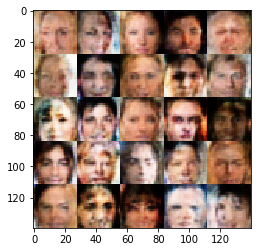

Epoch 2/5... Discriminator Loss: 0.0476... Generator Loss: 4.2325
Epoch 2/5... Discriminator Loss: 0.1058... Generator Loss: 2.7426
Epoch 2/5... Discriminator Loss: 0.0516... Generator Loss: 4.4015
Epoch 2/5... Discriminator Loss: 2.4805... Generator Loss: 0.1773
Epoch 2/5... Discriminator Loss: 0.9283... Generator Loss: 0.7147
Epoch 2/5... Discriminator Loss: 0.4435... Generator Loss: 1.3566
Epoch 2/5... Discriminator Loss: 0.6416... Generator Loss: 0.9394
Epoch 2/5... Discriminator Loss: 0.0796... Generator Loss: 4.2331
Epoch 2/5... Discriminator Loss: 0.4124... Generator Loss: 1.4407
Epoch 2/5... Discriminator Loss: 0.3736... Generator Loss: 1.5818


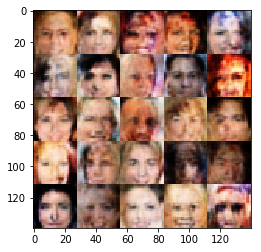

Epoch 2/5... Discriminator Loss: 0.2590... Generator Loss: 7.5539
Epoch 2/5... Discriminator Loss: 0.0427... Generator Loss: 7.2567
Epoch 2/5... Discriminator Loss: 0.0695... Generator Loss: 3.9793
Epoch 2/5... Discriminator Loss: 0.0856... Generator Loss: 6.1167
Epoch 2/5... Discriminator Loss: 0.0293... Generator Loss: 5.5332
Epoch 2/5... Discriminator Loss: 0.0245... Generator Loss: 5.1717
Epoch 2/5... Discriminator Loss: 0.1425... Generator Loss: 3.0244
Epoch 2/5... Discriminator Loss: 3.7000... Generator Loss: 6.7484
Epoch 2/5... Discriminator Loss: 0.3988... Generator Loss: 1.8395
Epoch 2/5... Discriminator Loss: 0.3006... Generator Loss: 3.1263


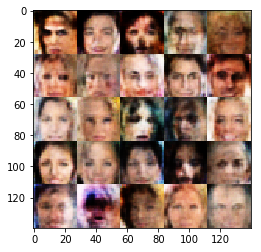

Epoch 2/5... Discriminator Loss: 0.2252... Generator Loss: 2.5261
Epoch 2/5... Discriminator Loss: 0.3032... Generator Loss: 4.9286
Epoch 2/5... Discriminator Loss: 0.0470... Generator Loss: 4.0757
Epoch 2/5... Discriminator Loss: 0.1546... Generator Loss: 9.4781
Epoch 2/5... Discriminator Loss: 0.0500... Generator Loss: 6.9470
Epoch 2/5... Discriminator Loss: 0.1133... Generator Loss: 3.2041
Epoch 2/5... Discriminator Loss: 0.3239... Generator Loss: 2.0427
Epoch 2/5... Discriminator Loss: 0.0455... Generator Loss: 4.0160
Epoch 2/5... Discriminator Loss: 0.1280... Generator Loss: 3.5127
Epoch 2/5... Discriminator Loss: 0.0993... Generator Loss: 3.0211


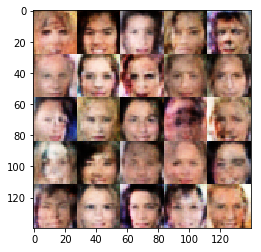

Epoch 2/5... Discriminator Loss: 0.0197... Generator Loss: 7.9971
Epoch 2/5... Discriminator Loss: 0.1653... Generator Loss: 2.3060
Epoch 2/5... Discriminator Loss: 0.0227... Generator Loss: 5.9948
Epoch 2/5... Discriminator Loss: 0.0324... Generator Loss: 6.1774
Epoch 2/5... Discriminator Loss: 0.1040... Generator Loss: 9.1415
Epoch 2/5... Discriminator Loss: 1.1901... Generator Loss: 0.5031
Epoch 2/5... Discriminator Loss: 0.1096... Generator Loss: 2.9212
Epoch 2/5... Discriminator Loss: 0.1630... Generator Loss: 3.7547
Epoch 2/5... Discriminator Loss: 0.2104... Generator Loss: 2.2597
Epoch 2/5... Discriminator Loss: 0.2015... Generator Loss: 2.2884


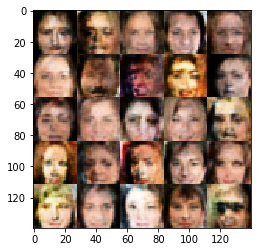

Epoch 2/5... Discriminator Loss: 0.0377... Generator Loss: 8.1236
Epoch 2/5... Discriminator Loss: 0.0440... Generator Loss: 5.3924
Epoch 2/5... Discriminator Loss: 0.0596... Generator Loss: 5.8409
Epoch 2/5... Discriminator Loss: 0.0248... Generator Loss: 5.4288
Epoch 2/5... Discriminator Loss: 0.1155... Generator Loss: 3.0966
Epoch 2/5... Discriminator Loss: 0.6801... Generator Loss: 1.1407
Epoch 2/5... Discriminator Loss: 0.2241... Generator Loss: 3.0803
Epoch 2/5... Discriminator Loss: 0.0861... Generator Loss: 3.9859
Epoch 2/5... Discriminator Loss: 0.1389... Generator Loss: 2.6515
Epoch 2/5... Discriminator Loss: 0.0510... Generator Loss: 6.8499


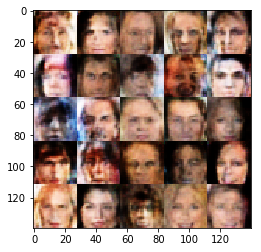

Epoch 2/5... Discriminator Loss: 1.1607... Generator Loss: 0.5268
Epoch 2/5... Discriminator Loss: 0.8540... Generator Loss: 0.7981
Epoch 2/5... Discriminator Loss: 0.1153... Generator Loss: 5.9133
Epoch 2/5... Discriminator Loss: 0.0691... Generator Loss: 5.5252
Epoch 2/5... Discriminator Loss: 0.6243... Generator Loss: 2.8157
Epoch 2/5... Discriminator Loss: 0.1337... Generator Loss: 2.7649
Epoch 2/5... Discriminator Loss: 0.0452... Generator Loss: 5.9989
Epoch 2/5... Discriminator Loss: 0.0716... Generator Loss: 3.6558
Epoch 2/5... Discriminator Loss: 0.0702... Generator Loss: 4.4435
Epoch 2/5... Discriminator Loss: 0.0315... Generator Loss: 6.0286


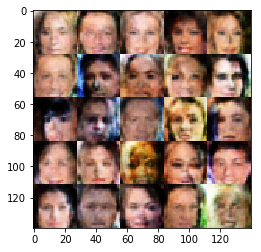

Epoch 2/5... Discriminator Loss: 0.0746... Generator Loss: 3.8762
Epoch 2/5... Discriminator Loss: 0.0176... Generator Loss: 6.7255
Epoch 2/5... Discriminator Loss: 0.0469... Generator Loss: 4.2877
Epoch 2/5... Discriminator Loss: 0.0574... Generator Loss: 3.7965
Epoch 2/5... Discriminator Loss: 0.0232... Generator Loss: 4.9835
Epoch 2/5... Discriminator Loss: 0.0344... Generator Loss: 4.5161
Epoch 2/5... Discriminator Loss: 0.0670... Generator Loss: 3.6324
Epoch 2/5... Discriminator Loss: 0.1582... Generator Loss: 2.7126
Epoch 2/5... Discriminator Loss: 0.0522... Generator Loss: 7.3719
Epoch 2/5... Discriminator Loss: 0.0516... Generator Loss: 3.7007


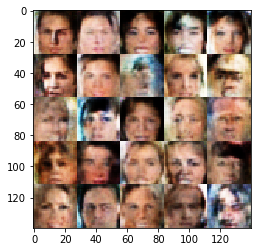

Epoch 2/5... Discriminator Loss: 0.8533... Generator Loss: 0.8405
Epoch 2/5... Discriminator Loss: 0.0424... Generator Loss: 4.6886
Epoch 2/5... Discriminator Loss: 1.5226... Generator Loss: 4.5184
Epoch 2/5... Discriminator Loss: 1.4450... Generator Loss: 0.4122
Epoch 2/5... Discriminator Loss: 1.7340... Generator Loss: 0.2933
Epoch 2/5... Discriminator Loss: 0.3927... Generator Loss: 5.5720
Epoch 2/5... Discriminator Loss: 0.4278... Generator Loss: 1.3748
Epoch 2/5... Discriminator Loss: 0.0120... Generator Loss: 6.2041
Epoch 2/5... Discriminator Loss: 0.0284... Generator Loss: 5.9961
Epoch 2/5... Discriminator Loss: 0.0203... Generator Loss: 6.1074


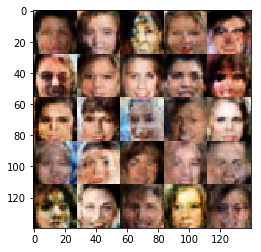

Epoch 2/5... Discriminator Loss: 0.6942... Generator Loss: 4.7770
Epoch 2/5... Discriminator Loss: 0.1028... Generator Loss: 4.3311
Epoch 2/5... Discriminator Loss: 0.0731... Generator Loss: 4.3282
Epoch 2/5... Discriminator Loss: 1.2485... Generator Loss: 0.4826
Epoch 2/5... Discriminator Loss: 0.5720... Generator Loss: 1.1663
Epoch 2/5... Discriminator Loss: 0.0963... Generator Loss: 7.1124
Epoch 2/5... Discriminator Loss: 0.2636... Generator Loss: 1.9846
Epoch 2/5... Discriminator Loss: 0.0166... Generator Loss: 7.2431
Epoch 2/5... Discriminator Loss: 0.0411... Generator Loss: 7.3234
Epoch 2/5... Discriminator Loss: 0.1018... Generator Loss: 2.9159


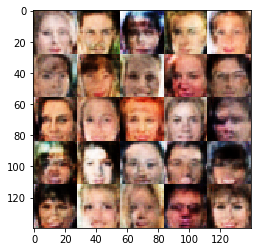

Epoch 2/5... Discriminator Loss: 0.0303... Generator Loss: 4.8449
Epoch 2/5... Discriminator Loss: 0.3852... Generator Loss: 6.7128
Epoch 2/5... Discriminator Loss: 0.0858... Generator Loss: 3.8531
Epoch 2/5... Discriminator Loss: 0.1241... Generator Loss: 2.9477
Epoch 2/5... Discriminator Loss: 0.0893... Generator Loss: 4.1972
Epoch 2/5... Discriminator Loss: 0.0338... Generator Loss: 4.4749
Epoch 2/5... Discriminator Loss: 0.0445... Generator Loss: 5.6064
Epoch 2/5... Discriminator Loss: 0.0422... Generator Loss: 4.7285
Epoch 2/5... Discriminator Loss: 0.0107... Generator Loss: 7.1891
Epoch 2/5... Discriminator Loss: 0.0119... Generator Loss: 6.8903


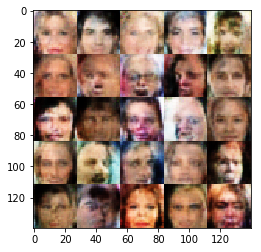

Epoch 2/5... Discriminator Loss: 0.0263... Generator Loss: 6.9316
Epoch 2/5... Discriminator Loss: 0.0369... Generator Loss: 4.6225
Epoch 2/5... Discriminator Loss: 0.1526... Generator Loss: 2.5015
Epoch 2/5... Discriminator Loss: 0.2234... Generator Loss: 2.2365
Epoch 2/5... Discriminator Loss: 0.0280... Generator Loss: 5.2350
Epoch 2/5... Discriminator Loss: 0.0350... Generator Loss: 4.9228
Epoch 2/5... Discriminator Loss: 0.0632... Generator Loss: 9.2263
Epoch 2/5... Discriminator Loss: 0.0285... Generator Loss: 5.2223
Epoch 2/5... Discriminator Loss: 0.0477... Generator Loss: 6.2208
Epoch 2/5... Discriminator Loss: 0.1637... Generator Loss: 4.7836


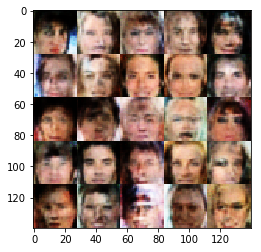

Epoch 2/5... Discriminator Loss: 1.3858... Generator Loss: 0.3611
Epoch 2/5... Discriminator Loss: 0.9447... Generator Loss: 0.8441
Epoch 2/5... Discriminator Loss: 0.1186... Generator Loss: 3.1277
Epoch 2/5... Discriminator Loss: 0.1024... Generator Loss: 7.0050
Epoch 2/5... Discriminator Loss: 0.0493... Generator Loss: 6.6984
Epoch 2/5... Discriminator Loss: 0.3328... Generator Loss: 1.6663
Epoch 2/5... Discriminator Loss: 0.3002... Generator Loss: 3.7650
Epoch 2/5... Discriminator Loss: 0.2190... Generator Loss: 2.0995
Epoch 2/5... Discriminator Loss: 0.5261... Generator Loss: 3.5916
Epoch 2/5... Discriminator Loss: 0.0625... Generator Loss: 4.7732


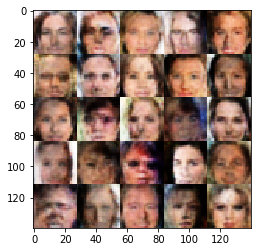

Epoch 2/5... Discriminator Loss: 0.1301... Generator Loss: 2.8638
Epoch 2/5... Discriminator Loss: 0.5819... Generator Loss: 1.7449
Epoch 2/5... Discriminator Loss: 0.0254... Generator Loss: 5.0891
Epoch 2/5... Discriminator Loss: 0.0403... Generator Loss: 4.2474
Epoch 2/5... Discriminator Loss: 0.1147... Generator Loss: 2.8467
Epoch 2/5... Discriminator Loss: 0.0399... Generator Loss: 7.6663
Epoch 2/5... Discriminator Loss: 0.4339... Generator Loss: 1.4079
Epoch 2/5... Discriminator Loss: 0.0290... Generator Loss: 11.0860
Epoch 2/5... Discriminator Loss: 0.0947... Generator Loss: 7.0471
Epoch 2/5... Discriminator Loss: 0.0198... Generator Loss: 5.5304


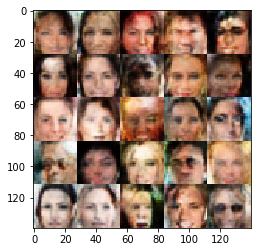

Epoch 2/5... Discriminator Loss: 0.0667... Generator Loss: 4.0515
Epoch 2/5... Discriminator Loss: 0.0720... Generator Loss: 3.5135
Epoch 2/5... Discriminator Loss: 0.2122... Generator Loss: 2.0493
Epoch 2/5... Discriminator Loss: 2.9981... Generator Loss: 4.3890
Epoch 2/5... Discriminator Loss: 0.6438... Generator Loss: 1.1152
Epoch 2/5... Discriminator Loss: 0.5441... Generator Loss: 1.8305
Epoch 2/5... Discriminator Loss: 0.2050... Generator Loss: 2.9765
Epoch 2/5... Discriminator Loss: 0.3002... Generator Loss: 6.0105
Epoch 2/5... Discriminator Loss: 0.4433... Generator Loss: 1.4789
Epoch 2/5... Discriminator Loss: 0.0661... Generator Loss: 5.4313


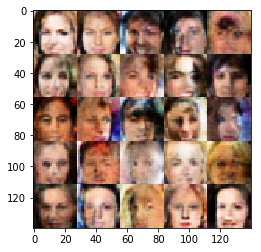

Epoch 2/5... Discriminator Loss: 0.0884... Generator Loss: 6.0686
Epoch 2/5... Discriminator Loss: 0.1866... Generator Loss: 2.2572
Epoch 2/5... Discriminator Loss: 0.0264... Generator Loss: 6.2580
Epoch 2/5... Discriminator Loss: 0.0356... Generator Loss: 4.4009
Epoch 2/5... Discriminator Loss: 0.0404... Generator Loss: 5.8155
Epoch 2/5... Discriminator Loss: 0.7107... Generator Loss: 0.9380
Epoch 2/5... Discriminator Loss: 0.0483... Generator Loss: 5.7636
Epoch 2/5... Discriminator Loss: 0.0601... Generator Loss: 7.7191
Epoch 2/5... Discriminator Loss: 3.7310... Generator Loss: 3.9322
Epoch 2/5... Discriminator Loss: 0.1329... Generator Loss: 2.7171


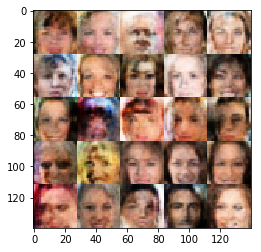

Epoch 2/5... Discriminator Loss: 0.3261... Generator Loss: 1.7163
Epoch 2/5... Discriminator Loss: 0.4559... Generator Loss: 4.0718
Epoch 2/5... Discriminator Loss: 0.1052... Generator Loss: 3.4971
Epoch 2/5... Discriminator Loss: 0.1037... Generator Loss: 7.2512
Epoch 2/5... Discriminator Loss: 0.1417... Generator Loss: 2.8379
Epoch 2/5... Discriminator Loss: 0.0524... Generator Loss: 4.1535
Epoch 2/5... Discriminator Loss: 0.1392... Generator Loss: 4.3945
Epoch 2/5... Discriminator Loss: 0.0504... Generator Loss: 7.0740
Epoch 2/5... Discriminator Loss: 0.0653... Generator Loss: 3.9026
Epoch 2/5... Discriminator Loss: 0.0936... Generator Loss: 2.8550


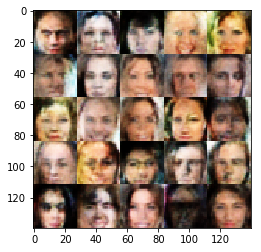

Epoch 2/5... Discriminator Loss: 0.1353... Generator Loss: 2.5411
Epoch 2/5... Discriminator Loss: 0.8184... Generator Loss: 7.0219
Epoch 2/5... Discriminator Loss: 1.6012... Generator Loss: 0.4137
Epoch 3/5... Discriminator Loss: 0.1791... Generator Loss: 3.4212
Epoch 3/5... Discriminator Loss: 0.0571... Generator Loss: 6.6685
Epoch 3/5... Discriminator Loss: 0.1256... Generator Loss: 5.2255
Epoch 3/5... Discriminator Loss: 0.0947... Generator Loss: 2.9486
Epoch 3/5... Discriminator Loss: 0.3120... Generator Loss: 1.9650
Epoch 3/5... Discriminator Loss: 0.0252... Generator Loss: 5.2436
Epoch 3/5... Discriminator Loss: 0.1238... Generator Loss: 4.6392


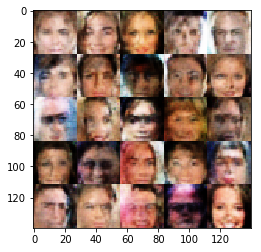

Epoch 3/5... Discriminator Loss: 0.0548... Generator Loss: 7.4996
Epoch 3/5... Discriminator Loss: 0.0979... Generator Loss: 4.3413
Epoch 3/5... Discriminator Loss: 0.1940... Generator Loss: 2.2379
Epoch 3/5... Discriminator Loss: 0.0234... Generator Loss: 8.6687
Epoch 3/5... Discriminator Loss: 0.2685... Generator Loss: 1.8774
Epoch 3/5... Discriminator Loss: 0.0918... Generator Loss: 3.0325
Epoch 3/5... Discriminator Loss: 0.0387... Generator Loss: 5.2613
Epoch 3/5... Discriminator Loss: 0.0179... Generator Loss: 6.1443
Epoch 3/5... Discriminator Loss: 0.0238... Generator Loss: 6.2950
Epoch 3/5... Discriminator Loss: 1.8656... Generator Loss: 3.8812


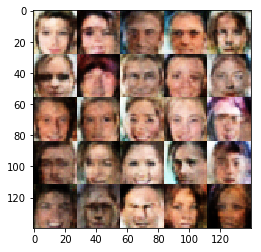

Epoch 3/5... Discriminator Loss: 1.0092... Generator Loss: 0.7006
Epoch 3/5... Discriminator Loss: 0.4735... Generator Loss: 2.6932
Epoch 3/5... Discriminator Loss: 0.2294... Generator Loss: 2.0149
Epoch 3/5... Discriminator Loss: 0.3302... Generator Loss: 1.7591
Epoch 3/5... Discriminator Loss: 0.0537... Generator Loss: 4.8795
Epoch 3/5... Discriminator Loss: 0.0194... Generator Loss: 7.4007
Epoch 3/5... Discriminator Loss: 0.0870... Generator Loss: 4.8587
Epoch 3/5... Discriminator Loss: 0.0528... Generator Loss: 4.2163
Epoch 3/5... Discriminator Loss: 0.1875... Generator Loss: 5.8775
Epoch 3/5... Discriminator Loss: 0.0100... Generator Loss: 8.1803


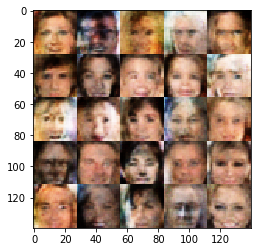

Epoch 3/5... Discriminator Loss: 0.1334... Generator Loss: 2.8955
Epoch 3/5... Discriminator Loss: 0.1984... Generator Loss: 2.1623
Epoch 3/5... Discriminator Loss: 0.0229... Generator Loss: 5.6064
Epoch 3/5... Discriminator Loss: 0.0544... Generator Loss: 7.2408
Epoch 3/5... Discriminator Loss: 0.0171... Generator Loss: 6.0715
Epoch 3/5... Discriminator Loss: 0.0786... Generator Loss: 3.1272
Epoch 3/5... Discriminator Loss: 0.0560... Generator Loss: 3.4389
Epoch 3/5... Discriminator Loss: 0.2023... Generator Loss: 2.0974
Epoch 3/5... Discriminator Loss: 0.5283... Generator Loss: 1.0813
Epoch 3/5... Discriminator Loss: 0.3168... Generator Loss: 6.4216


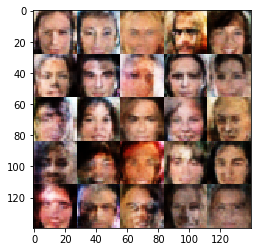

Epoch 3/5... Discriminator Loss: 1.2561... Generator Loss: 0.5206
Epoch 3/5... Discriminator Loss: 0.1997... Generator Loss: 3.5288
Epoch 3/5... Discriminator Loss: 0.0768... Generator Loss: 3.5064
Epoch 3/5... Discriminator Loss: 0.1075... Generator Loss: 5.5475
Epoch 3/5... Discriminator Loss: 0.5492... Generator Loss: 3.1645
Epoch 3/5... Discriminator Loss: 0.5895... Generator Loss: 1.2406
Epoch 3/5... Discriminator Loss: 0.1033... Generator Loss: 3.9675
Epoch 3/5... Discriminator Loss: 0.1787... Generator Loss: 2.4043
Epoch 3/5... Discriminator Loss: 0.3344... Generator Loss: 1.5221
Epoch 3/5... Discriminator Loss: 0.0370... Generator Loss: 5.9482


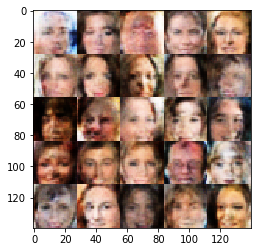

Epoch 3/5... Discriminator Loss: 0.0672... Generator Loss: 3.8087
Epoch 3/5... Discriminator Loss: 0.1050... Generator Loss: 3.4647
Epoch 3/5... Discriminator Loss: 0.1544... Generator Loss: 2.3952
Epoch 3/5... Discriminator Loss: 1.0376... Generator Loss: 0.5773
Epoch 3/5... Discriminator Loss: 0.0560... Generator Loss: 4.0339
Epoch 3/5... Discriminator Loss: 0.1095... Generator Loss: 3.3897
Epoch 3/5... Discriminator Loss: 0.0508... Generator Loss: 4.6913
Epoch 3/5... Discriminator Loss: 0.0779... Generator Loss: 6.1280
Epoch 3/5... Discriminator Loss: 0.0266... Generator Loss: 4.4640
Epoch 3/5... Discriminator Loss: 0.2856... Generator Loss: 1.7948


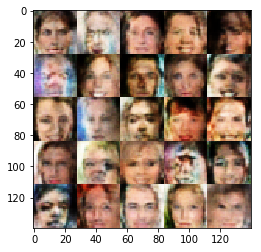

Epoch 3/5... Discriminator Loss: 0.0566... Generator Loss: 4.4085
Epoch 3/5... Discriminator Loss: 0.0692... Generator Loss: 3.5061
Epoch 3/5... Discriminator Loss: 0.0427... Generator Loss: 4.8271
Epoch 3/5... Discriminator Loss: 0.0252... Generator Loss: 4.8190
Epoch 3/5... Discriminator Loss: 0.1139... Generator Loss: 3.1862
Epoch 3/5... Discriminator Loss: 0.0391... Generator Loss: 6.8422
Epoch 3/5... Discriminator Loss: 0.0526... Generator Loss: 10.5783
Epoch 3/5... Discriminator Loss: 0.1074... Generator Loss: 3.0242
Epoch 3/5... Discriminator Loss: 0.1701... Generator Loss: 2.6277
Epoch 3/5... Discriminator Loss: 1.8641... Generator Loss: 0.3310


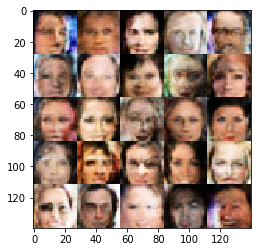

Epoch 3/5... Discriminator Loss: 0.5309... Generator Loss: 1.4091
Epoch 3/5... Discriminator Loss: 1.7823... Generator Loss: 0.2652
Epoch 3/5... Discriminator Loss: 0.4706... Generator Loss: 1.9597
Epoch 3/5... Discriminator Loss: 0.3378... Generator Loss: 1.9420
Epoch 3/5... Discriminator Loss: 0.0535... Generator Loss: 4.3122
Epoch 3/5... Discriminator Loss: 0.1324... Generator Loss: 3.6447
Epoch 3/5... Discriminator Loss: 0.4319... Generator Loss: 1.2838
Epoch 3/5... Discriminator Loss: 0.1597... Generator Loss: 3.0900
Epoch 3/5... Discriminator Loss: 0.3797... Generator Loss: 1.6474
Epoch 3/5... Discriminator Loss: 0.2245... Generator Loss: 2.2542


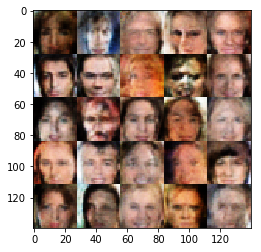

Epoch 3/5... Discriminator Loss: 0.0488... Generator Loss: 5.0101
Epoch 3/5... Discriminator Loss: 0.0302... Generator Loss: 6.3226
Epoch 3/5... Discriminator Loss: 0.0383... Generator Loss: 8.6468
Epoch 3/5... Discriminator Loss: 0.2264... Generator Loss: 2.0966
Epoch 3/5... Discriminator Loss: 0.2549... Generator Loss: 1.9805
Epoch 3/5... Discriminator Loss: 0.0302... Generator Loss: 5.8461
Epoch 3/5... Discriminator Loss: 0.0354... Generator Loss: 5.8315
Epoch 3/5... Discriminator Loss: 0.0756... Generator Loss: 4.3146
Epoch 3/5... Discriminator Loss: 0.0757... Generator Loss: 3.4015
Epoch 3/5... Discriminator Loss: 0.0501... Generator Loss: 7.4026


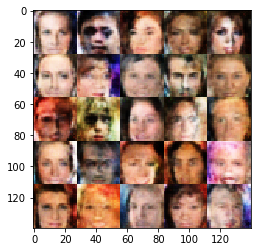

Epoch 3/5... Discriminator Loss: 0.1932... Generator Loss: 4.3637
Epoch 3/5... Discriminator Loss: 0.0455... Generator Loss: 4.9946
Epoch 3/5... Discriminator Loss: 0.0237... Generator Loss: 8.9005
Epoch 3/5... Discriminator Loss: 0.0208... Generator Loss: 7.8585
Epoch 3/5... Discriminator Loss: 0.0669... Generator Loss: 4.0684
Epoch 3/5... Discriminator Loss: 0.0639... Generator Loss: 3.3013
Epoch 3/5... Discriminator Loss: 2.0303... Generator Loss: 6.0238
Epoch 3/5... Discriminator Loss: 1.0859... Generator Loss: 0.5631
Epoch 3/5... Discriminator Loss: 0.3940... Generator Loss: 3.5916
Epoch 3/5... Discriminator Loss: 0.4876... Generator Loss: 1.4937


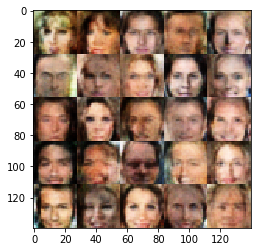

Epoch 3/5... Discriminator Loss: 0.0842... Generator Loss: 5.1941
Epoch 3/5... Discriminator Loss: 0.2302... Generator Loss: 2.3703
Epoch 3/5... Discriminator Loss: 0.2483... Generator Loss: 1.9150
Epoch 3/5... Discriminator Loss: 0.1092... Generator Loss: 4.5640
Epoch 3/5... Discriminator Loss: 0.0849... Generator Loss: 5.6341
Epoch 3/5... Discriminator Loss: 0.0790... Generator Loss: 3.5455
Epoch 3/5... Discriminator Loss: 0.3797... Generator Loss: 2.0465
Epoch 3/5... Discriminator Loss: 0.3017... Generator Loss: 1.8889
Epoch 3/5... Discriminator Loss: 0.0337... Generator Loss: 7.0138
Epoch 3/5... Discriminator Loss: 0.1958... Generator Loss: 4.6651


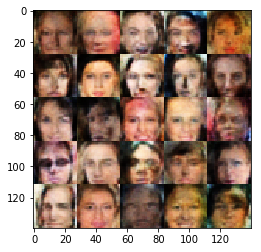

Epoch 3/5... Discriminator Loss: 0.1248... Generator Loss: 2.8959
Epoch 3/5... Discriminator Loss: 0.0835... Generator Loss: 3.2790
Epoch 3/5... Discriminator Loss: 0.0267... Generator Loss: 7.4613
Epoch 3/5... Discriminator Loss: 0.0533... Generator Loss: 4.4307
Epoch 3/5... Discriminator Loss: 0.0369... Generator Loss: 7.1377
Epoch 3/5... Discriminator Loss: 0.2022... Generator Loss: 6.3823
Epoch 3/5... Discriminator Loss: 0.0930... Generator Loss: 3.4102
Epoch 3/5... Discriminator Loss: 1.2731... Generator Loss: 2.0695
Epoch 3/5... Discriminator Loss: 0.4588... Generator Loss: 1.7935
Epoch 3/5... Discriminator Loss: 0.3079... Generator Loss: 1.6113


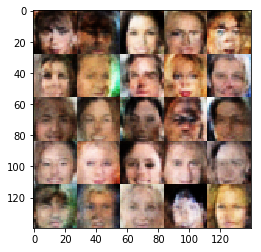

Epoch 3/5... Discriminator Loss: 0.9134... Generator Loss: 0.7469
Epoch 3/5... Discriminator Loss: 0.0887... Generator Loss: 3.6355
Epoch 3/5... Discriminator Loss: 0.5205... Generator Loss: 1.2022
Epoch 3/5... Discriminator Loss: 0.1069... Generator Loss: 2.8939
Epoch 3/5... Discriminator Loss: 0.5192... Generator Loss: 3.8415
Epoch 3/5... Discriminator Loss: 0.1034... Generator Loss: 3.0085
Epoch 3/5... Discriminator Loss: 0.2462... Generator Loss: 2.0628
Epoch 3/5... Discriminator Loss: 0.3015... Generator Loss: 1.8618
Epoch 3/5... Discriminator Loss: 0.0274... Generator Loss: 5.9480
Epoch 3/5... Discriminator Loss: 1.1002... Generator Loss: 3.8834


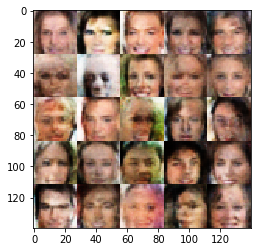

Epoch 3/5... Discriminator Loss: 1.6056... Generator Loss: 1.7635
Epoch 3/5... Discriminator Loss: 0.4840... Generator Loss: 2.2104
Epoch 3/5... Discriminator Loss: 1.1923... Generator Loss: 0.5500
Epoch 3/5... Discriminator Loss: 0.2307... Generator Loss: 2.9262
Epoch 3/5... Discriminator Loss: 0.3670... Generator Loss: 1.6656
Epoch 3/5... Discriminator Loss: 0.2911... Generator Loss: 3.5580
Epoch 3/5... Discriminator Loss: 0.6977... Generator Loss: 1.0055
Epoch 3/5... Discriminator Loss: 0.5406... Generator Loss: 1.5900
Epoch 3/5... Discriminator Loss: 0.0413... Generator Loss: 5.9333
Epoch 3/5... Discriminator Loss: 0.1342... Generator Loss: 3.5524


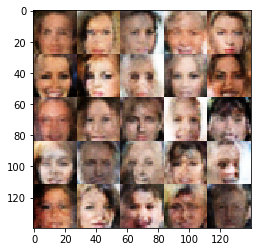

Epoch 3/5... Discriminator Loss: 0.0346... Generator Loss: 7.7429
Epoch 3/5... Discriminator Loss: 0.1029... Generator Loss: 2.8992
Epoch 3/5... Discriminator Loss: 0.0417... Generator Loss: 4.5926
Epoch 3/5... Discriminator Loss: 0.9396... Generator Loss: 0.6755
Epoch 3/5... Discriminator Loss: 0.0551... Generator Loss: 4.8319
Epoch 3/5... Discriminator Loss: 0.8336... Generator Loss: 1.1335
Epoch 3/5... Discriminator Loss: 0.6169... Generator Loss: 1.1915
Epoch 3/5... Discriminator Loss: 0.4562... Generator Loss: 1.5832
Epoch 3/5... Discriminator Loss: 0.2009... Generator Loss: 2.3881
Epoch 3/5... Discriminator Loss: 0.3891... Generator Loss: 1.8204


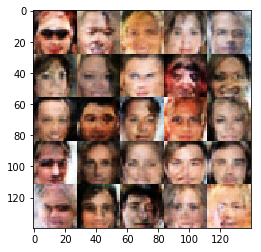

Epoch 3/5... Discriminator Loss: 0.8000... Generator Loss: 0.8047
Epoch 3/5... Discriminator Loss: 0.1689... Generator Loss: 3.2865
Epoch 3/5... Discriminator Loss: 0.0972... Generator Loss: 3.1247
Epoch 3/5... Discriminator Loss: 0.2094... Generator Loss: 2.2296
Epoch 3/5... Discriminator Loss: 0.1436... Generator Loss: 3.7985
Epoch 3/5... Discriminator Loss: 0.1649... Generator Loss: 2.5362
Epoch 3/5... Discriminator Loss: 0.0607... Generator Loss: 3.5436
Epoch 3/5... Discriminator Loss: 0.1466... Generator Loss: 3.2316
Epoch 3/5... Discriminator Loss: 0.0414... Generator Loss: 4.2907
Epoch 3/5... Discriminator Loss: 0.0725... Generator Loss: 3.3454


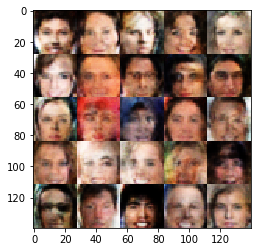

Epoch 3/5... Discriminator Loss: 0.0484... Generator Loss: 8.3913
Epoch 3/5... Discriminator Loss: 1.0437... Generator Loss: 5.3097
Epoch 3/5... Discriminator Loss: 0.3472... Generator Loss: 4.6264
Epoch 3/5... Discriminator Loss: 0.4066... Generator Loss: 1.7754
Epoch 3/5... Discriminator Loss: 0.3824... Generator Loss: 1.4791
Epoch 3/5... Discriminator Loss: 0.4973... Generator Loss: 1.2316
Epoch 3/5... Discriminator Loss: 0.0331... Generator Loss: 5.8787
Epoch 3/5... Discriminator Loss: 0.2725... Generator Loss: 1.9758
Epoch 3/5... Discriminator Loss: 0.0900... Generator Loss: 3.1156
Epoch 3/5... Discriminator Loss: 0.1022... Generator Loss: 3.2665


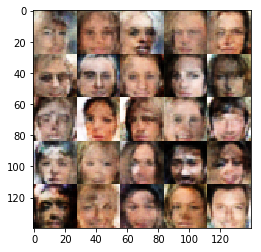

Epoch 3/5... Discriminator Loss: 4.0996... Generator Loss: 5.2168
Epoch 3/5... Discriminator Loss: 0.7063... Generator Loss: 0.9466
Epoch 3/5... Discriminator Loss: 0.3558... Generator Loss: 3.0827
Epoch 3/5... Discriminator Loss: 0.1245... Generator Loss: 2.7545
Epoch 3/5... Discriminator Loss: 0.0426... Generator Loss: 4.9625
Epoch 3/5... Discriminator Loss: 0.0404... Generator Loss: 5.4596
Epoch 3/5... Discriminator Loss: 0.9867... Generator Loss: 2.6826
Epoch 3/5... Discriminator Loss: 0.6839... Generator Loss: 1.0347
Epoch 3/5... Discriminator Loss: 0.6132... Generator Loss: 2.7752
Epoch 3/5... Discriminator Loss: 0.2412... Generator Loss: 2.0149


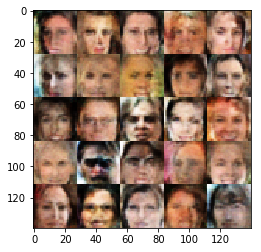

Epoch 3/5... Discriminator Loss: 0.6377... Generator Loss: 1.1944
Epoch 3/5... Discriminator Loss: 0.3822... Generator Loss: 1.7835
Epoch 3/5... Discriminator Loss: 0.6834... Generator Loss: 1.0160
Epoch 3/5... Discriminator Loss: 0.1608... Generator Loss: 2.4988
Epoch 3/5... Discriminator Loss: 0.3675... Generator Loss: 1.5729
Epoch 3/5... Discriminator Loss: 0.6302... Generator Loss: 1.0301
Epoch 3/5... Discriminator Loss: 0.0719... Generator Loss: 5.2352
Epoch 3/5... Discriminator Loss: 0.0491... Generator Loss: 4.6691
Epoch 3/5... Discriminator Loss: 0.0980... Generator Loss: 3.1482
Epoch 3/5... Discriminator Loss: 0.0913... Generator Loss: 3.7401


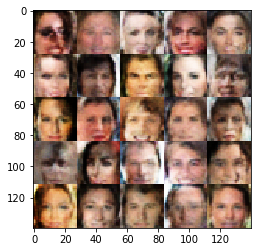

Epoch 3/5... Discriminator Loss: 0.2655... Generator Loss: 1.9039
Epoch 3/5... Discriminator Loss: 0.0978... Generator Loss: 4.0466
Epoch 3/5... Discriminator Loss: 0.0160... Generator Loss: 6.6899
Epoch 3/5... Discriminator Loss: 0.0508... Generator Loss: 4.1826
Epoch 3/5... Discriminator Loss: 0.0523... Generator Loss: 5.5459
Epoch 3/5... Discriminator Loss: 0.0601... Generator Loss: 3.6756
Epoch 3/5... Discriminator Loss: 0.4213... Generator Loss: 1.4670
Epoch 3/5... Discriminator Loss: 0.1810... Generator Loss: 2.3084
Epoch 3/5... Discriminator Loss: 0.3862... Generator Loss: 7.4571
Epoch 3/5... Discriminator Loss: 0.1879... Generator Loss: 2.4651


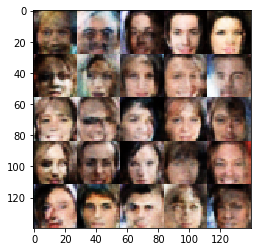

Epoch 3/5... Discriminator Loss: 0.0421... Generator Loss: 5.3775
Epoch 3/5... Discriminator Loss: 0.4188... Generator Loss: 1.7249
Epoch 3/5... Discriminator Loss: 0.0508... Generator Loss: 6.1082
Epoch 3/5... Discriminator Loss: 0.1732... Generator Loss: 2.5475
Epoch 3/5... Discriminator Loss: 0.3525... Generator Loss: 1.5763
Epoch 3/5... Discriminator Loss: 0.1293... Generator Loss: 2.6807
Epoch 3/5... Discriminator Loss: 0.2177... Generator Loss: 2.1851
Epoch 3/5... Discriminator Loss: 0.1185... Generator Loss: 3.2779
Epoch 3/5... Discriminator Loss: 0.0732... Generator Loss: 3.4643
Epoch 3/5... Discriminator Loss: 0.0693... Generator Loss: 4.9623


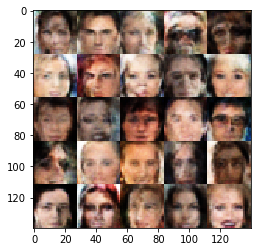

Epoch 3/5... Discriminator Loss: 0.0707... Generator Loss: 4.0282
Epoch 3/5... Discriminator Loss: 0.0226... Generator Loss: 5.4204
Epoch 3/5... Discriminator Loss: 0.0644... Generator Loss: 4.6773
Epoch 3/5... Discriminator Loss: 0.0867... Generator Loss: 3.3935
Epoch 3/5... Discriminator Loss: 0.0152... Generator Loss: 5.3864
Epoch 3/5... Discriminator Loss: 2.3331... Generator Loss: 0.2055
Epoch 3/5... Discriminator Loss: 0.6986... Generator Loss: 1.0239
Epoch 3/5... Discriminator Loss: 0.5094... Generator Loss: 2.4360
Epoch 3/5... Discriminator Loss: 0.3155... Generator Loss: 2.5648
Epoch 3/5... Discriminator Loss: 0.2049... Generator Loss: 2.6940


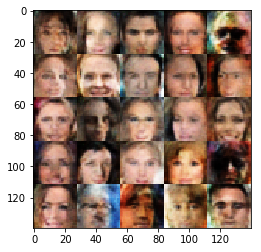

Epoch 3/5... Discriminator Loss: 0.1422... Generator Loss: 2.7536
Epoch 3/5... Discriminator Loss: 0.0708... Generator Loss: 4.4825
Epoch 3/5... Discriminator Loss: 0.5530... Generator Loss: 1.2798
Epoch 3/5... Discriminator Loss: 0.5728... Generator Loss: 1.3071
Epoch 3/5... Discriminator Loss: 0.2718... Generator Loss: 1.9206
Epoch 3/5... Discriminator Loss: 0.4072... Generator Loss: 1.6762
Epoch 3/5... Discriminator Loss: 0.3332... Generator Loss: 1.7357
Epoch 3/5... Discriminator Loss: 0.1622... Generator Loss: 2.7707
Epoch 3/5... Discriminator Loss: 0.3750... Generator Loss: 1.6154
Epoch 3/5... Discriminator Loss: 0.0609... Generator Loss: 4.2307


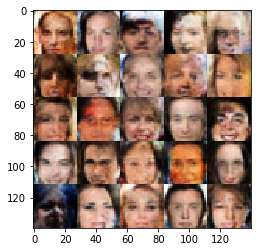

Epoch 3/5... Discriminator Loss: 0.5964... Generator Loss: 1.1037
Epoch 3/5... Discriminator Loss: 0.1489... Generator Loss: 2.4039
Epoch 3/5... Discriminator Loss: 0.2527... Generator Loss: 2.4158
Epoch 3/5... Discriminator Loss: 0.9057... Generator Loss: 0.8982
Epoch 3/5... Discriminator Loss: 0.9083... Generator Loss: 0.7830
Epoch 3/5... Discriminator Loss: 1.0635... Generator Loss: 0.5763
Epoch 3/5... Discriminator Loss: 0.3696... Generator Loss: 1.6841
Epoch 3/5... Discriminator Loss: 0.1982... Generator Loss: 2.6517
Epoch 3/5... Discriminator Loss: 0.0770... Generator Loss: 5.8565
Epoch 3/5... Discriminator Loss: 0.9093... Generator Loss: 0.7831


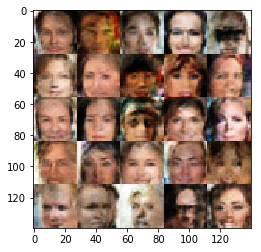

Epoch 3/5... Discriminator Loss: 0.3498... Generator Loss: 2.0313
Epoch 3/5... Discriminator Loss: 0.0686... Generator Loss: 4.6006
Epoch 3/5... Discriminator Loss: 0.1908... Generator Loss: 2.3173
Epoch 3/5... Discriminator Loss: 0.0382... Generator Loss: 4.3831
Epoch 3/5... Discriminator Loss: 0.0597... Generator Loss: 4.8870
Epoch 3/5... Discriminator Loss: 0.2241... Generator Loss: 2.0706
Epoch 3/5... Discriminator Loss: 0.0833... Generator Loss: 5.8508
Epoch 3/5... Discriminator Loss: 0.0799... Generator Loss: 3.5212
Epoch 3/5... Discriminator Loss: 0.0464... Generator Loss: 4.7758
Epoch 3/5... Discriminator Loss: 0.0973... Generator Loss: 4.7177


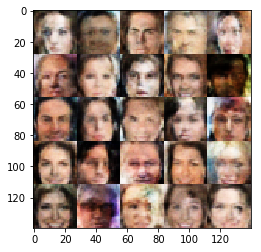

Epoch 3/5... Discriminator Loss: 0.3043... Generator Loss: 1.7769
Epoch 3/5... Discriminator Loss: 0.2038... Generator Loss: 2.2012
Epoch 3/5... Discriminator Loss: 0.0676... Generator Loss: 3.5065
Epoch 3/5... Discriminator Loss: 0.0269... Generator Loss: 5.7682
Epoch 3/5... Discriminator Loss: 0.0487... Generator Loss: 4.5792
Epoch 3/5... Discriminator Loss: 1.2800... Generator Loss: 4.2932
Epoch 3/5... Discriminator Loss: 0.1274... Generator Loss: 2.8993
Epoch 3/5... Discriminator Loss: 0.5370... Generator Loss: 1.1542
Epoch 3/5... Discriminator Loss: 0.1556... Generator Loss: 3.8870
Epoch 3/5... Discriminator Loss: 0.1133... Generator Loss: 2.7915


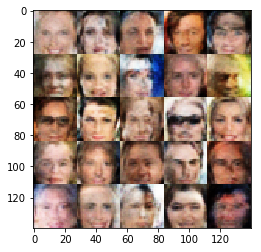

Epoch 3/5... Discriminator Loss: 0.1999... Generator Loss: 2.1882
Epoch 3/5... Discriminator Loss: 0.2537... Generator Loss: 1.9911
Epoch 3/5... Discriminator Loss: 0.3975... Generator Loss: 1.5580
Epoch 3/5... Discriminator Loss: 0.4885... Generator Loss: 1.2896
Epoch 3/5... Discriminator Loss: 0.0734... Generator Loss: 4.3383
Epoch 3/5... Discriminator Loss: 0.0478... Generator Loss: 3.6051
Epoch 3/5... Discriminator Loss: 0.1132... Generator Loss: 2.9782
Epoch 3/5... Discriminator Loss: 0.0809... Generator Loss: 3.6811
Epoch 3/5... Discriminator Loss: 0.0618... Generator Loss: 5.2457
Epoch 3/5... Discriminator Loss: 0.0542... Generator Loss: 4.7050


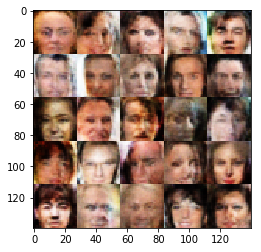

Epoch 3/5... Discriminator Loss: 0.0616... Generator Loss: 5.2249
Epoch 3/5... Discriminator Loss: 0.1946... Generator Loss: 2.3037
Epoch 3/5... Discriminator Loss: 0.0539... Generator Loss: 4.5900
Epoch 3/5... Discriminator Loss: 0.3421... Generator Loss: 1.6316
Epoch 3/5... Discriminator Loss: 0.2337... Generator Loss: 2.3356
Epoch 3/5... Discriminator Loss: 0.2047... Generator Loss: 2.3361
Epoch 3/5... Discriminator Loss: 0.0416... Generator Loss: 4.8766
Epoch 3/5... Discriminator Loss: 0.1084... Generator Loss: 2.8528
Epoch 3/5... Discriminator Loss: 0.0345... Generator Loss: 4.1676
Epoch 3/5... Discriminator Loss: 0.0552... Generator Loss: 5.5111


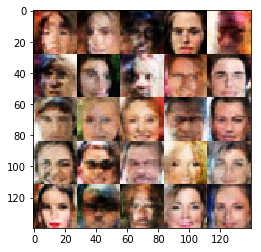

Epoch 3/5... Discriminator Loss: 0.1833... Generator Loss: 2.3122
Epoch 3/5... Discriminator Loss: 0.0393... Generator Loss: 4.2302
Epoch 3/5... Discriminator Loss: 0.3159... Generator Loss: 1.7274
Epoch 3/5... Discriminator Loss: 0.9265... Generator Loss: 0.6957
Epoch 3/5... Discriminator Loss: 0.1542... Generator Loss: 2.3732
Epoch 3/5... Discriminator Loss: 0.0714... Generator Loss: 3.3349
Epoch 3/5... Discriminator Loss: 0.0147... Generator Loss: 7.7122
Epoch 3/5... Discriminator Loss: 0.0717... Generator Loss: 3.8753
Epoch 3/5... Discriminator Loss: 0.1285... Generator Loss: 2.7185
Epoch 3/5... Discriminator Loss: 2.7630... Generator Loss: 1.1832


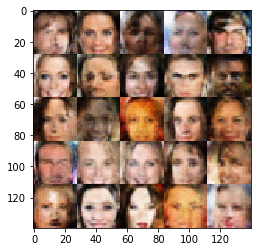

Epoch 3/5... Discriminator Loss: 1.9220... Generator Loss: 2.7636
Epoch 3/5... Discriminator Loss: 1.1615... Generator Loss: 0.9416
Epoch 3/5... Discriminator Loss: 1.0643... Generator Loss: 0.8087
Epoch 3/5... Discriminator Loss: 1.0843... Generator Loss: 0.7302
Epoch 3/5... Discriminator Loss: 1.1051... Generator Loss: 2.9099
Epoch 3/5... Discriminator Loss: 0.6740... Generator Loss: 1.9031
Epoch 3/5... Discriminator Loss: 0.8215... Generator Loss: 2.4401
Epoch 3/5... Discriminator Loss: 0.4020... Generator Loss: 2.0728
Epoch 3/5... Discriminator Loss: 0.6922... Generator Loss: 3.2564
Epoch 3/5... Discriminator Loss: 0.2789... Generator Loss: 2.1617


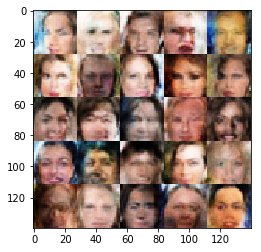

Epoch 3/5... Discriminator Loss: 0.1733... Generator Loss: 3.7732
Epoch 3/5... Discriminator Loss: 0.2179... Generator Loss: 2.6559
Epoch 3/5... Discriminator Loss: 0.7454... Generator Loss: 0.8761
Epoch 3/5... Discriminator Loss: 0.8795... Generator Loss: 4.1874
Epoch 3/5... Discriminator Loss: 0.4413... Generator Loss: 1.6857
Epoch 3/5... Discriminator Loss: 0.3004... Generator Loss: 2.7866
Epoch 3/5... Discriminator Loss: 0.4119... Generator Loss: 1.7585
Epoch 3/5... Discriminator Loss: 0.2956... Generator Loss: 2.5476
Epoch 3/5... Discriminator Loss: 0.1126... Generator Loss: 3.0030
Epoch 3/5... Discriminator Loss: 0.1668... Generator Loss: 2.6202


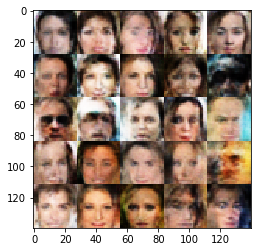

Epoch 3/5... Discriminator Loss: 0.1544... Generator Loss: 2.5033
Epoch 3/5... Discriminator Loss: 0.1869... Generator Loss: 2.4634
Epoch 3/5... Discriminator Loss: 0.1191... Generator Loss: 3.7390
Epoch 3/5... Discriminator Loss: 0.1558... Generator Loss: 2.3785
Epoch 3/5... Discriminator Loss: 0.1993... Generator Loss: 3.3622
Epoch 3/5... Discriminator Loss: 0.1527... Generator Loss: 3.4012
Epoch 3/5... Discriminator Loss: 0.1175... Generator Loss: 3.2251
Epoch 3/5... Discriminator Loss: 0.1289... Generator Loss: 2.7873
Epoch 3/5... Discriminator Loss: 0.4811... Generator Loss: 1.3852
Epoch 4/5... Discriminator Loss: 0.2420... Generator Loss: 2.0705


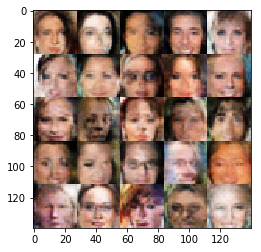

Epoch 4/5... Discriminator Loss: 0.0784... Generator Loss: 3.6715
Epoch 4/5... Discriminator Loss: 0.1521... Generator Loss: 2.4686
Epoch 4/5... Discriminator Loss: 1.6463... Generator Loss: 0.7976
Epoch 4/5... Discriminator Loss: 0.8921... Generator Loss: 1.3484
Epoch 4/5... Discriminator Loss: 0.6650... Generator Loss: 1.2760
Epoch 4/5... Discriminator Loss: 0.4780... Generator Loss: 1.4921
Epoch 4/5... Discriminator Loss: 1.2556... Generator Loss: 0.5315
Epoch 4/5... Discriminator Loss: 0.1788... Generator Loss: 2.6103
Epoch 4/5... Discriminator Loss: 0.5278... Generator Loss: 1.3779
Epoch 4/5... Discriminator Loss: 1.0672... Generator Loss: 0.6391


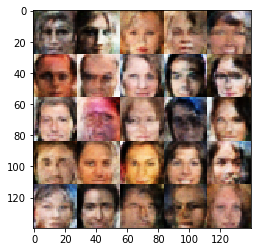

Epoch 4/5... Discriminator Loss: 0.3341... Generator Loss: 2.9345
Epoch 4/5... Discriminator Loss: 0.2267... Generator Loss: 2.0925
Epoch 4/5... Discriminator Loss: 0.1019... Generator Loss: 4.2146
Epoch 4/5... Discriminator Loss: 0.1441... Generator Loss: 2.5745
Epoch 4/5... Discriminator Loss: 0.2008... Generator Loss: 2.3039
Epoch 4/5... Discriminator Loss: 0.1657... Generator Loss: 2.3887
Epoch 4/5... Discriminator Loss: 0.1635... Generator Loss: 3.6176
Epoch 4/5... Discriminator Loss: 0.2980... Generator Loss: 1.6761
Epoch 4/5... Discriminator Loss: 0.1643... Generator Loss: 2.3433
Epoch 4/5... Discriminator Loss: 0.8806... Generator Loss: 0.7410


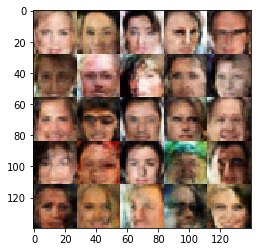

Epoch 4/5... Discriminator Loss: 0.4560... Generator Loss: 1.5361
Epoch 4/5... Discriminator Loss: 0.5139... Generator Loss: 1.1824
Epoch 4/5... Discriminator Loss: 0.4083... Generator Loss: 1.5083
Epoch 4/5... Discriminator Loss: 0.3149... Generator Loss: 1.7457
Epoch 4/5... Discriminator Loss: 0.1320... Generator Loss: 2.8024
Epoch 4/5... Discriminator Loss: 0.3348... Generator Loss: 1.6068
Epoch 4/5... Discriminator Loss: 0.2135... Generator Loss: 2.1009
Epoch 4/5... Discriminator Loss: 0.2620... Generator Loss: 1.8635
Epoch 4/5... Discriminator Loss: 0.1402... Generator Loss: 2.8823
Epoch 4/5... Discriminator Loss: 0.1945... Generator Loss: 2.4990


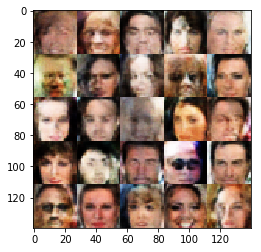

Epoch 4/5... Discriminator Loss: 0.0497... Generator Loss: 4.6554
Epoch 4/5... Discriminator Loss: 0.4012... Generator Loss: 1.4555
Epoch 4/5... Discriminator Loss: 0.3020... Generator Loss: 1.6615
Epoch 4/5... Discriminator Loss: 0.1729... Generator Loss: 2.3758
Epoch 4/5... Discriminator Loss: 0.1764... Generator Loss: 2.4059
Epoch 4/5... Discriminator Loss: 0.3367... Generator Loss: 1.5596
Epoch 4/5... Discriminator Loss: 0.1647... Generator Loss: 2.3496
Epoch 4/5... Discriminator Loss: 0.0209... Generator Loss: 6.4429
Epoch 4/5... Discriminator Loss: 1.1324... Generator Loss: 0.4976
Epoch 4/5... Discriminator Loss: 2.1754... Generator Loss: 3.7762


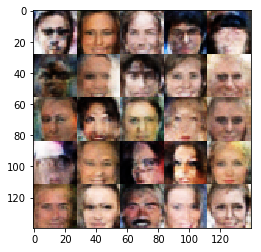

Epoch 4/5... Discriminator Loss: 1.1393... Generator Loss: 3.0250
Epoch 4/5... Discriminator Loss: 0.4665... Generator Loss: 1.4703
Epoch 4/5... Discriminator Loss: 0.2358... Generator Loss: 2.6261
Epoch 4/5... Discriminator Loss: 0.2376... Generator Loss: 2.3015
Epoch 4/5... Discriminator Loss: 0.1049... Generator Loss: 4.0097
Epoch 4/5... Discriminator Loss: 1.0937... Generator Loss: 0.6001
Epoch 4/5... Discriminator Loss: 0.1528... Generator Loss: 2.9123
Epoch 4/5... Discriminator Loss: 0.3770... Generator Loss: 1.7649
Epoch 4/5... Discriminator Loss: 0.1351... Generator Loss: 3.2283
Epoch 4/5... Discriminator Loss: 0.0331... Generator Loss: 6.1649


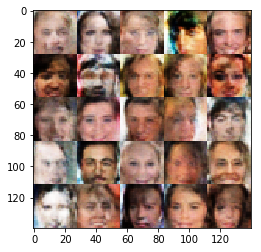

Epoch 4/5... Discriminator Loss: 0.3709... Generator Loss: 1.6572
Epoch 4/5... Discriminator Loss: 0.6145... Generator Loss: 1.0696
Epoch 4/5... Discriminator Loss: 0.1133... Generator Loss: 3.0748
Epoch 4/5... Discriminator Loss: 0.1066... Generator Loss: 3.1235
Epoch 4/5... Discriminator Loss: 0.1354... Generator Loss: 3.3176
Epoch 4/5... Discriminator Loss: 0.1118... Generator Loss: 2.7114
Epoch 4/5... Discriminator Loss: 0.0619... Generator Loss: 4.0929
Epoch 4/5... Discriminator Loss: 0.6389... Generator Loss: 0.9891
Epoch 4/5... Discriminator Loss: 0.0700... Generator Loss: 3.7655
Epoch 4/5... Discriminator Loss: 0.1442... Generator Loss: 2.5782


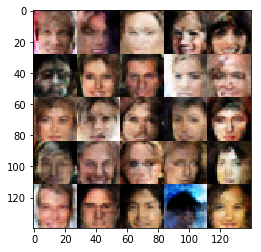

Epoch 4/5... Discriminator Loss: 0.0321... Generator Loss: 4.9067
Epoch 4/5... Discriminator Loss: 0.0541... Generator Loss: 5.2208
Epoch 4/5... Discriminator Loss: 0.3776... Generator Loss: 1.5928
Epoch 4/5... Discriminator Loss: 0.3841... Generator Loss: 1.4318
Epoch 4/5... Discriminator Loss: 0.1025... Generator Loss: 3.0857
Epoch 4/5... Discriminator Loss: 0.1172... Generator Loss: 5.6622
Epoch 4/5... Discriminator Loss: 0.5285... Generator Loss: 1.3608
Epoch 4/5... Discriminator Loss: 0.0412... Generator Loss: 4.5094
Epoch 4/5... Discriminator Loss: 0.6143... Generator Loss: 1.0462
Epoch 4/5... Discriminator Loss: 1.1471... Generator Loss: 1.9051


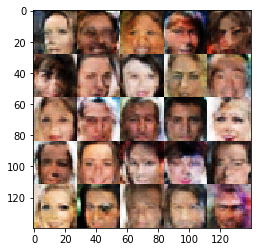

Epoch 4/5... Discriminator Loss: 0.7521... Generator Loss: 1.1749
Epoch 4/5... Discriminator Loss: 1.1151... Generator Loss: 4.3091
Epoch 4/5... Discriminator Loss: 1.2117... Generator Loss: 0.6489
Epoch 4/5... Discriminator Loss: 0.3665... Generator Loss: 1.6049
Epoch 4/5... Discriminator Loss: 1.0874... Generator Loss: 0.6656
Epoch 4/5... Discriminator Loss: 0.3970... Generator Loss: 1.4299
Epoch 4/5... Discriminator Loss: 1.4021... Generator Loss: 0.4730
Epoch 4/5... Discriminator Loss: 0.1123... Generator Loss: 3.4359
Epoch 4/5... Discriminator Loss: 0.1009... Generator Loss: 3.5382
Epoch 4/5... Discriminator Loss: 0.1644... Generator Loss: 2.6995


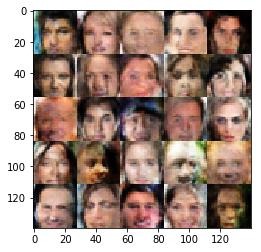

Epoch 4/5... Discriminator Loss: 0.0447... Generator Loss: 5.9306
Epoch 4/5... Discriminator Loss: 0.1740... Generator Loss: 2.9698
Epoch 4/5... Discriminator Loss: 0.3188... Generator Loss: 1.7042
Epoch 4/5... Discriminator Loss: 4.3293... Generator Loss: 0.0326
Epoch 4/5... Discriminator Loss: 1.0107... Generator Loss: 0.9990
Epoch 4/5... Discriminator Loss: 0.3487... Generator Loss: 2.0657
Epoch 4/5... Discriminator Loss: 1.1026... Generator Loss: 0.6273
Epoch 4/5... Discriminator Loss: 0.2302... Generator Loss: 2.2465
Epoch 4/5... Discriminator Loss: 0.3268... Generator Loss: 1.8411
Epoch 4/5... Discriminator Loss: 0.5025... Generator Loss: 1.2476


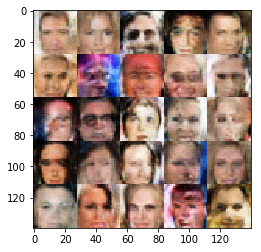

Epoch 4/5... Discriminator Loss: 0.0784... Generator Loss: 3.7984
Epoch 4/5... Discriminator Loss: 0.1742... Generator Loss: 2.5558
Epoch 4/5... Discriminator Loss: 0.2376... Generator Loss: 2.0109
Epoch 4/5... Discriminator Loss: 0.1558... Generator Loss: 2.8209
Epoch 4/5... Discriminator Loss: 1.0950... Generator Loss: 0.6077
Epoch 4/5... Discriminator Loss: 0.2505... Generator Loss: 1.8686
Epoch 4/5... Discriminator Loss: 0.1290... Generator Loss: 5.5384
Epoch 4/5... Discriminator Loss: 0.1815... Generator Loss: 2.3849
Epoch 4/5... Discriminator Loss: 0.0512... Generator Loss: 4.1384
Epoch 4/5... Discriminator Loss: 0.1784... Generator Loss: 2.4912


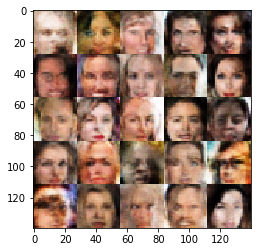

Epoch 4/5... Discriminator Loss: 0.3954... Generator Loss: 1.3967
Epoch 4/5... Discriminator Loss: 0.0386... Generator Loss: 4.4488
Epoch 4/5... Discriminator Loss: 0.0757... Generator Loss: 3.6273
Epoch 4/5... Discriminator Loss: 0.1427... Generator Loss: 2.6195
Epoch 4/5... Discriminator Loss: 0.1381... Generator Loss: 2.6509
Epoch 4/5... Discriminator Loss: 0.2288... Generator Loss: 2.3552
Epoch 4/5... Discriminator Loss: 0.2359... Generator Loss: 1.9712
Epoch 4/5... Discriminator Loss: 0.2219... Generator Loss: 1.9772
Epoch 4/5... Discriminator Loss: 0.1454... Generator Loss: 2.4925
Epoch 4/5... Discriminator Loss: 0.0225... Generator Loss: 5.0126


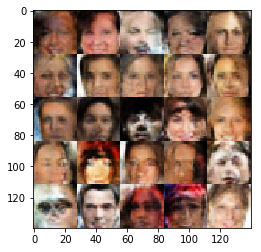

Epoch 4/5... Discriminator Loss: 1.2002... Generator Loss: 0.5118
Epoch 4/5... Discriminator Loss: 0.3311... Generator Loss: 1.6216
Epoch 4/5... Discriminator Loss: 1.8512... Generator Loss: 3.4453
Epoch 4/5... Discriminator Loss: 0.6086... Generator Loss: 1.4318
Epoch 4/5... Discriminator Loss: 0.5146... Generator Loss: 1.3734
Epoch 4/5... Discriminator Loss: 0.4425... Generator Loss: 1.4411
Epoch 4/5... Discriminator Loss: 1.0463... Generator Loss: 0.7039
Epoch 4/5... Discriminator Loss: 0.3554... Generator Loss: 1.8823
Epoch 4/5... Discriminator Loss: 0.8741... Generator Loss: 0.9230
Epoch 4/5... Discriminator Loss: 0.4288... Generator Loss: 1.5977


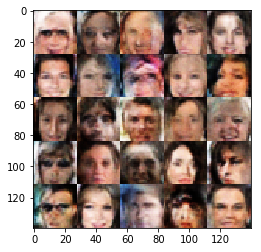

Epoch 4/5... Discriminator Loss: 0.4735... Generator Loss: 1.3867
Epoch 4/5... Discriminator Loss: 0.0794... Generator Loss: 5.0137
Epoch 4/5... Discriminator Loss: 0.2429... Generator Loss: 1.9625
Epoch 4/5... Discriminator Loss: 0.1748... Generator Loss: 2.8693
Epoch 4/5... Discriminator Loss: 0.1858... Generator Loss: 2.5138
Epoch 4/5... Discriminator Loss: 0.8240... Generator Loss: 0.8899
Epoch 4/5... Discriminator Loss: 0.3050... Generator Loss: 1.8547
Epoch 4/5... Discriminator Loss: 0.9280... Generator Loss: 0.7561
Epoch 4/5... Discriminator Loss: 0.6665... Generator Loss: 1.0782
Epoch 4/5... Discriminator Loss: 0.2718... Generator Loss: 3.7361


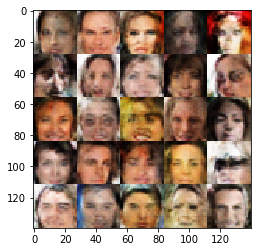

Epoch 4/5... Discriminator Loss: 0.1271... Generator Loss: 3.7498
Epoch 4/5... Discriminator Loss: 0.1034... Generator Loss: 3.0268
Epoch 4/5... Discriminator Loss: 0.0724... Generator Loss: 3.6810
Epoch 4/5... Discriminator Loss: 0.3644... Generator Loss: 1.6036
Epoch 4/5... Discriminator Loss: 0.5794... Generator Loss: 4.7596
Epoch 4/5... Discriminator Loss: 0.2871... Generator Loss: 3.0331
Epoch 4/5... Discriminator Loss: 0.2503... Generator Loss: 2.0454
Epoch 4/5... Discriminator Loss: 0.1012... Generator Loss: 3.0206
Epoch 4/5... Discriminator Loss: 0.0522... Generator Loss: 4.5466
Epoch 4/5... Discriminator Loss: 6.9308... Generator Loss: 0.0025


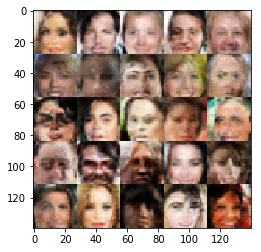

Epoch 4/5... Discriminator Loss: 0.6738... Generator Loss: 1.0705
Epoch 4/5... Discriminator Loss: 1.2899... Generator Loss: 0.4465
Epoch 4/5... Discriminator Loss: 0.4956... Generator Loss: 1.5001
Epoch 4/5... Discriminator Loss: 0.9629... Generator Loss: 0.7898
Epoch 4/5... Discriminator Loss: 0.0671... Generator Loss: 3.8024
Epoch 4/5... Discriminator Loss: 1.4464... Generator Loss: 6.1967
Epoch 4/5... Discriminator Loss: 0.6054... Generator Loss: 2.6449
Epoch 4/5... Discriminator Loss: 0.5668... Generator Loss: 1.2891
Epoch 4/5... Discriminator Loss: 0.2016... Generator Loss: 2.4683
Epoch 4/5... Discriminator Loss: 0.4428... Generator Loss: 1.4625


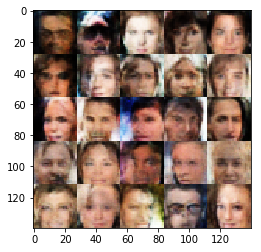

Epoch 4/5... Discriminator Loss: 0.1635... Generator Loss: 2.5617
Epoch 4/5... Discriminator Loss: 0.1835... Generator Loss: 3.4414
Epoch 4/5... Discriminator Loss: 0.3021... Generator Loss: 1.8629
Epoch 4/5... Discriminator Loss: 0.2565... Generator Loss: 2.1324
Epoch 4/5... Discriminator Loss: 0.1226... Generator Loss: 3.9776
Epoch 4/5... Discriminator Loss: 0.2456... Generator Loss: 2.0761
Epoch 4/5... Discriminator Loss: 0.3169... Generator Loss: 3.7054
Epoch 4/5... Discriminator Loss: 1.5285... Generator Loss: 0.3934
Epoch 4/5... Discriminator Loss: 0.2320... Generator Loss: 2.0703
Epoch 4/5... Discriminator Loss: 0.4917... Generator Loss: 1.2100


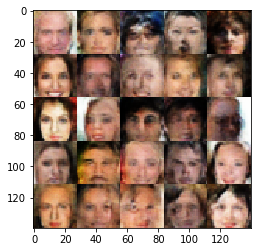

Epoch 4/5... Discriminator Loss: 0.2034... Generator Loss: 2.7628
Epoch 4/5... Discriminator Loss: 0.1290... Generator Loss: 2.7565
Epoch 4/5... Discriminator Loss: 0.0687... Generator Loss: 3.8103
Epoch 4/5... Discriminator Loss: 0.1864... Generator Loss: 2.1845
Epoch 4/5... Discriminator Loss: 0.1636... Generator Loss: 2.5736
Epoch 4/5... Discriminator Loss: 0.5915... Generator Loss: 1.0647
Epoch 4/5... Discriminator Loss: 0.1685... Generator Loss: 3.1129
Epoch 4/5... Discriminator Loss: 0.0948... Generator Loss: 3.1123
Epoch 4/5... Discriminator Loss: 0.1207... Generator Loss: 2.7410
Epoch 4/5... Discriminator Loss: 0.2240... Generator Loss: 2.3649


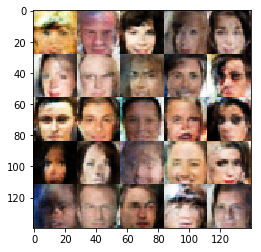

Epoch 4/5... Discriminator Loss: 0.9883... Generator Loss: 0.6678
Epoch 4/5... Discriminator Loss: 0.1102... Generator Loss: 2.9780
Epoch 4/5... Discriminator Loss: 0.1723... Generator Loss: 2.3723
Epoch 4/5... Discriminator Loss: 0.2936... Generator Loss: 1.9622
Epoch 4/5... Discriminator Loss: 0.0917... Generator Loss: 2.9852
Epoch 4/5... Discriminator Loss: 0.1036... Generator Loss: 3.0045
Epoch 4/5... Discriminator Loss: 0.1170... Generator Loss: 3.4666
Epoch 4/5... Discriminator Loss: 0.2929... Generator Loss: 1.8273
Epoch 4/5... Discriminator Loss: 0.1854... Generator Loss: 2.3677
Epoch 4/5... Discriminator Loss: 0.1503... Generator Loss: 2.5800


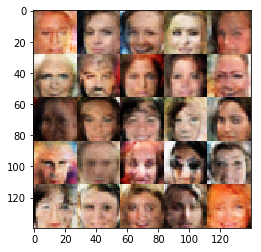

Epoch 4/5... Discriminator Loss: 0.0487... Generator Loss: 5.0424
Epoch 4/5... Discriminator Loss: 0.5395... Generator Loss: 1.2211
Epoch 4/5... Discriminator Loss: 0.2249... Generator Loss: 2.1927
Epoch 4/5... Discriminator Loss: 0.2639... Generator Loss: 1.9531
Epoch 4/5... Discriminator Loss: 0.3539... Generator Loss: 1.6703
Epoch 4/5... Discriminator Loss: 0.1971... Generator Loss: 2.0973
Epoch 4/5... Discriminator Loss: 0.0804... Generator Loss: 3.0965
Epoch 4/5... Discriminator Loss: 0.3917... Generator Loss: 1.5491
Epoch 4/5... Discriminator Loss: 0.0437... Generator Loss: 5.3516
Epoch 4/5... Discriminator Loss: 0.1238... Generator Loss: 2.8615


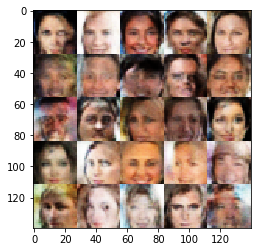

Epoch 4/5... Discriminator Loss: 0.2300... Generator Loss: 2.1221
Epoch 4/5... Discriminator Loss: 0.1250... Generator Loss: 4.3745
Epoch 4/5... Discriminator Loss: 0.0709... Generator Loss: 3.7065
Epoch 4/5... Discriminator Loss: 0.7565... Generator Loss: 0.8979
Epoch 4/5... Discriminator Loss: 0.0304... Generator Loss: 4.5624
Epoch 4/5... Discriminator Loss: 0.0272... Generator Loss: 5.1898
Epoch 4/5... Discriminator Loss: 0.0879... Generator Loss: 3.1423
Epoch 4/5... Discriminator Loss: 0.0907... Generator Loss: 2.9777
Epoch 4/5... Discriminator Loss: 0.3886... Generator Loss: 1.7475
Epoch 4/5... Discriminator Loss: 0.0670... Generator Loss: 3.5268


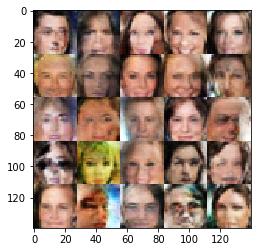

Epoch 4/5... Discriminator Loss: 0.0692... Generator Loss: 3.6958
Epoch 4/5... Discriminator Loss: 0.1025... Generator Loss: 2.8336
Epoch 4/5... Discriminator Loss: 0.2752... Generator Loss: 1.7620
Epoch 4/5... Discriminator Loss: 0.3845... Generator Loss: 1.4734
Epoch 4/5... Discriminator Loss: 0.7083... Generator Loss: 1.0900
Epoch 4/5... Discriminator Loss: 2.8681... Generator Loss: 0.1612
Epoch 4/5... Discriminator Loss: 0.4800... Generator Loss: 1.7596
Epoch 4/5... Discriminator Loss: 0.4876... Generator Loss: 1.8777
Epoch 4/5... Discriminator Loss: 0.7237... Generator Loss: 1.0546
Epoch 4/5... Discriminator Loss: 0.7596... Generator Loss: 3.6780


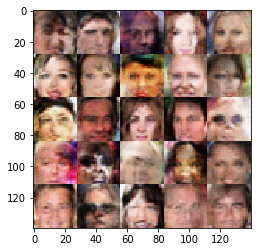

Epoch 4/5... Discriminator Loss: 0.5565... Generator Loss: 1.3152
Epoch 4/5... Discriminator Loss: 0.1982... Generator Loss: 3.4712
Epoch 4/5... Discriminator Loss: 0.3542... Generator Loss: 2.1027
Epoch 4/5... Discriminator Loss: 0.6304... Generator Loss: 1.2148
Epoch 4/5... Discriminator Loss: 0.9966... Generator Loss: 0.6988
Epoch 4/5... Discriminator Loss: 0.1145... Generator Loss: 3.1921
Epoch 4/5... Discriminator Loss: 0.3244... Generator Loss: 1.7077
Epoch 4/5... Discriminator Loss: 0.2011... Generator Loss: 2.5980
Epoch 4/5... Discriminator Loss: 0.2767... Generator Loss: 1.7341
Epoch 4/5... Discriminator Loss: 0.3462... Generator Loss: 1.5432


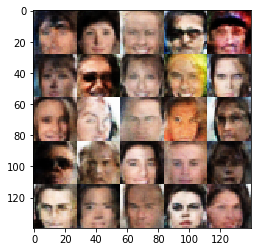

Epoch 4/5... Discriminator Loss: 0.0758... Generator Loss: 3.5987
Epoch 4/5... Discriminator Loss: 0.4393... Generator Loss: 1.4701
Epoch 4/5... Discriminator Loss: 0.1528... Generator Loss: 2.5695
Epoch 4/5... Discriminator Loss: 1.1359... Generator Loss: 0.5692
Epoch 4/5... Discriminator Loss: 0.2691... Generator Loss: 2.4553
Epoch 4/5... Discriminator Loss: 0.0792... Generator Loss: 4.6358
Epoch 4/5... Discriminator Loss: 0.0739... Generator Loss: 5.9122
Epoch 4/5... Discriminator Loss: 0.3417... Generator Loss: 1.5569
Epoch 4/5... Discriminator Loss: 0.8313... Generator Loss: 3.5709
Epoch 4/5... Discriminator Loss: 0.2891... Generator Loss: 2.0210


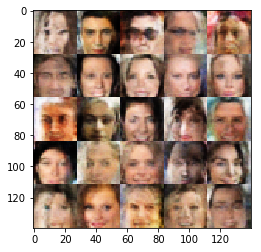

Epoch 4/5... Discriminator Loss: 0.2309... Generator Loss: 4.5478
Epoch 4/5... Discriminator Loss: 0.2017... Generator Loss: 2.3406
Epoch 4/5... Discriminator Loss: 0.2137... Generator Loss: 2.2928
Epoch 4/5... Discriminator Loss: 0.1077... Generator Loss: 3.0588
Epoch 4/5... Discriminator Loss: 0.2572... Generator Loss: 2.0186
Epoch 4/5... Discriminator Loss: 0.2999... Generator Loss: 1.6351
Epoch 4/5... Discriminator Loss: 0.1741... Generator Loss: 4.5861
Epoch 4/5... Discriminator Loss: 0.1458... Generator Loss: 5.0144
Epoch 4/5... Discriminator Loss: 0.2769... Generator Loss: 1.9647
Epoch 4/5... Discriminator Loss: 0.0727... Generator Loss: 3.3702


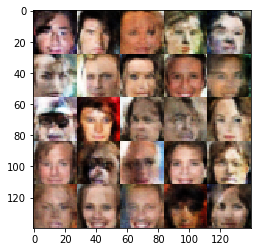

Epoch 4/5... Discriminator Loss: 0.3374... Generator Loss: 1.8381
Epoch 4/5... Discriminator Loss: 0.2236... Generator Loss: 2.0087
Epoch 4/5... Discriminator Loss: 0.1007... Generator Loss: 2.9691
Epoch 4/5... Discriminator Loss: 0.1775... Generator Loss: 2.5307
Epoch 4/5... Discriminator Loss: 0.0903... Generator Loss: 6.7023
Epoch 4/5... Discriminator Loss: 0.1860... Generator Loss: 2.4597
Epoch 4/5... Discriminator Loss: 0.0821... Generator Loss: 3.5490
Epoch 4/5... Discriminator Loss: 0.4267... Generator Loss: 1.4496
Epoch 4/5... Discriminator Loss: 0.5748... Generator Loss: 1.1899
Epoch 4/5... Discriminator Loss: 0.1223... Generator Loss: 2.9896


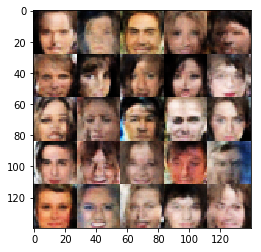

Epoch 4/5... Discriminator Loss: 0.1044... Generator Loss: 3.1718
Epoch 4/5... Discriminator Loss: 0.1645... Generator Loss: 2.3799
Epoch 4/5... Discriminator Loss: 0.1682... Generator Loss: 2.6023
Epoch 4/5... Discriminator Loss: 0.0486... Generator Loss: 4.2632
Epoch 4/5... Discriminator Loss: 0.7987... Generator Loss: 1.0134
Epoch 4/5... Discriminator Loss: 0.1618... Generator Loss: 2.4749
Epoch 4/5... Discriminator Loss: 0.1005... Generator Loss: 3.9572
Epoch 4/5... Discriminator Loss: 0.4984... Generator Loss: 1.2126
Epoch 4/5... Discriminator Loss: 1.1003... Generator Loss: 0.6416
Epoch 4/5... Discriminator Loss: 0.6334... Generator Loss: 1.4743


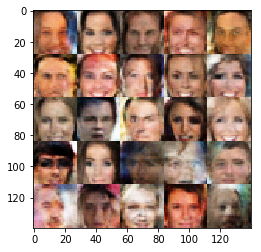

Epoch 4/5... Discriminator Loss: 0.3194... Generator Loss: 2.1463
Epoch 4/5... Discriminator Loss: 0.5352... Generator Loss: 1.1674
Epoch 4/5... Discriminator Loss: 0.2091... Generator Loss: 2.7882
Epoch 4/5... Discriminator Loss: 0.2313... Generator Loss: 2.5500
Epoch 4/5... Discriminator Loss: 1.7307... Generator Loss: 0.4418
Epoch 4/5... Discriminator Loss: 1.0408... Generator Loss: 0.7431
Epoch 4/5... Discriminator Loss: 0.2629... Generator Loss: 3.0656
Epoch 4/5... Discriminator Loss: 0.7386... Generator Loss: 0.9921
Epoch 4/5... Discriminator Loss: 0.0680... Generator Loss: 4.9353
Epoch 4/5... Discriminator Loss: 0.1513... Generator Loss: 4.3387


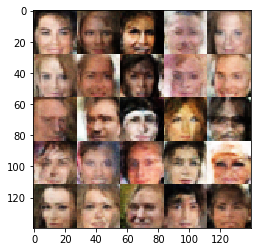

Epoch 4/5... Discriminator Loss: 0.2538... Generator Loss: 1.9483
Epoch 4/5... Discriminator Loss: 0.2983... Generator Loss: 1.7557
Epoch 4/5... Discriminator Loss: 0.1354... Generator Loss: 2.7685
Epoch 4/5... Discriminator Loss: 0.4323... Generator Loss: 1.3256
Epoch 4/5... Discriminator Loss: 0.0777... Generator Loss: 3.4062
Epoch 4/5... Discriminator Loss: 0.0993... Generator Loss: 3.0334
Epoch 4/5... Discriminator Loss: 0.3594... Generator Loss: 1.5938
Epoch 4/5... Discriminator Loss: 0.1684... Generator Loss: 2.2947
Epoch 4/5... Discriminator Loss: 0.4644... Generator Loss: 1.3462
Epoch 4/5... Discriminator Loss: 0.0442... Generator Loss: 4.2783


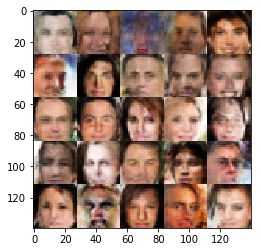

Epoch 4/5... Discriminator Loss: 0.0837... Generator Loss: 3.5626
Epoch 4/5... Discriminator Loss: 0.1347... Generator Loss: 2.7073
Epoch 4/5... Discriminator Loss: 0.5297... Generator Loss: 1.2384
Epoch 4/5... Discriminator Loss: 0.0730... Generator Loss: 3.6696
Epoch 4/5... Discriminator Loss: 0.0725... Generator Loss: 3.4823
Epoch 4/5... Discriminator Loss: 0.0341... Generator Loss: 5.6421
Epoch 4/5... Discriminator Loss: 0.6911... Generator Loss: 0.9996
Epoch 4/5... Discriminator Loss: 0.2304... Generator Loss: 1.9595
Epoch 4/5... Discriminator Loss: 0.2297... Generator Loss: 2.2382
Epoch 4/5... Discriminator Loss: 0.1659... Generator Loss: 2.2317


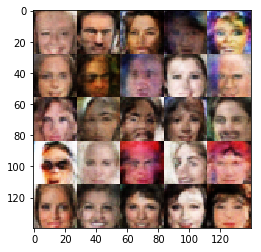

Epoch 4/5... Discriminator Loss: 0.3713... Generator Loss: 1.5968
Epoch 4/5... Discriminator Loss: 0.2192... Generator Loss: 2.0563
Epoch 4/5... Discriminator Loss: 0.7776... Generator Loss: 1.6838
Epoch 4/5... Discriminator Loss: 0.5577... Generator Loss: 2.2468
Epoch 4/5... Discriminator Loss: 0.2796... Generator Loss: 2.5767
Epoch 4/5... Discriminator Loss: 0.3048... Generator Loss: 2.0224
Epoch 4/5... Discriminator Loss: 0.4033... Generator Loss: 1.6115
Epoch 4/5... Discriminator Loss: 1.8120... Generator Loss: 0.4792
Epoch 4/5... Discriminator Loss: 0.6033... Generator Loss: 2.2797
Epoch 4/5... Discriminator Loss: 0.5578... Generator Loss: 2.2157


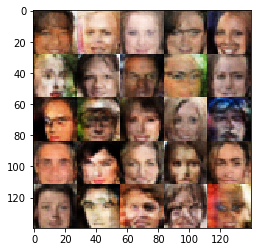

Epoch 4/5... Discriminator Loss: 0.2442... Generator Loss: 3.0680
Epoch 4/5... Discriminator Loss: 0.9454... Generator Loss: 0.7126
Epoch 4/5... Discriminator Loss: 0.3251... Generator Loss: 2.1389
Epoch 4/5... Discriminator Loss: 0.8634... Generator Loss: 0.8210
Epoch 4/5... Discriminator Loss: 0.4634... Generator Loss: 1.3314
Epoch 4/5... Discriminator Loss: 0.0706... Generator Loss: 3.7162
Epoch 4/5... Discriminator Loss: 0.1351... Generator Loss: 2.4993
Epoch 4/5... Discriminator Loss: 0.3275... Generator Loss: 1.7457
Epoch 4/5... Discriminator Loss: 0.1866... Generator Loss: 3.0663
Epoch 4/5... Discriminator Loss: 0.0897... Generator Loss: 3.1406


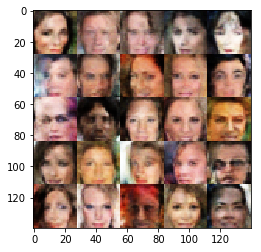

Epoch 4/5... Discriminator Loss: 0.3870... Generator Loss: 1.6073
Epoch 4/5... Discriminator Loss: 0.1553... Generator Loss: 2.7242
Epoch 4/5... Discriminator Loss: 0.2180... Generator Loss: 2.2434
Epoch 4/5... Discriminator Loss: 0.1288... Generator Loss: 2.6596
Epoch 4/5... Discriminator Loss: 0.0315... Generator Loss: 4.8541
Epoch 4/5... Discriminator Loss: 0.0707... Generator Loss: 3.3228
Epoch 5/5... Discriminator Loss: 0.3504... Generator Loss: 3.3574
Epoch 5/5... Discriminator Loss: 0.8462... Generator Loss: 1.6169
Epoch 5/5... Discriminator Loss: 1.0427... Generator Loss: 0.8151
Epoch 5/5... Discriminator Loss: 1.8462... Generator Loss: 0.4065


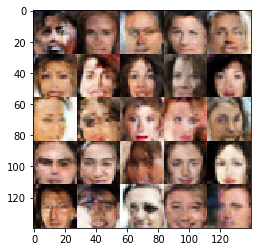

Epoch 5/5... Discriminator Loss: 0.2560... Generator Loss: 2.8127
Epoch 5/5... Discriminator Loss: 0.5914... Generator Loss: 4.3955
Epoch 5/5... Discriminator Loss: 0.7195... Generator Loss: 1.0117
Epoch 5/5... Discriminator Loss: 0.3343... Generator Loss: 2.3334
Epoch 5/5... Discriminator Loss: 0.3028... Generator Loss: 2.1394
Epoch 5/5... Discriminator Loss: 0.4919... Generator Loss: 1.3131
Epoch 5/5... Discriminator Loss: 0.0767... Generator Loss: 3.5508
Epoch 5/5... Discriminator Loss: 2.0546... Generator Loss: 5.3030
Epoch 5/5... Discriminator Loss: 0.2529... Generator Loss: 2.4535
Epoch 5/5... Discriminator Loss: 0.5634... Generator Loss: 1.2105


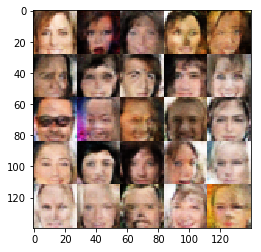

Epoch 5/5... Discriminator Loss: 0.0953... Generator Loss: 3.4018
Epoch 5/5... Discriminator Loss: 0.2023... Generator Loss: 2.0780
Epoch 5/5... Discriminator Loss: 0.4034... Generator Loss: 1.3850
Epoch 5/5... Discriminator Loss: 0.1427... Generator Loss: 4.1581
Epoch 5/5... Discriminator Loss: 0.0241... Generator Loss: 4.5906
Epoch 5/5... Discriminator Loss: 0.6319... Generator Loss: 0.9933
Epoch 5/5... Discriminator Loss: 1.9924... Generator Loss: 3.0168
Epoch 5/5... Discriminator Loss: 0.8844... Generator Loss: 0.8522
Epoch 5/5... Discriminator Loss: 0.6933... Generator Loss: 1.1467
Epoch 5/5... Discriminator Loss: 1.4646... Generator Loss: 0.4867


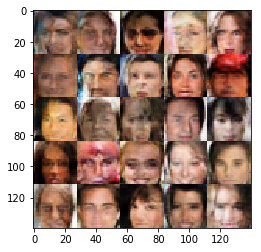

Epoch 5/5... Discriminator Loss: 0.7058... Generator Loss: 0.9932
Epoch 5/5... Discriminator Loss: 0.3032... Generator Loss: 1.9616
Epoch 5/5... Discriminator Loss: 0.3352... Generator Loss: 1.6756
Epoch 5/5... Discriminator Loss: 0.0797... Generator Loss: 3.7623
Epoch 5/5... Discriminator Loss: 0.4703... Generator Loss: 1.4318
Epoch 5/5... Discriminator Loss: 0.3649... Generator Loss: 1.5204
Epoch 5/5... Discriminator Loss: 0.1399... Generator Loss: 2.9479
Epoch 5/5... Discriminator Loss: 0.1412... Generator Loss: 2.7874
Epoch 5/5... Discriminator Loss: 0.0769... Generator Loss: 3.8802
Epoch 5/5... Discriminator Loss: 0.5454... Generator Loss: 1.1082


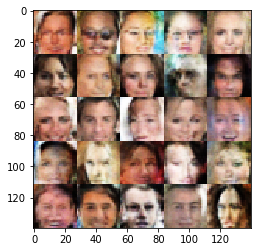

Epoch 5/5... Discriminator Loss: 0.2475... Generator Loss: 2.0248
Epoch 5/5... Discriminator Loss: 0.1105... Generator Loss: 2.9210
Epoch 5/5... Discriminator Loss: 0.0403... Generator Loss: 4.2939
Epoch 5/5... Discriminator Loss: 0.7921... Generator Loss: 0.8775
Epoch 5/5... Discriminator Loss: 0.4132... Generator Loss: 1.4686
Epoch 5/5... Discriminator Loss: 0.0484... Generator Loss: 4.3879
Epoch 5/5... Discriminator Loss: 0.1234... Generator Loss: 3.3059
Epoch 5/5... Discriminator Loss: 0.2192... Generator Loss: 2.0785
Epoch 5/5... Discriminator Loss: 1.0012... Generator Loss: 0.6296
Epoch 5/5... Discriminator Loss: 0.0243... Generator Loss: 5.7272


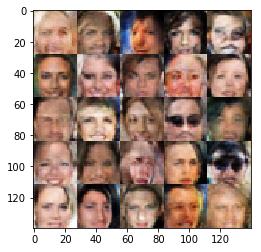

Epoch 5/5... Discriminator Loss: 1.0507... Generator Loss: 0.6231
Epoch 5/5... Discriminator Loss: 0.1162... Generator Loss: 2.7572
Epoch 5/5... Discriminator Loss: 0.0392... Generator Loss: 4.8295
Epoch 5/5... Discriminator Loss: 0.1022... Generator Loss: 3.2114
Epoch 5/5... Discriminator Loss: 0.6488... Generator Loss: 1.0135
Epoch 5/5... Discriminator Loss: 0.6548... Generator Loss: 0.9487
Epoch 5/5... Discriminator Loss: 0.0264... Generator Loss: 4.7810
Epoch 5/5... Discriminator Loss: 0.0891... Generator Loss: 3.2138
Epoch 5/5... Discriminator Loss: 0.0854... Generator Loss: 3.2605
Epoch 5/5... Discriminator Loss: 0.3421... Generator Loss: 1.7576


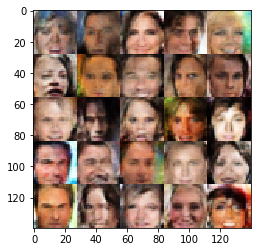

Epoch 5/5... Discriminator Loss: 0.2336... Generator Loss: 2.0119
Epoch 5/5... Discriminator Loss: 0.3535... Generator Loss: 1.5603
Epoch 5/5... Discriminator Loss: 0.0683... Generator Loss: 4.1836
Epoch 5/5... Discriminator Loss: 0.0668... Generator Loss: 3.5642
Epoch 5/5... Discriminator Loss: 0.0576... Generator Loss: 3.8928
Epoch 5/5... Discriminator Loss: 0.4222... Generator Loss: 1.4411
Epoch 5/5... Discriminator Loss: 0.0374... Generator Loss: 4.2137
Epoch 5/5... Discriminator Loss: 0.1480... Generator Loss: 2.4888
Epoch 5/5... Discriminator Loss: 0.2091... Generator Loss: 2.1237
Epoch 5/5... Discriminator Loss: 0.1388... Generator Loss: 2.6717


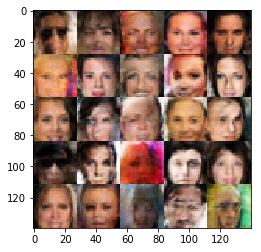

Epoch 5/5... Discriminator Loss: 0.0660... Generator Loss: 3.6939
Epoch 5/5... Discriminator Loss: 0.0328... Generator Loss: 4.2718
Epoch 5/5... Discriminator Loss: 0.1340... Generator Loss: 2.6419
Epoch 5/5... Discriminator Loss: 0.3789... Generator Loss: 1.5151
Epoch 5/5... Discriminator Loss: 0.2419... Generator Loss: 2.0131
Epoch 5/5... Discriminator Loss: 0.3730... Generator Loss: 1.6217
Epoch 5/5... Discriminator Loss: 0.1503... Generator Loss: 2.6308
Epoch 5/5... Discriminator Loss: 0.5482... Generator Loss: 1.1769
Epoch 5/5... Discriminator Loss: 0.6662... Generator Loss: 1.1855
Epoch 5/5... Discriminator Loss: 0.8298... Generator Loss: 2.5496


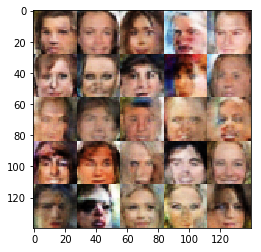

Epoch 5/5... Discriminator Loss: 0.4075... Generator Loss: 1.8186
Epoch 5/5... Discriminator Loss: 0.6338... Generator Loss: 3.0627
Epoch 5/5... Discriminator Loss: 0.5190... Generator Loss: 2.9036
Epoch 5/5... Discriminator Loss: 0.4821... Generator Loss: 1.4181
Epoch 5/5... Discriminator Loss: 0.1299... Generator Loss: 2.9657
Epoch 5/5... Discriminator Loss: 0.3719... Generator Loss: 1.6503
Epoch 5/5... Discriminator Loss: 0.0591... Generator Loss: 4.0699
Epoch 5/5... Discriminator Loss: 0.0427... Generator Loss: 4.5017
Epoch 5/5... Discriminator Loss: 0.1058... Generator Loss: 4.9529
Epoch 5/5... Discriminator Loss: 0.3500... Generator Loss: 4.8372


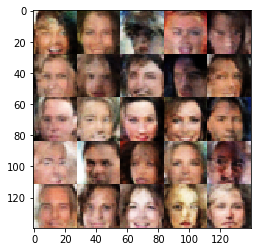

Epoch 5/5... Discriminator Loss: 0.9133... Generator Loss: 0.9945
Epoch 5/5... Discriminator Loss: 0.5003... Generator Loss: 1.6137
Epoch 5/5... Discriminator Loss: 0.2586... Generator Loss: 2.1231
Epoch 5/5... Discriminator Loss: 0.4603... Generator Loss: 1.6951
Epoch 5/5... Discriminator Loss: 2.9432... Generator Loss: 6.1273
Epoch 5/5... Discriminator Loss: 0.9504... Generator Loss: 0.7626
Epoch 5/5... Discriminator Loss: 0.6741... Generator Loss: 1.0292
Epoch 5/5... Discriminator Loss: 0.8636... Generator Loss: 0.8290
Epoch 5/5... Discriminator Loss: 0.8325... Generator Loss: 0.9187
Epoch 5/5... Discriminator Loss: 0.4363... Generator Loss: 4.2218


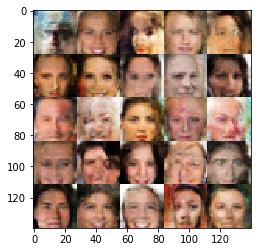

Epoch 5/5... Discriminator Loss: 0.4004... Generator Loss: 2.2708
Epoch 5/5... Discriminator Loss: 0.5862... Generator Loss: 1.0473
Epoch 5/5... Discriminator Loss: 0.5632... Generator Loss: 1.3519
Epoch 5/5... Discriminator Loss: 0.3267... Generator Loss: 1.8594
Epoch 5/5... Discriminator Loss: 0.5728... Generator Loss: 1.4788
Epoch 5/5... Discriminator Loss: 0.1576... Generator Loss: 2.5939
Epoch 5/5... Discriminator Loss: 1.0287... Generator Loss: 0.8092
Epoch 5/5... Discriminator Loss: 0.2864... Generator Loss: 2.0002
Epoch 5/5... Discriminator Loss: 0.5902... Generator Loss: 1.1736
Epoch 5/5... Discriminator Loss: 0.2330... Generator Loss: 2.0939


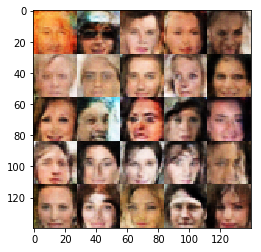

Epoch 5/5... Discriminator Loss: 0.2824... Generator Loss: 1.7747
Epoch 5/5... Discriminator Loss: 0.5032... Generator Loss: 1.2194
Epoch 5/5... Discriminator Loss: 0.2852... Generator Loss: 1.8758
Epoch 5/5... Discriminator Loss: 0.1683... Generator Loss: 2.5164
Epoch 5/5... Discriminator Loss: 0.2914... Generator Loss: 1.7752
Epoch 5/5... Discriminator Loss: 0.1401... Generator Loss: 2.7615
Epoch 5/5... Discriminator Loss: 0.4383... Generator Loss: 1.9672
Epoch 5/5... Discriminator Loss: 0.5253... Generator Loss: 1.2201
Epoch 5/5... Discriminator Loss: 0.4185... Generator Loss: 3.7539
Epoch 5/5... Discriminator Loss: 0.0617... Generator Loss: 3.8988


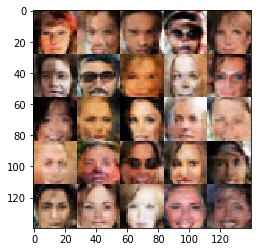

Epoch 5/5... Discriminator Loss: 0.2770... Generator Loss: 2.0014
Epoch 5/5... Discriminator Loss: 0.8283... Generator Loss: 0.8490
Epoch 5/5... Discriminator Loss: 0.1519... Generator Loss: 3.2275
Epoch 5/5... Discriminator Loss: 0.2983... Generator Loss: 2.2421
Epoch 5/5... Discriminator Loss: 0.6840... Generator Loss: 1.0128
Epoch 5/5... Discriminator Loss: 0.4885... Generator Loss: 1.3647
Epoch 5/5... Discriminator Loss: 0.1130... Generator Loss: 3.2278
Epoch 5/5... Discriminator Loss: 0.1747... Generator Loss: 2.5311
Epoch 5/5... Discriminator Loss: 0.3373... Generator Loss: 1.7674
Epoch 5/5... Discriminator Loss: 0.3606... Generator Loss: 1.7604


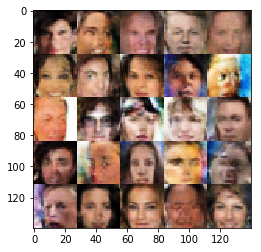

Epoch 5/5... Discriminator Loss: 0.2094... Generator Loss: 2.2873
Epoch 5/5... Discriminator Loss: 0.1567... Generator Loss: 2.5805
Epoch 5/5... Discriminator Loss: 0.1557... Generator Loss: 2.7938
Epoch 5/5... Discriminator Loss: 0.2418... Generator Loss: 2.1919
Epoch 5/5... Discriminator Loss: 0.5803... Generator Loss: 1.1788
Epoch 5/5... Discriminator Loss: 0.1024... Generator Loss: 2.9490
Epoch 5/5... Discriminator Loss: 0.1985... Generator Loss: 2.1858
Epoch 5/5... Discriminator Loss: 0.3237... Generator Loss: 1.8540
Epoch 5/5... Discriminator Loss: 0.0186... Generator Loss: 5.6063
Epoch 5/5... Discriminator Loss: 0.5081... Generator Loss: 1.2285


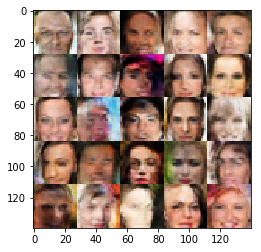

Epoch 5/5... Discriminator Loss: 0.0476... Generator Loss: 3.9285
Epoch 5/5... Discriminator Loss: 0.2142... Generator Loss: 2.5206
Epoch 5/5... Discriminator Loss: 0.1288... Generator Loss: 2.6274
Epoch 5/5... Discriminator Loss: 0.0604... Generator Loss: 3.7357
Epoch 5/5... Discriminator Loss: 0.3499... Generator Loss: 1.5531
Epoch 5/5... Discriminator Loss: 1.0489... Generator Loss: 0.5741
Epoch 5/5... Discriminator Loss: 2.4221... Generator Loss: 0.1627
Epoch 5/5... Discriminator Loss: 0.5714... Generator Loss: 1.2891
Epoch 5/5... Discriminator Loss: 0.4494... Generator Loss: 1.7089
Epoch 5/5... Discriminator Loss: 0.7279... Generator Loss: 0.9886


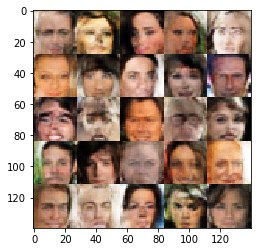

Epoch 5/5... Discriminator Loss: 0.5024... Generator Loss: 3.3049
Epoch 5/5... Discriminator Loss: 1.2413... Generator Loss: 0.5551
Epoch 5/5... Discriminator Loss: 0.6492... Generator Loss: 1.2840
Epoch 5/5... Discriminator Loss: 0.9530... Generator Loss: 0.8046
Epoch 5/5... Discriminator Loss: 0.3085... Generator Loss: 2.2205
Epoch 5/5... Discriminator Loss: 0.5072... Generator Loss: 1.9332
Epoch 5/5... Discriminator Loss: 0.6465... Generator Loss: 1.0197
Epoch 5/5... Discriminator Loss: 0.2842... Generator Loss: 2.4481
Epoch 5/5... Discriminator Loss: 0.2986... Generator Loss: 2.1281
Epoch 5/5... Discriminator Loss: 0.3527... Generator Loss: 1.6082


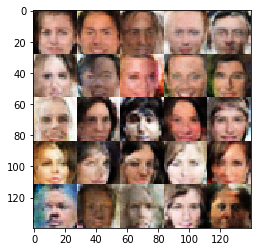

Epoch 5/5... Discriminator Loss: 0.5338... Generator Loss: 1.7447
Epoch 5/5... Discriminator Loss: 0.0932... Generator Loss: 3.7080
Epoch 5/5... Discriminator Loss: 0.3053... Generator Loss: 1.8185
Epoch 5/5... Discriminator Loss: 0.5025... Generator Loss: 6.1561
Epoch 5/5... Discriminator Loss: 0.8302... Generator Loss: 0.8393
Epoch 5/5... Discriminator Loss: 0.0905... Generator Loss: 4.3288
Epoch 5/5... Discriminator Loss: 0.2557... Generator Loss: 2.2387
Epoch 5/5... Discriminator Loss: 0.2890... Generator Loss: 2.0611
Epoch 5/5... Discriminator Loss: 0.3767... Generator Loss: 1.5981
Epoch 5/5... Discriminator Loss: 0.1619... Generator Loss: 2.6322


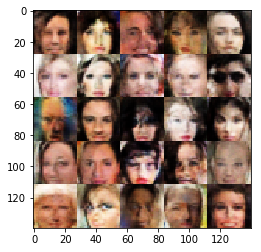

Epoch 5/5... Discriminator Loss: 0.6068... Generator Loss: 1.0796
Epoch 5/5... Discriminator Loss: 0.0880... Generator Loss: 3.2740
Epoch 5/5... Discriminator Loss: 0.4497... Generator Loss: 1.3740
Epoch 5/5... Discriminator Loss: 0.3151... Generator Loss: 1.6325
Epoch 5/5... Discriminator Loss: 0.5065... Generator Loss: 1.3150
Epoch 5/5... Discriminator Loss: 0.1556... Generator Loss: 3.4449
Epoch 5/5... Discriminator Loss: 0.2156... Generator Loss: 2.3532
Epoch 5/5... Discriminator Loss: 0.1930... Generator Loss: 2.1805
Epoch 5/5... Discriminator Loss: 1.7195... Generator Loss: 0.3063
Epoch 5/5... Discriminator Loss: 0.3878... Generator Loss: 1.7552


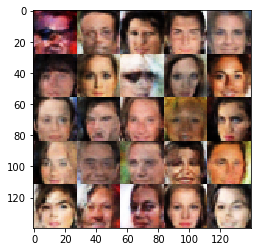

Epoch 5/5... Discriminator Loss: 0.2011... Generator Loss: 2.5141
Epoch 5/5... Discriminator Loss: 0.1495... Generator Loss: 2.5668
Epoch 5/5... Discriminator Loss: 0.2586... Generator Loss: 1.8949
Epoch 5/5... Discriminator Loss: 0.4283... Generator Loss: 1.3857
Epoch 5/5... Discriminator Loss: 0.3421... Generator Loss: 1.6380
Epoch 5/5... Discriminator Loss: 0.2716... Generator Loss: 2.0909
Epoch 5/5... Discriminator Loss: 0.1654... Generator Loss: 2.4382
Epoch 5/5... Discriminator Loss: 0.4670... Generator Loss: 1.2736
Epoch 5/5... Discriminator Loss: 0.1071... Generator Loss: 2.8845
Epoch 5/5... Discriminator Loss: 0.0929... Generator Loss: 3.0473


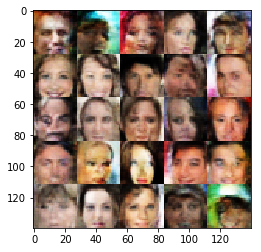

Epoch 5/5... Discriminator Loss: 0.0569... Generator Loss: 4.1945
Epoch 5/5... Discriminator Loss: 0.5244... Generator Loss: 1.1280
Epoch 5/5... Discriminator Loss: 0.0511... Generator Loss: 4.2504
Epoch 5/5... Discriminator Loss: 0.2042... Generator Loss: 2.1003
Epoch 5/5... Discriminator Loss: 0.2033... Generator Loss: 2.2226
Epoch 5/5... Discriminator Loss: 0.1890... Generator Loss: 2.3395
Epoch 5/5... Discriminator Loss: 0.6587... Generator Loss: 0.9690
Epoch 5/5... Discriminator Loss: 0.2741... Generator Loss: 2.0360
Epoch 5/5... Discriminator Loss: 0.2301... Generator Loss: 2.2023
Epoch 5/5... Discriminator Loss: 0.2127... Generator Loss: 2.1487


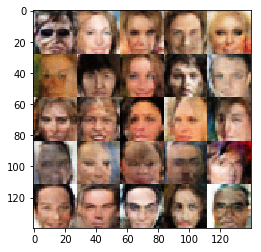

Epoch 5/5... Discriminator Loss: 0.3835... Generator Loss: 1.5221
Epoch 5/5... Discriminator Loss: 0.8839... Generator Loss: 0.8174
Epoch 5/5... Discriminator Loss: 0.1920... Generator Loss: 2.1651
Epoch 5/5... Discriminator Loss: 0.1184... Generator Loss: 3.0378
Epoch 5/5... Discriminator Loss: 1.3674... Generator Loss: 0.4238
Epoch 5/5... Discriminator Loss: 0.3548... Generator Loss: 3.9745
Epoch 5/5... Discriminator Loss: 0.4619... Generator Loss: 1.6111
Epoch 5/5... Discriminator Loss: 0.2775... Generator Loss: 2.8891
Epoch 5/5... Discriminator Loss: 0.4636... Generator Loss: 1.3571
Epoch 5/5... Discriminator Loss: 0.4123... Generator Loss: 1.6680


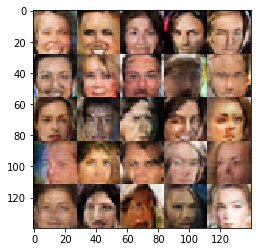

Epoch 5/5... Discriminator Loss: 0.0457... Generator Loss: 5.2799
Epoch 5/5... Discriminator Loss: 0.7197... Generator Loss: 0.9637
Epoch 5/5... Discriminator Loss: 0.2662... Generator Loss: 1.8291
Epoch 5/5... Discriminator Loss: 0.3044... Generator Loss: 1.8063
Epoch 5/5... Discriminator Loss: 0.0524... Generator Loss: 4.1507
Epoch 5/5... Discriminator Loss: 0.1809... Generator Loss: 2.3950
Epoch 5/5... Discriminator Loss: 0.4857... Generator Loss: 1.3211
Epoch 5/5... Discriminator Loss: 0.1751... Generator Loss: 2.2242
Epoch 5/5... Discriminator Loss: 0.0610... Generator Loss: 5.9295
Epoch 5/5... Discriminator Loss: 0.6596... Generator Loss: 1.0278


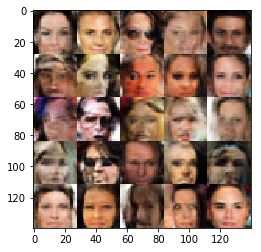

Epoch 5/5... Discriminator Loss: 0.2433... Generator Loss: 1.9025
Epoch 5/5... Discriminator Loss: 0.3263... Generator Loss: 1.7183
Epoch 5/5... Discriminator Loss: 0.1309... Generator Loss: 2.6184
Epoch 5/5... Discriminator Loss: 0.2317... Generator Loss: 2.0393
Epoch 5/5... Discriminator Loss: 0.0596... Generator Loss: 6.1014
Epoch 5/5... Discriminator Loss: 0.3310... Generator Loss: 1.6635
Epoch 5/5... Discriminator Loss: 0.7142... Generator Loss: 0.9350
Epoch 5/5... Discriminator Loss: 2.1116... Generator Loss: 0.1918
Epoch 5/5... Discriminator Loss: 0.4091... Generator Loss: 1.4517
Epoch 5/5... Discriminator Loss: 0.3486... Generator Loss: 1.5567


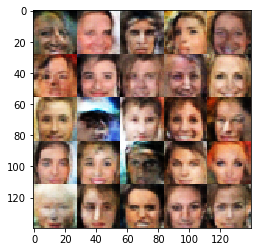

Epoch 5/5... Discriminator Loss: 0.0867... Generator Loss: 3.6139
Epoch 5/5... Discriminator Loss: 0.0775... Generator Loss: 5.0101
Epoch 5/5... Discriminator Loss: 0.4754... Generator Loss: 1.3303
Epoch 5/5... Discriminator Loss: 0.5451... Generator Loss: 1.1772
Epoch 5/5... Discriminator Loss: 0.0696... Generator Loss: 5.2645
Epoch 5/5... Discriminator Loss: 0.7425... Generator Loss: 0.9263
Epoch 5/5... Discriminator Loss: 2.7348... Generator Loss: 0.1328
Epoch 5/5... Discriminator Loss: 1.7142... Generator Loss: 3.1478
Epoch 5/5... Discriminator Loss: 0.7423... Generator Loss: 1.7390
Epoch 5/5... Discriminator Loss: 0.5519... Generator Loss: 1.6752


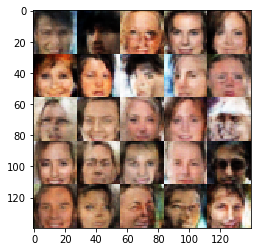

Epoch 5/5... Discriminator Loss: 0.3287... Generator Loss: 2.3016
Epoch 5/5... Discriminator Loss: 0.2907... Generator Loss: 2.6213
Epoch 5/5... Discriminator Loss: 0.2622... Generator Loss: 2.1506
Epoch 5/5... Discriminator Loss: 0.3337... Generator Loss: 1.6996
Epoch 5/5... Discriminator Loss: 0.4523... Generator Loss: 2.9475
Epoch 5/5... Discriminator Loss: 0.2981... Generator Loss: 3.1597
Epoch 5/5... Discriminator Loss: 0.4139... Generator Loss: 1.6032
Epoch 5/5... Discriminator Loss: 0.4413... Generator Loss: 1.6225
Epoch 5/5... Discriminator Loss: 0.3346... Generator Loss: 1.9700
Epoch 5/5... Discriminator Loss: 0.5391... Generator Loss: 5.1050


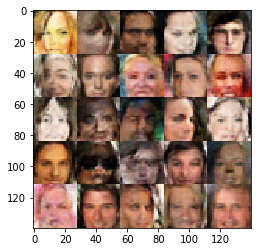

Epoch 5/5... Discriminator Loss: 0.3715... Generator Loss: 1.4722
Epoch 5/5... Discriminator Loss: 0.9310... Generator Loss: 0.7279
Epoch 5/5... Discriminator Loss: 0.2608... Generator Loss: 2.1721
Epoch 5/5... Discriminator Loss: 0.3064... Generator Loss: 1.8669
Epoch 5/5... Discriminator Loss: 0.7560... Generator Loss: 5.4323
Epoch 5/5... Discriminator Loss: 0.6073... Generator Loss: 3.2100
Epoch 5/5... Discriminator Loss: 0.5066... Generator Loss: 3.2157
Epoch 5/5... Discriminator Loss: 0.2424... Generator Loss: 2.3164
Epoch 5/5... Discriminator Loss: 0.4500... Generator Loss: 1.4342
Epoch 5/5... Discriminator Loss: 1.4220... Generator Loss: 0.4726


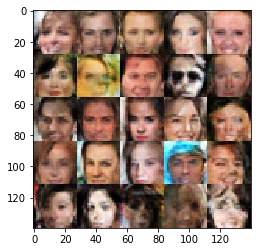

Epoch 5/5... Discriminator Loss: 0.3972... Generator Loss: 1.5666
Epoch 5/5... Discriminator Loss: 0.2128... Generator Loss: 2.3249
Epoch 5/5... Discriminator Loss: 0.4771... Generator Loss: 1.3256
Epoch 5/5... Discriminator Loss: 0.1705... Generator Loss: 2.6984
Epoch 5/5... Discriminator Loss: 0.4679... Generator Loss: 1.3914
Epoch 5/5... Discriminator Loss: 1.7929... Generator Loss: 0.2690
Epoch 5/5... Discriminator Loss: 0.1570... Generator Loss: 2.3993
Epoch 5/5... Discriminator Loss: 0.2342... Generator Loss: 2.0446
Epoch 5/5... Discriminator Loss: 0.2274... Generator Loss: 2.0150
Epoch 5/5... Discriminator Loss: 0.1105... Generator Loss: 4.3644


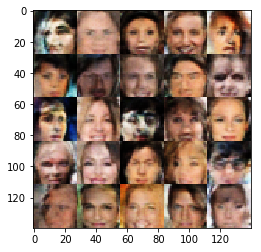

Epoch 5/5... Discriminator Loss: 0.0546... Generator Loss: 4.2677
Epoch 5/5... Discriminator Loss: 0.1357... Generator Loss: 2.3921
Epoch 5/5... Discriminator Loss: 0.3883... Generator Loss: 1.5026
Epoch 5/5... Discriminator Loss: 0.1974... Generator Loss: 2.2990
Epoch 5/5... Discriminator Loss: 0.2224... Generator Loss: 2.1394
Epoch 5/5... Discriminator Loss: 0.3603... Generator Loss: 1.5708
Epoch 5/5... Discriminator Loss: 0.0819... Generator Loss: 3.4209
Epoch 5/5... Discriminator Loss: 0.1425... Generator Loss: 2.7202
Epoch 5/5... Discriminator Loss: 0.1467... Generator Loss: 2.8863
Epoch 5/5... Discriminator Loss: 0.2295... Generator Loss: 2.0561


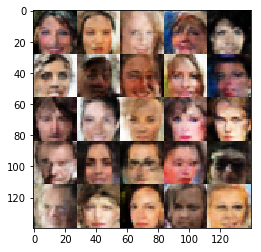

Epoch 5/5... Discriminator Loss: 0.1007... Generator Loss: 2.9178
Epoch 5/5... Discriminator Loss: 0.1134... Generator Loss: 2.6547
Epoch 5/5... Discriminator Loss: 0.2953... Generator Loss: 1.8422
Epoch 5/5... Discriminator Loss: 0.0452... Generator Loss: 3.9830
Epoch 5/5... Discriminator Loss: 0.8621... Generator Loss: 0.7736
Epoch 5/5... Discriminator Loss: 0.0252... Generator Loss: 5.7506
Epoch 5/5... Discriminator Loss: 0.3962... Generator Loss: 1.7075
Epoch 5/5... Discriminator Loss: 0.2611... Generator Loss: 3.1351
Epoch 5/5... Discriminator Loss: 0.2815... Generator Loss: 2.0207
Epoch 5/5... Discriminator Loss: 0.5942... Generator Loss: 1.2868


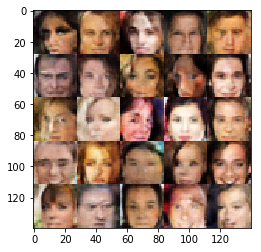

Epoch 5/5... Discriminator Loss: 0.3076... Generator Loss: 2.0224
Epoch 5/5... Discriminator Loss: 0.5025... Generator Loss: 1.2960
Epoch 5/5... Discriminator Loss: 0.2091... Generator Loss: 2.4149
Epoch 5/5... Discriminator Loss: 0.1446... Generator Loss: 2.7428
Epoch 5/5... Discriminator Loss: 0.2473... Generator Loss: 2.1778
Epoch 5/5... Discriminator Loss: 0.1861... Generator Loss: 4.0666
Epoch 5/5... Discriminator Loss: 0.4037... Generator Loss: 1.4536
Epoch 5/5... Discriminator Loss: 0.2098... Generator Loss: 2.1618
Epoch 5/5... Discriminator Loss: 0.5315... Generator Loss: 1.2288
Epoch 5/5... Discriminator Loss: 0.1872... Generator Loss: 2.7505


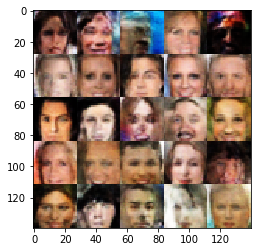

Epoch 5/5... Discriminator Loss: 0.0449... Generator Loss: 4.4206
Epoch 5/5... Discriminator Loss: 0.2210... Generator Loss: 2.1259
Epoch 5/5... Discriminator Loss: 0.0615... Generator Loss: 3.4780
Epoch 5/5... Discriminator Loss: 0.0638... Generator Loss: 3.6699
Epoch 5/5... Discriminator Loss: 0.0695... Generator Loss: 3.3192
Epoch 5/5... Discriminator Loss: 0.7298... Generator Loss: 1.0382
Epoch 5/5... Discriminator Loss: 0.2900... Generator Loss: 3.3438
Epoch 5/5... Discriminator Loss: 0.2380... Generator Loss: 2.0580
Epoch 5/5... Discriminator Loss: 0.1683... Generator Loss: 2.3007
Epoch 5/5... Discriminator Loss: 0.0344... Generator Loss: 6.0673


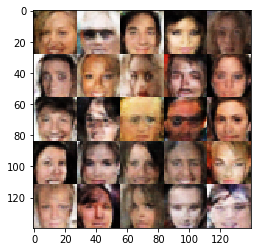

Epoch 5/5... Discriminator Loss: 0.2208... Generator Loss: 2.1224
Epoch 5/5... Discriminator Loss: 0.4903... Generator Loss: 1.3381
Epoch 5/5... Discriminator Loss: 0.8324... Generator Loss: 5.1686
Epoch 5/5... Discriminator Loss: 0.9954... Generator Loss: 2.5781
Epoch 5/5... Discriminator Loss: 0.7444... Generator Loss: 2.0896
Epoch 5/5... Discriminator Loss: 1.0204... Generator Loss: 0.7374
Epoch 5/5... Discriminator Loss: 0.3897... Generator Loss: 2.2072
Epoch 5/5... Discriminator Loss: 0.3089... Generator Loss: 1.9506
Epoch 5/5... Discriminator Loss: 0.0611... Generator Loss: 3.6830
Epoch 5/5... Discriminator Loss: 0.4224... Generator Loss: 1.3234


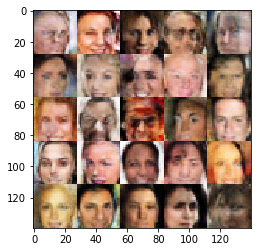

Epoch 5/5... Discriminator Loss: 2.2285... Generator Loss: 0.1765
Epoch 5/5... Discriminator Loss: 0.1204... Generator Loss: 3.1639


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.